In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir('/content/drive/MyDrive/optiver_real_vol')

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

!pip install umap
!pip install tsfresh
!pip install optuna


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mon Aug 26 11:44:24 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0              54W / 400W |    683MiB / 40960MiB |      0%      Default |
|                            

In [ ]:

import pandas as pd
import numpy as np # linear algebra
import glob
import os
import gc
import pickle

from joblib import Parallel, delayed

from sklearn import model_selection
import lightgbm as lgb

from sklearn.metrics import r2_score


%matplotlib inline
# %matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
#%matplotlib inline
import plotly.express as px
from IPython.display import display
import seaborn as sns
import plotly.subplots as sub_plots
import plotly.graph_objects as go
#from umap import UMAP

import statsmodels.api as sm

from scipy.stats import binned_statistic
from scipy.stats import kurtosis, skew

from numba import jit


# data_dir = '/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data'
data_dir = '/content/drive/MyDrive/optiver_real_vol/Datasets/optimus_GPU_data/data/'


from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
import scipy as sp
from sklearn.metrics import silhouette_samples,silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.preprocessing import MinMaxScaler

import tsfresh as tsf
from tsfresh.utilities.dataframe_functions import impute

In [ ]:



train = pd.read_csv(data_dir + 'train.csv')

unique_stock_ids = train['stock_id'].unique()
all_uniq_time_ids = pd.DataFrame({'time_id':train['time_id'].unique()})

# unique_stock_ids = np.array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  13,
#         14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  26,  27,  28,
#         29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
#         42,  43,  44,  46,  47,  48,  50,  51,  52,  53,  55,  56,  58,
#         59,  60,  61,  62,  63,  64,  66,  67,  68,  69,  70,  72,  73,
#         74,  75,  76,  77,  78,  80,  81,  82,  83,  84,  85,  86,  87,
#         88,  89,  90,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
#        103, 104, 105, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
#        118, 119, 120, 122, 123, 124, 125, 126])


In [ ]:
# analyzed effect of log transformation on the skew and kurtosis and mean.



st_skew_book_log_ask1 = np.array([])
st_skew_book_log_bid1 = np.array([])
st_kurt_book_log_ask1 = np.array([])
st_kurt_book_log_bid1 = np.array([])
st_skew_trade_log_price = np.array([])
st_kurt_trade_logprice = np.array([])

st_skew_book_ask1 = np.array([])
st_skew_book_bid1 = np.array([])
st_kurt_book_ask1 = np.array([])
st_kurt_book_bid1 = np.array([])
st_skew_trade_price = np.array([])
st_kurt_trade_price = np.array([])


for st in unique_stock_ids:
    book_data = pd.read_parquet(os.path.join(data_dir, 'book_{}.parquet/stock_id={}/'.format('train', st)))
    trade_data = pd.read_parquet(os.path.join(data_dir, 'trade_{}.parquet/stock_id={}/'.format('train', st)))
    book_data['log_bid_price1'] = book_data['bid_price1'].apply(np.log)
    book_data['log_ask_price1'] = book_data['ask_price1'].apply(np.log)
    trade_data['log_price'] = trade_data['price'].apply(np.log)

    st_skew_book_log_ask1 = np.append(st_skew_book_log_ask1, skew(book_data['log_ask_price1']))
    st_skew_book_log_bid1 = np.append(st_skew_book_log_bid1, skew(book_data['log_bid_price1']))
    st_kurt_book_log_ask1 = np.append(st_kurt_book_log_ask1, kurtosis(book_data['log_ask_price1']))
    st_kurt_book_log_bid1 = np.append(st_kurt_book_log_bid1, kurtosis(book_data['log_bid_price1']))
    st_skew_trade_log_price = np.append(st_skew_trade_log_price, skew(trade_data['log_price']))
    st_kurt_trade_logprice = np.append(st_kurt_trade_logprice, kurtosis(trade_data['log_price']))

    st_skew_book_ask1 = np.append(st_skew_book_ask1, skew(book_data['ask_price1']))
    st_skew_book_bid1 = np.append(st_skew_book_bid1, skew(book_data['bid_price1']))
    st_kurt_book_ask1 = np.append(st_kurt_book_ask1, kurtosis(book_data['ask_price1']))
    st_kurt_book_bid1 = np.append(st_kurt_book_bid1, kurtosis(book_data['bid_price1']))
    st_skew_trade_price = np.append(st_skew_trade_price, skew(trade_data['price']))
    st_kurt_trade_price = np.append(st_kurt_trade_price, kurtosis(trade_data['price']))

    # print(book_data['log_bid_price1'].describe())
    # book_data['log_bid_price1'] = book_data['bid_price1'].apply(np.log)
    # book_data.hist(column=['bid_price1','log_bid_price1'], bins=100, figsize=(20,10))

# convert to numpy array

fig = go.Figure()
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_skew_book_log_ask1[st_skew_book_log_ask1 < 0], name='skew (book log ask1)'))
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_skew_book_ask1[st_skew_book_log_ask1 < 0], name='skew (book ask1)'))
fig.update_layout(barmode='group', xaxis_tickangle=-45, title='skew of book ask1')
fig.show()

fig = go.Figure()
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_kurt_book_log_ask1[st_skew_book_log_ask1 < 0], name='kurtosis (book log ask1)'))
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_kurt_book_ask1[st_skew_book_log_ask1 < 0], name='kurtosis (book ask1)'))
fig.update_layout(barmode='group', xaxis_tickangle=-45, title='kurtosis of book ask1')
fig.show()

fig = go.Figure()
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_skew_book_log_bid1, name='skew (book log bid1)'))
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_skew_book_bid1, name='skew (book bid1)'))
fig.update_layout(barmode='group', xaxis_tickangle=-45, title='skew of book bid1')
fig.show()

fig = go.Figure()
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_kurt_book_log_bid1, name='kurtosis (book log bid1)'))
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_kurt_book_bid1, name='kurtosis (book bid1)'))
fig.update_layout(barmode='group', xaxis_tickangle=-45, title='kurtosis of book bid1')
fig.show()

fig = go.Figure()
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_skew_trade_log_price, name='skew (trade log price)'))
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_skew_trade_price, name='skew (trade price)'))
fig.update_layout(barmode='group', xaxis_tickangle=-45, title='skew of trade price')
fig.show()

fig = go.Figure()
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_kurt_trade_logprice, name='kurtosis (trade log price)'))
fig.add_trace(go.Bar(x=unique_stock_ids, y=st_kurt_trade_price, name='kurtosis (trade price)'))
fig.update_layout(barmode='group', xaxis_tickangle=-45, title='kurtosis of trade price')
fig.show()




KeyboardInterrupt: 

In [ ]:
## log transofremation of price centers the distribution around 0. uses both positive and negative values which is easier for learning.

fig = go.Figure()
fig.add_trace(go.Histogram(x=trade_data['price'], name='trade price', nbinsx=1000))
fig.add_trace(go.Histogram(x=trade_data['log_price'], name='log trade price', nbinsx=1000))
fig.show()


In [ ]:
######## Visualize mid_price (equilibrium price) vs equilibrium price function f(mp)
######## f(mp) = Demand(mp) - Supply(mp) = buy(mp) - ask(mp)
######## mp lower when asksize is big and higher when bidsize is big

bsize1 = 200 # 10000
bsize2 = 200 # 10000
asize1 = 10000 # 200
asize2 = 10000 # 200

loga2 = 100
loga1 = 90
logb1 = 10
logb2 = 1

lvl = 1
s = 1
f_arr = []

for mp in range(5,100,10):
    inv_diff_a2 = 1.0/( 1000*( mp - loga2 ) )
    inv_diff_a1 = 1.0/( 1000*( mp - loga1 ) )
    inv_diff_b1 = 1.0/( 1000*( mp - logb1 ) ) # negative
    inv_diff_b2 = 1.0/( 1000*( mp - logb2 ) ) # negative


    f  = -(   ( bsize2*inv_diff_b2**(lvl+1) + bsize1*inv_diff_b1**(lvl+1) )
            + s*( asize1*inv_diff_a1**(lvl+1) + asize2*inv_diff_a2**(lvl+1) ) )

    f_arr.append(f)

plt.plot(range(5,100,10),f_arr)
plt.show()

In [ ]:

def find_equilibrium_price(book_data, lvl, iterations=22):
    loga2 = np.array(book_data['log_ask_price2'])
    loga1 = np.array(book_data['log_ask_price1'])
    logb1 = np.array(book_data['log_bid_price1'])
    logb2 = np.array(book_data['log_bid_price2'])

    asize2 = np.array(book_data['ask_size2'])
    asize1 = np.array(book_data['ask_size1'])
    bsize1 = np.array(book_data['bid_size1'])
    bsize2 = np.array(book_data['bid_size2'])

    ub = loga1
    lb = logb1

    s = (-1)**lvl
    for iter in range(iterations):
        mid_price = (ub + lb)/2.0
        inv_diff_a2 = 1.0/( 1000*( mid_price - loga2 ) )
        inv_diff_a1 = 1.0/( 1000*( mid_price - loga1 ) )
        inv_diff_b1 = 1.0/( 1000*( mid_price - logb1 ) ) # negative
        inv_diff_b2 = 1.0/( 1000*( mid_price - logb2 ) ) # negative

        f  = -(   ( bsize2*inv_diff_b2**(lvl+1) + bsize1*inv_diff_b1**(lvl+1) )
              + s*( asize1*inv_diff_a1**(lvl+1) + asize2*inv_diff_a2**(lvl+1) ) )

        # when lvl = even, f is positive when buy side missing volume is larger than sell side missing volume
        # when lvl = even, f is negative when sell side missing volume is larger than buy side missing volume
        # when lvl = odd, f is positive when sell side missing volume is larger than buy side missing volume and vice versa

        dub = - (ub-lb)/2.0*(f>=0)
        dlb =   (ub-lb)/2.0*(f< 0)

        # when f is positive, mid price moves towards buy side (bid_price) by reducing the upper bound
        # when f is negative, mid price moves towards sell side (ask_price) by increasing the lower bound
        ub = ub + dub
        lb = lb + dlb

    equilibrium_price = (ub + lb)/2.0

    return equilibrium_price


In [ ]:
def diff(list_stock_prices):
    return list_stock_prices.diff()

In [ ]:
@jit()
def bucketized_summed_data(seconds_arr, time_id, data, buk_width, n_buks, time_ids_size):
    z = np.zeros( (time_ids_size,n_buks) ) # 30 buckets for 600 seconds (10 minutes)

    t_id  = 0
    for s in range(seconds_arr.shape[0]): # seconds.shape[0] is total size of the seconds column i.e. total rows in seconds column

        if time_id[s] != time_id[max(s-1,0)]:
            t_id = t_id + 1

        z[t_id, int(seconds_arr[s]//buk_width)] += data[s]

    return z



In [ ]:
@jit(nopython=True)
def end_bucket(buk_width, buk_sum:float, buk_weight:float, last_val, last_weight, last_time)->float:
    dt = buk_width - last_time%buk_width

    buk_weight += 1.0*last_weight*dt
    buk_sum    += 1.0*last_weight*dt*last_val

    return float(buk_sum/(buk_weight + 1e-8))

In [ ]:
@jit()
def bucketized_time_weighted_avg_data(seconds_arr, time_id_arr, data,weights, buk_width, n_buks, time_ids_size):

    z = np.zeros( (time_ids_size,n_buks) )

    prev_time   = 0
    prev_weight = 0.0
    prev_val    = 0.0

    buk_sum = 0.0
    buk_weight = 0.0

    t_id  = 0  # time id
    buk = 0  # bucket id
    for idx in range(seconds_arr.shape[0]): # seconds.shape[0] is total size of the seconds column i.e. total rows in seconds column

        if time_id_arr[idx] != time_id_arr[max(idx-1,0)]: # transition to new time id
            z[t_id, buk] = float(end_bucket(buk_width, buk_sum, buk_weight, prev_val, prev_weight, prev_time))
            buk += 1

            while buk < z.shape[1]:
                z[t_id, buk] = prev_val
                buk += 1
            t_id += 1
            buk = 0

            prev_time  = 0
            buk_sum    = 0.0
            buk_weight = 0.0

        if int(seconds_arr[idx]//buk_width) != int(prev_time//buk_width): # transition to new bucket

            z[t_id, buk] = float(end_bucket(buk_width, buk_sum, buk_weight, prev_val, prev_weight, prev_time)) # end the previous bucket
            buk += 1 # move to next bucket

            while buk < seconds_arr[idx]//buk_width:
                z[t_id, buk] = prev_val
                buk += 1

            prev_time  = buk_width*(seconds_arr[idx]//buk_width)
            buk_sum    = 0.0
            buk_weight = 0.0

        buk_sum    += prev_val*prev_weight*(seconds_arr[idx] - prev_time)  # in the same bucket
        buk_weight +=          prev_weight*(seconds_arr[idx] - prev_time)  # in the same bucket

        prev_time   = seconds_arr[idx] # in the same bucket
        prev_val    = data[idx] # in the same bucket
        prev_weight = weights[idx] # in the same bucket

    z[t_id, buk] = end_bucket(buk_width, buk_sum, buk_weight, prev_val, prev_weight, prev_time)

    for buk in range(buk+1, z.shape[1]): # all buckets of the last time id
        z[t_id, buk] = prev_val

    return z

In [ ]:
def create_stock_data(st_id, dset):

    cols = ['st_id', 'time_id', 'seconds_in_bucket']

    ############################## BOOK DATA ##########################################

    book_data = pd.read_parquet(os.path.join(data_dir, 'book_{}.parquet/stock_id={}/'.format(dset, st_id)))

    book_data['st_id'] = st_id

    columns = cols + [col for col in book_data.columns if col not in cols]
    book_data = book_data[columns]
    # columns = 'st_id', 'time_id', 'seconds_in_bucket', 'bid_price1', 'ask_price1', 'bid_price2', 'ask_price2', 'bid_size1', 'ask_size1', 'bid_size2', 'ask_size2'

    # volume
    book_data['ask_volume1'] = book_data['ask_price1']*book_data['ask_size1']
    book_data['ask_volume2'] = book_data['ask_price2']*book_data['ask_size2']
    book_data['bid_volume1'] = book_data['bid_price1']*book_data['bid_size1']
    book_data['bid_volume2'] = book_data['bid_price2']*book_data['bid_size2']

    # becomes zero centered, reduces skew and kurtosis slightly bringing it slightly closer to normal for right skewed data, It is increases/worsens
    # skew and kurtosis for left-skewed data
    # correct way is to use box-cox transformation, variance stabilization
    # Most stocks are right skewed only a few are left skewed?
    book_data['log_ask_price1'] = np.log( book_data['ask_price1'] )
    book_data['log_ask_price2'] = np.log( book_data['ask_price2'] )
    book_data['log_bid_price1'] = np.log( book_data['bid_price1'] )
    book_data['log_bid_price2'] = np.log( book_data['bid_price2'] )

    # redefining WAP using log prices
    book_data['wap1_log_price'] = ( book_data['log_bid_price1'] * book_data['ask_size1'] + book_data['log_ask_price1'] * book_data['bid_size1'] ) / (book_data['bid_size1'] + book_data['ask_size1'])
    book_data['wap2_log_price'] = ( book_data['log_bid_price2'] * book_data['ask_size2'] + book_data['log_ask_price2'] * book_data['bid_size2'] ) / (book_data['bid_size2'] + book_data['ask_size2'])

    # Find equilibrium price at which trades are likely to happen
    # This price minimizes the missing total volume from buy and sell side
    book_data['wap_eqi_price0'] = find_equilibrium_price( book_data, lvl=0)
    book_data['wap_eqi_price1'] = find_equilibrium_price( book_data, lvl=1)
    book_data['wap_eqi_price2'] = find_equilibrium_price( book_data, lvl=2)
    # book_data['wap_eqi_price3'] = find_equilibrium_price( book_data, lvl=3)
    # book_data['wap_eqi_price4'] = find_equilibrium_price( book_data, lvl=4)


    # equilibrium price has converged closer to
    book_data['liquidity0'] = (
                  book_data['bid_volume1']/( 1000*(book_data['wap_eqi_price0'] - book_data['log_bid_price1']) )
                + book_data['bid_volume2']/( 1000*(book_data['wap_eqi_price0'] - book_data['log_bid_price2']) )
                - book_data['ask_volume1']/( 1000*(book_data['wap_eqi_price0'] - book_data['log_ask_price1']) )
                - book_data['ask_volume2']/( 1000*(book_data['wap_eqi_price0'] - book_data['log_ask_price2']) )
    )

    # liquidity 0 and liquidity 1 are negatively correlated with each other, if one has prices moving towards buy side, the other has price moving towards sell side
    book_data['liquidity1'] = (
                  book_data['bid_volume1']/( 1000*(book_data['wap_eqi_price1'] - book_data['log_bid_price1']) )
                + book_data['bid_volume2']/( 1000*(book_data['wap_eqi_price1'] - book_data['log_bid_price2']) )
                - book_data['ask_volume1']/( 1000*(book_data['wap_eqi_price1'] - book_data['log_ask_price1']) )
                - book_data['ask_volume2']/( 1000*(book_data['wap_eqi_price1'] - book_data['log_ask_price2']) )
    )

    book_data['liquidity2'] = (
                  book_data['bid_volume1']/( 1000*(book_data['wap_eqi_price2'] - book_data['log_bid_price1']) )**2
                + book_data['bid_volume2']/( 1000*(book_data['wap_eqi_price2'] - book_data['log_bid_price2']) )**2
                + book_data['ask_volume1']/( 1000*(book_data['wap_eqi_price2'] - book_data['log_ask_price1']) )**2
                + book_data['ask_volume2']/( 1000*(book_data['wap_eqi_price2'] - book_data['log_ask_price2']) )**2
    )

    book_data['spread']     = book_data['log_ask_price1'] - book_data['log_bid_price1']
    book_data['inv_spread'] = (book_data['log_ask_price1'] - book_data['log_bid_price1'])**-2 # inverse of spread has the effect of amplifying low values and diminishing high values
    book_data['log_spread'] = book_data['spread'].apply(np.log) # log of spread has the effect of amplifying low values and diminishing high values. It can normalize right skewed data
    book_data['log_spread2'] = np.log(book_data['log_ask_price2'] - book_data['log_bid_price2'])

    book_data['book_size1'] = book_data['ask_volume1'] + book_data['bid_volume1']
    book_data['book_size'] = book_data['ask_volume1'] + book_data['bid_volume1'] + book_data['ask_volume2'] + book_data['bid_volume2']

    # difference betweeen ask's level 1 and level 2 liquidity
    # posiitive means level 2 ask liquidity is higher than level 1 ask liquidity
    book_data['ask_liq1_diff'] = (
                  book_data['ask_volume1']/( 1000*(book_data['wap_eqi_price1'] - book_data['log_ask_price1']) )**1
               -  book_data['ask_volume2']/( 1000*(book_data['wap_eqi_price1'] - book_data['log_ask_price2']) )**1
    )

    # difference betweeen bid's level 1 and level 2 liquidity
    # posiitive means level 1 bid liquidity is higher than level 2 bid liquidity
    book_data['bid_liq1_diff'] = (
                  book_data['bid_volume1']/( 1000*(book_data['wap_eqi_price1'] - book_data['log_bid_price1']) )**1
               -  book_data['bid_volume2']/( 1000*(book_data['wap_eqi_price1'] - book_data['log_bid_price2']) )**1
    )

    # simple returns on prices wap1_log_price,wap2_log_price,wap_eqi_price0,wap_eqi_price1
    book_data['wap1_log_price_ret' ] = book_data.groupby(by = ['time_id'])['wap1_log_price'].apply(diff).fillna(0).values
    book_data['wap2_log_price_ret' ] = book_data.groupby(by = ['time_id'])['wap2_log_price'].apply(diff).fillna(0).values
    book_data['wap_eqi_price0_ret'] = book_data.groupby(by = ['time_id'])['wap_eqi_price0'].apply(diff).fillna(0).values
    book_data['wap_eqi_price1_ret'] = book_data.groupby(by = ['time_id'])['wap_eqi_price1'].apply(diff).fillna(0).values

    # this indicates the changes in level 2 wap when level 1 wap does NOT change
    # This happens when all orders in level 1 are filled and new orders are placed in level 2
    # indication of liquidity as prices in level 2 are moving towards level 1
    # Aggressive Market Orders, Imbalance in Market Depth, Execution of Large Orders, Liquidity Changes:
    book_data['wap2_log_price_ret_changes_n_wap1_log_price_ret_constant'] = book_data['wap2_log_price_ret' ]*(book_data['wap1_log_price_ret' ]==0)

    # variance stabilization of right skewed data.
    book_data['log_liquidity1'] = np.log(book_data['liquidity1'])
    book_data['log_liquidity2'] = np.log(book_data['liquidity2'])

    # simple returns on liquidity / first order changes in liquidity
    book_data['log_liquidity1_ret'] = book_data.groupby(by = ['time_id'])['log_liquidity1'].apply(diff).fillna(0).values
    book_data['log_liquidity2_ret'] = book_data.groupby(by = ['time_id'])['log_liquidity2'].apply(diff).fillna(0).values
    # simple returns on log_spread / first order changes in log_spread
    book_data['log_spread_ret'] = book_data.groupby(by = ['time_id'])['log_spread'].apply(diff).fillna(0).values

    # wap1 price returns when liquidity1 is positive/increases and negative/decreases
    book_data['wap1_log_price_ret_pos_log_liq_ret'] = (book_data['log_liquidity1_ret']>0)*book_data['wap1_log_price_ret']
    book_data['wap1_log_price_ret_neg_log_liq_ret'] = (book_data['log_liquidity1_ret']<0)*book_data['wap1_log_price_ret']


    ids = np.array(book_data[['st_id', 'time_id']]) # single stock and all time_ids and seconda_in_bucket
    ids = np.unique(ids, axis=0)
    book_n_trade_data = {}
    book_n_trade_data['time_id'] = ids[:,1:2]

    # bucketized data for book data
    # Amount of wap1 price movements in a time bucket of 30 seconds, i.e. wap1 returns volatitlity in bucket
    book_n_trade_data['wap1_log_price_ret_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                    np.array(book_data['time_id']),
                                    np.array(book_data['wap1_log_price_ret']),
                                    20, 30, ids.shape[0])

    # Amount of absolute wap1 price movements in a time bucket of 30 seconds, i.e. ahsolute wap1 returns volatitlity in bucket
    book_n_trade_data['wap1_log_price_ret_abs_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                    np.array(book_data['time_id']),
                                    np.abs(np.array(book_data['wap1_log_price_ret'])),
                                    20, 30, ids.shape[0])

    # Amount of absolute wap2 price movements in a time bucket of 30 seconds, i.e.  ahsolute wap2 returns volatitlity in bucket
    book_n_trade_data['wap2_log_price_ret_abs_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                    np.array(book_data['time_id']),
                                    np.abs(np.array(book_data['wap2_log_price_ret'])),
                                    20, 30, ids.shape[0])

      # wap1 returns variance/ squared volatitlity in bucket
    book_n_trade_data['wap1_log_price_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                    np.array(book_data['time_id']),
                                    np.array(book_data['wap1_log_price_ret'])**2,
                                    20, 30, ids.shape[0])
    # wap2 returns variance/ squared volatitlity in bucket
    book_n_trade_data['wap2_log_price_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                    np.array(book_data['time_id']),
                                    np.array(book_data['wap2_log_price_ret'])**2,
                                    20, 30, ids.shape[0])

    # squared wap1 returns volatitlity in bucket
    book_n_trade_data['wap1_log_price_ret_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                    np.array(book_data['time_id']),
                                    np.array(book_data['wap1_log_price_ret'])**2,
                                    20, 30, ids.shape[0])**0.5
    # squared wap2 returns volatitlity in bucket
    book_n_trade_data['wap2_log_price_ret_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                    np.array(book_data['time_id']),
                                    np.array(book_data['wap2_log_price_ret'])**2,
                                    20, 30, ids.shape[0])**0.5

    # squared wap2_log_price_ret_changes_n_wap1_log_price_ret_constant volatitlity in bucket
    book_n_trade_data['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                    np.array(book_data['time_id']),
                                    np.array(book_data['wap2_log_price_ret_changes_n_wap1_log_price_ret_constant'])**2,
                                    20, 30, ids.shape[0])**0.5

    # equilibrium price returns absolute volatitlity in bucket
    book_n_trade_data['wap_eqi_price0_ret_abs_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.abs(np.array(book_data['wap_eqi_price0_ret'])),
                                       20, 30, ids.shape[0])

    # squared equilibrium price returns volatitlity in bucket
    book_n_trade_data['wap_eqi_price0_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(book_data['wap_eqi_price0_ret'])**2,
                                       20, 30, ids.shape[0])**0.5

    # volatitlity in wap1_log_price_ret when liquidity1 return is positive. i.e. increases
    book_n_trade_data['wap1_log_price_ret_pos_log_liq_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(book_data['wap1_log_price_ret_pos_log_liq_ret'])**2,
                                       20, 30, ids.shape[0])**0.5
    # volatitlity in wap1_log_price_ret when liquidity1 is negative. i.e. decreases
    book_n_trade_data['wap1_log_price_ret_neg_log_liq_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(book_data['wap1_log_price_ret_neg_log_liq_ret'])**2,
                                       20, 30, ids.shape[0])**0.5

    # squared wap equilibrium price 1 returns volatitlity in bucket
    book_n_trade_data['wap_eqi_price1_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(book_data['wap_eqi_price1_ret'])**2,
                                       20, 30, ids.shape[0])**0.5

    book_n_trade_data['log_liq2_ret_*_wap_eqi_price1_ret_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array((book_data['log_liquidity2_ret']*book_data['wap_eqi_price1_ret'])**2 ),
                                       20, 30, ids.shape[0])

    # squared wap equilibrium price 1 returns volatitlity in bucket amplified (> 1) by positive/increasing liquidity returns (through exponent)
    # and diminished ( < 1) by negative/decreasing liquidity returns (through exponent)
    book_n_trade_data['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(( np.exp(book_data['log_liquidity1_ret'])*book_data['wap_eqi_price1_ret'])**2 ),
                                       20, 30, ids.shape[0])
    # copy of above
    book_n_trade_data['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_buks_2'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(( np.exp(book_data['log_liquidity1_ret'])*book_data['wap_eqi_price1_ret'])**2 ),
                                       20, 30, ids.shape[0])
    # variance/ squared volatitliy of wap1 price returns per unit of spread
    # large value indicates volatilty
    book_n_trade_data['wap1_log_price_ret_per_spread_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(( book_data['wap1_log_price_ret']/book_data['spread'])**2 ),
                                       20, 30, ids.shape[0])
    # variance/ squared volatitliy of wap1 price returns per unit of liquidity
    # small value indicates volatilty?
    book_n_trade_data['wap1_log_price_ret_per_liq2_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array( ( book_data['wap1_log_price_ret'])**2/book_data['liquidity2'] ),
                                       20, 30, ids.shape[0])

    # measure of variance/ squared volatility of liquidity1 returns
    book_n_trade_data['log_liquidity1_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(book_data['log_liquidity1_ret'])**2,
                                       20, 30, ids.shape[0])

    # measure of variance/ squared volatility of liquidity2 returns
    book_n_trade_data['log_liquidity2_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(book_data['log_liquidity2_ret'])**2,
                                       20, 30, ids.shape[0])

    # measure of variance/ squared volatility of log spread returns
    book_n_trade_data['log_spread_ret_sqr_vol_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                       np.array(book_data['log_spread_ret'])**2,
                                       20, 30, ids.shape[0])

    # counting number of data points available in each time bucket
    book_n_trade_data['book_delta_count_buks'] = bucketized_summed_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array(book_data['wap1_log_price_ret']*0+1.0),
                                         20, 30, ids.shape[0])

    # time weighted average of wap1_log_price in each time bucket
    book_n_trade_data['wap1_log_price_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                                   np.array(book_data['wap1_log_price']),
                                                   np.ones((book_data.shape[0])),
                                                   20, 30, ids.shape[0])

    # time weighted average of wap2_log_price in each time bucket
    book_n_trade_data['wap2_log_price_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                                   np.array(book_data['wap2_log_price']),
                                                   np.ones((book_data.shape[0])),
                                                   20, 30, ids.shape[0])

    # time weighted average of wap_eqi_price0 equilibrium price in each time bucket
    book_n_trade_data['wap_eqi_price0_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                                   np.array(book_data['wap_eqi_price0']),
                                                   np.ones((book_data.shape[0])),
                                                   20, 30, ids.shape[0])

    # time weighted average of wap_eqi_price1 equilibrium price in each time bucket
    book_n_trade_data['wap_eqi_price1_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                                   np.array(book_data['wap_eqi_price1']),
                                                   np.ones((book_data.shape[0])),
                                                   20, 30, ids.shape[0])


    # filter out the extremely high and low prices of wap1_log_price by amplifying with postiive and negative exponential of wap1_log_price
    # apply time weighted average to the amplified wap1_log_price
    # what may be the physical meaning?
    book_n_trade_data['wap1_log_price_amp_max_wavg'] = np.log( bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                                   np.exp( 4000*np.array(book_data['wap1_log_price'])),
                                                   np.ones((book_data.shape[0])),
                                                   20, 30, ids.shape[0]) )/4000
    book_n_trade_data['wap1_log_price_amp_min_wavg'] = -np.log( bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                                   np.exp(-4000*np.array(book_data['wap1_log_price'])),
                                                   np.ones((book_data.shape[0])),
                                                   20, 30, ids.shape[0]) )/4000
    # amplification of the difference between max and min
    book_n_trade_data['wavg_wap1_log_price_amp_diff']  = np.exp(book_n_trade_data['wap1_log_price_amp_max_wavg'] - book_n_trade_data['wap1_log_price_amp_min_wavg'])

    # filter out the extremely high and low prices of wap_eqi_price0 by amplifying with postiive and negative exponential of wap_eqi_price0
    # apply time weighted average to the amplified wap_eqi_price0
    book_n_trade_data['wap_eqi_price0_amp_max_wavg'] = np.log( bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                                   np.exp( 4000*np.array(book_data['wap_eqi_price0'])),
                                                   np.ones((book_data.shape[0])),
                                                   20, 30, ids.shape[0]) )/4000

    book_n_trade_data['wap_eqi_price0_amp_min_wavg'] = -np.log( bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                                   np.exp(-4000*np.array(book_data['wap_eqi_price0'])),
                                                   np.ones((book_data.shape[0])),
                                                   20, 30, ids.shape[0]) )/4000
    # amplification of the difference between max and min
    book_n_trade_data['wavg_wap_eqi_price0_amp_diff']  = np.exp(book_n_trade_data['wap_eqi_price0_amp_max_wavg'] - book_n_trade_data['wap_eqi_price0_amp_min_wavg'])

    del book_n_trade_data['wap1_log_price_amp_max_wavg'], book_n_trade_data['wap1_log_price_amp_min_wavg']
    del book_n_trade_data['wap_eqi_price0_amp_max_wavg'], book_n_trade_data['wap_eqi_price0_amp_min_wavg']

    book_n_trade_data['liquidity1_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array((book_data['liquidity1'])),
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])

    book_n_trade_data['liquidity2_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array((book_data['liquidity2'])),
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])

    book_n_trade_data['root_liquidity2_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array((book_data['liquidity2']))**0.5,
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])

    # time weighted average of spread in each time bucket
    book_n_trade_data['spread_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array((book_data['spread'])),
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])
    # time weighted average of inverse spread in each time bucket
    book_n_trade_data['inv_spread_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array((book_data['spread']))**-1,
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])
    # time weighted average of log spread in each time bucket
    book_n_trade_data['log_spread_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.log(np.array((book_data['spread']))),
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])
    # time weighted average of log spread 2 in each time bucket
    book_n_trade_data['log_spread2_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array((book_data['log_spread2'])),
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])
    # time weighted average of book size1 in each time bucket
    book_n_trade_data['book_size1_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array((book_data['book_size1'])),
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])
    # time weighted average of book size in each time bucket
    book_n_trade_data['book_size_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                       np.array(book_data['time_id']),
                                         np.array((book_data['book_size'])),
                                         np.ones((book_data.shape[0])),
                                         20, 30, ids.shape[0])


    ############################## TRADE DATA ##########################################

    trade_data =  pd.read_parquet(os.path.join(data_dir,'trade_{}.parquet/stock_id={}'.format( dset, st_id)))
    trade_data['trade_volume'] = trade_data['size']*trade_data['price']

    # bucketized trade volume
    book_n_trade_data['trade_volume_buks'] = bucketized_summed_data(np.array(trade_data['seconds_in_bucket']),
                                       np.array(trade_data['time_id']),
                                         np.array(trade_data['trade_volume']),
                                         20, 30, ids.shape[0])
    # bucketized root of trade volume
    book_n_trade_data['sqrt_trade_volume_buks'] = bucketized_summed_data(np.array(trade_data['seconds_in_bucket']),
                                       np.array(trade_data['time_id']),
                                         np.array(trade_data['trade_volume']**.5),
                                         20, 30, ids.shape[0])
    # bucketized cube root of trade volume
    book_n_trade_data['cube_root_trade_volume_buks'] = bucketized_summed_data(np.array(trade_data['seconds_in_bucket']),
                                       np.array(trade_data['time_id']),
                                         np.array(trade_data['trade_volume']**(1/3)),
                                         20, 30, ids.shape[0])

    # bucketized square of cube root of trade volume
    book_n_trade_data['trade_volume_p2/3_buks'] = bucketized_summed_data(np.array(trade_data['seconds_in_bucket']),
                                       np.array(trade_data['time_id']),
                                         np.array(trade_data['trade_volume']**(2/3)),
                                         20, 30, ids.shape[0])

    # bucketized quart root of trade volume
    book_n_trade_data['quart_root_trade_volume_buks'] = bucketized_summed_data(np.array(trade_data['seconds_in_bucket']),
                                       np.array(trade_data['time_id']),
                                         np.array(trade_data['trade_volume']**.25),
                                         20, 30, ids.shape[0])

    # count the number of trades in each time bucket
    book_n_trade_data['trade_count_buks'] = bucketized_summed_data(np.array(trade_data['seconds_in_bucket']),
                                       np.array(trade_data['time_id']),
                                         np.array(trade_data['trade_volume']**0),
                                         20, 30, ids.shape[0])


    # trade volume per unit of liquidity1
    book_n_trade_data['trade_volume_per_liquidity1_wavg_buks'] = book_n_trade_data['trade_volume_buks']/book_n_trade_data['liquidity1_wavg']
    book_n_trade_data['trade_volume_per_liquidity2_wavg_buks'] = book_n_trade_data['trade_volume_buks']/book_n_trade_data['liquidity2_wavg']

    # time weighted average of difference betweeen ask's level 1 and level 2 liquidity
    book_n_trade_data['ask_liq1_diff_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                        np.array(book_data['time_id']),
                                        np.array((book_data['ask_liq1_diff'])),
                                        np.ones((book_data.shape[0])),
                                        20, 30, ids.shape[0])
    # time weighted average of difference betweeen bid's level 1 and level 2 liquidity
    book_n_trade_data['bid_liq1_diff_wavg'] = bucketized_time_weighted_avg_data(np.array(book_data['seconds_in_bucket']),
                                        np.array(book_data['time_id']),
                                        np.array((book_data['bid_liq1_diff'])),
                                        np.ones((book_data.shape[0])),
                                        20, 30, ids.shape[0])

    return book_n_trade_data


In [ ]:
@jit()
def identify_missing_time_ids(all_time_ids, st_time_ids): # all_time_ids is all unique time_ids from all stocks, st_time_ids is time_ids for particular single stock
    j = 0
    z = 1 == np.zeros(  all_time_ids.shape[0]) # set all unique time_ids to False
    for i in range(st_time_ids.shape[0]):
        while all_time_ids[j] != st_time_ids[i]: # missing time id in the stock
            z[j] = False # set the missing time id index in all unique time ids array z to False
            j = j+1
            if j >= all_time_ids.shape[0]:
                return z
        z[j] = True
        j = j+1
    return z

/tmp/ipykernel_19627/2718139284.py:1: NumbaDeprecationWarning:

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.



# BUCKETIZE RAW DATA
##### BUCKETIZING IRREGULARLY SPACED DATA WITHIN FIRST 10 MINS FOR EACH STOCK TO MAKE THEM COMPARABLE ACROSS STOCKS. CREATE GRANULARITY WITHIN 10 FIRST MINS. This is a way to standardize data arriving at irreguar seconds

In [ ]:
def create_dataSet(st_ids,dset):

    st_ids = sorted(st_ids)

    print('st_ids',st_ids)

    # a list contains all stock data each element of list is a dictionary of features for a particular stock
    all_stock_data = Parallel(n_jobs = os.cpu_count() - 5)( delayed(create_stock_data)(st_id, dset) for st_id in st_ids)

    final_data = {}

    # get all unique time ids from all stocks. This is helpful to fill missing time ids.
    t_ids = sum([list(ss['time_id']) for ss in all_stock_data], [] )
    t_ids = list(np.unique(t_ids))

    num_buks = 30
    t_ids_size = len(t_ids)
    st_ids_size = len(st_ids)

    final_data['time_ids' ] = np.array(t_ids)
    final_data['stock_ids'] = np.array(st_ids)


    for key in all_stock_data[0].keys(): # common columns (features) to all stocks
        if key == 'time_id':
            continue

        Z = np.zeros(( t_ids_size, st_ids_size, num_buks))

        for st in range(st_ids_size):
            ss = all_stock_data[st]

            #ts = index_into_set(np.array(time_ids), ss['time_id']).astype(int)

            b = identify_missing_time_ids(np.array(t_ids), ss['time_id']) # all unique time ids from all stocks and time ids of a particular stock are input

            #print(b)
            #print(b.shape)

            Z[ b, st, :] = ss[key] # fill with features for avaialble time ids

            Z[~b, st, :] = np.nanmean(ss[key]) # fill with mean of features for missing time ids

            Z[:,st,:][np.isnan(Z[:,st,:])] = np.nanmean(Z[:,st,:]) # fill with mean of features for missing time ids and any missing bins

            #del ss[key]

        final_data[key] = Z

        gc.collect()


    del all_stock_data
    gc.collect()


    # arbitrarily weighted average of wap1_log_price_ret_abs_vol_buks and wap2_log_price_ret_abs_vol_buks
    final_data['wap1_log_price_ret_vol_buks'] = ( final_data['wap1_log_price_ret_vol_buks']**2 + .25*final_data['wap2_log_price_ret_vol_buks']**2)**0.5

    return final_data

In [ ]:
# os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')


# train = pd.read_csv(os.path.join(data_dir, 'train.csv'))
# train_buckets = create_dataSet(st_ids = list(np.unique(train['stock_id'])), dset = 'train')
# with open('train_buckets.pkl', 'wb') as fp:
#     pickle.dump(train_buckets, fp)
#     print('saved train_buckets.pkl successfully')

with open('train_buckets.pkl', 'rb') as fp:
    train_buckets = pickle.load(fp)
    print('train_buckets.pkl file')
train_buckets # shape of (time_id=3830,stock_id= 112, bins=30)

In [ ]:
## check for missing and extereme values

print('\nNumber of missing values in all train_buckets columns\n')

nan_sum = 0
for k in train_buckets.keys():
    #print(k, np.isnan(train_buckets[k]).sum())
    nan_sum += np.isnan(train_buckets[k]).sum()
print('Total number of missing values: ', nan_sum)

my_mins= []
my_maxs = []
print('\nMin and Max values\n')
for k in train_buckets.keys():
    print(k,' Min: ', np.min(train_buckets[k]))
    my_mins.append(np.min(train_buckets[k]))
    print(k,' Max: ', np.max(train_buckets[k]))
    my_maxs.append(np.max(train_buckets[k]))


######## IDENTIFIED extreme values ########

##wap1_log_price_ret_per_spread_sqr_vol_buks  Min:  0.0
##wap1_log_price_ret_per_spread_sqr_vol_buks  Max:  63893.42029636643

## wavg_wap1_log_price_amp_diff  Min:  0.9999999999351177
## wavg_wap1_log_price_amp_diff  Max:  inf
## wavg_wap_eqi_price0_amp_diff  Min:  0.9999999999406891
## wavg_wap_eqi_price0_amp_diff  Max:  inf
## liquidity1_wavg  Min:  0.850008628347739
## liquidity1_wavg  Max:  2997063.2110014684
## liquidity2_wavg  Min:  0.1854020731394554
## liquidity2_wavg  Max:  108551400.92072429
## root_liquidity2_wavg  Min:  0.429666022039096
## root_liquidity2_wavg  Max:  9794.487019028536
## spread_wavg  Min:  2.514241494843901e-05
## spread_wavg  Max:  0.03775830443923237
## book_size1_wavg  Min:  1.9349169731140137
## book_size1_wavg  Max:  1058850.6744705746
# book_size_wavg  Min:  3.9555423239957395
# book_size_wavg  Max:  1427941.6492860292
# trade_volume_buks  Min:  0.0
# trade_volume_buks  Max:  740413.5085173845
# sqrt_trade_volume_buks  Min:  0.0
# sqrt_trade_volume_buks  Max:  2764.92093142591
# cube_root_trade_volume_buks  Min:  0.0
# cube_root_trade_volume_buks  Max:  503.86618878563735
# trade_volume_p2/3_buks  Min:  0.0
# trade_volume_p2/3_buks  Max:  15831.80523078871
# ask_liq1_diff_wavg  Min:  -2925519.34853724
# ask_liq1_diff_wavg  Max:  1525556.4992372217
# bid_liq1_diff_wavg  Min:  -1590983.930454508
# bid_liq1_diff_wavg  Max:  2545604.6237271978

In [ ]:
## check our extreme values with the reference values from jager's code

#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/src/reference')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')


with open('maxs.pkl', 'rb') as fp:
    maxs = pickle.load(fp)
    print('maxs.pkl file')

with open('mins.pkl', 'rb') as fp:
    mins = pickle.load(fp)
    print('mins.pkl file')

my_maxs = np.array(my_maxs)
my_mins = np.array(my_mins)
maxs = np.array(maxs)
mins = np.array(mins)

ctr = 0
for i in np.unique(my_maxs):
    if i in maxs:
        ctr += 1
    else:
        print(i,'max False')
print('max ctr',ctr)


ctr = 0
for i in np.unique(my_mins):
    if i in mins:
        ctr += 1
    else:
        print(i,'min False')
print('min ctr',ctr)

maxs.pkl file
mins.pkl file
max ctr 46
0.9999999999406891 min False
min ctr 19


In [ ]:
###### Check CORRELATION between the raw liquidity features (median in the 39 buckets) and the target for each stock_id ######



# Define the my_merge function

def my_merge(values):
    return pd.merge(all_uniq_time_ids , values, on="time_id", how="left", suffixes=('_left', '_right')).ffill().bfill()


# Group by 'stock_id' and apply the my_merge function
df = train.groupby("stock_id").apply(my_merge).reset_index(drop=True)


# Display the resulting DataFrame
train_pivot  = df.pivot(columns="stock_id", values="target", index="time_id")
train_pivot.columns = unique_stock_ids





feat_corr = {}
feat_corr["stock_id"] = unique_stock_ids
for f in list(train_buckets.keys())[2:]:
    #print(f, train_buckets[f])
    feat = np.mean(train_buckets[f],axis=2) # np.median(train_buckets[f],axis=2)
    corr_list = []

    for i,st in enumerate(unique_stock_ids):
        data = {"target":train_pivot[st].values,"feat":feat[:,i]}
        corr_df = pd.DataFrame(data)
        corr_list.append( corr_df.corr(method="spearman" ).values[0,1] )

    feat_corr[f] = corr_list
    fig = px.bar(feat_corr, x="stock_id",y=f)
    fig.show()

# CLUSTERING ANALYSIS

In [ ]:
# ## Dimensionality reduction by UMAP 3D
def plot_UMAP_3d(X_feat,n_neighbors,min_dist,metric):
    umap_3d = UMAP(n_components=3,n_neighbors=n_neighbors,min_dist=min_dist,metric=metric, init='random', random_state=0)
    proj_3d = umap_3d.fit_transform(X_feat)
    fig = go.Figure()
    fig.add_trace(go.Scatter3d(
        x=proj_3d[:, 0],
        y=proj_3d[:, 1],
        z=proj_3d[:, 2],
        mode='markers',marker=dict(size=5,
        color=np.arange(len(X_feat)),
        colorscale='Viridis',showscale=True),))

    fig.update_layout(height=500 , width=500,title='UMAP 3D projection of stock_ids principal components')
    fig.show()
    return

In [ ]:
# ## Dimensionality reduction by UMAP 2D
def plot_UMAP_2d(X_feat,n_neighbors,min_dist,metric):
    umap_2d = UMAP(n_components=2,n_neighbors=n_neighbors,min_dist=min_dist,metric=metric, init='random', random_state=0)
    proj_2d = umap_2d.fit_transform(X_feat)
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=proj_2d[:, 0],
        y=proj_2d[:, 1],
        mode='markers',marker=dict(size=5,
        color=np.arange(len(X_feat)),
        colorscale='Viridis',showscale=True),))

    fig.update_layout(height=500 , width=500,title='UMAP 2D projection of stock_ids principal components')
    fig.show()
    return

In [ ]:
def plot_first_3_pcs(scaled_pcs):
    fig = go.Figure()
    fig.add_trace(go.Scatter3d(
        x=scaled_pcs[:, 0],  # X-axis values from the low-dimensional representation
        y=scaled_pcs[:, 1],  # Y-axis values from the low-dimensional representation
        z=scaled_pcs[:, 2],  # Z-axis values from the low-dimensional representation
        mode='markers',
        marker=dict(
            size=5,
            color=np.arange(len(scaled_pcs)),  # Color points based on a range of values (e.g., sample index)
            colorscale='Viridis',  # Choose a colorscale
            showscale=True  # Show the colorbar
        ),name="first 3 PCs",
    ))
    fig.update_layout(height=500 , width=500,title='First 3 PCs')
    fig.show()
    return

In [ ]:
# ## verify the clustering using silhouette score for particular clustring parameters
# def plot_silhouette_scores(X_train,labels,metric,linkage,clustering_type):
#     unique_clusters = np.unique(labels)
#     num_clusters = len(unique_clusters)
#     sample_silhouette_values = silhouette_samples(X=X_train, labels=labels,metric=metric)
#     silhouette_avg = silhouette_score(X=X_train, labels=labels,metric=metric)
#     fig, ax1 = plt.subplots()
#     y_lower = 10
#     mean_num_zones_dev_in_clusters = []

#     mean_num_zones_in_clusters = X_train.shape[0] /num_clusters

#     for i in range(num_clusters): # exclude the
#         # Aggregate the silhouette scores for samples belonging to
#         # cluster i, and sort them
#         ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
#         ith_cluster_silhouette_values.sort()
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
#         color = cm.nipy_spectral(float(i) / num_clusters)
#         ax1.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )
#         # Label the silhouette plots with their cluster numbers at the middle
#         ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#         # Compute the new y_lower for next plot
#         y_lower = y_upper + 10  # 10 for the 0 samples
#         mean_num_zones_dev_in_clusters.append(abs(mean_num_zones_in_clusters - np.sum(labels == i) ))
#         print("entered")

#     ax1.set_title("metric: "+metric+", linkage: "+linkage+", silhouette_avg: "+str(silhouette_avg)+", num_clusters: "+str(num_clusters)+", Cluster_type : "+clustering_type )
#     ax1.set_xlabel("The silhouette coefficient values")
#     ax1.set_ylabel("Cluster label")
#     # The vertical line for average silhouette score of all the values
#     ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
#     ax1.set_yticks([])  # Clear the yaxis labels / ticks
#     ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

#     num_neg_silhouette_scores = np.sum(sample_silhouette_values < 0 )
#     min_silhouette_score = min(sample_silhouette_values)
#     dev_from_mean_num_zone = np.sum(np.array(mean_num_zones_dev_in_clusters))
#     return silhouette_avg, num_neg_silhouette_scores, min_silhouette_score,dev_from_mean_num_zone







## verify the clustering using silhouette score for particular clustring parameters

def plot_silhouette_scores(X_train,labels,metric,linkage,clustering_type):
    unique_clusters = np.unique(labels)
    num_clusters = len(unique_clusters)
    sample_silhouette_values = silhouette_samples(X=X_train, labels=labels,metric=metric)
    silhouette_avg = silhouette_score(X=X_train, labels=labels,metric=metric)
    %matplotlib inline
    fig, ax1 = plt.subplots()
    y_lower = 10
    mean_num_zones_dev_in_clusters = []

    mean_num_zones_in_clusters = X_train.shape[0] /num_clusters


    for i in range(num_clusters): # exclude the
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[labels == i+1]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i+1) / num_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )
        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i+1))
        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        mean_num_zones_dev_in_clusters.append(abs(mean_num_zones_in_clusters - np.sum(labels == i+1) ))


    num_neg_silhouette_scores = np.sum(sample_silhouette_values < 0 )
    min_silhouette_score = min(sample_silhouette_values)
    dev_from_mean_num_zone = np.sum(np.array(mean_num_zones_dev_in_clusters))


    print("[",num_clusters,',',silhouette_avg,',',num_neg_silhouette_scores,',',min_silhouette_score,"]")
    ax1.set_title("met: "+metric+", link: "+linkage+", sil_avg: "+str(silhouette_avg)+",\n num_neg_sil_score: "+str(num_neg_silhouette_scores)+", min_sil_score: "+str(min_silhouette_score)+",\n num_clust: "+str(num_clusters)+", Clust_type : "+clustering_type )
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.show()

    return silhouette_avg, num_neg_silhouette_scores, min_silhouette_score,dev_from_mean_num_zone

In [ ]:
def perform_hierarchical_clustering(feat,threshold_depth):

    # normalize the features
    scaler = MinMaxScaler()
    feat = scaler.fit_transform(feat)*10 # scale all values arbitrarily to 10 to increase gap in dendrogram distance

    # threshold_depth sets the number of clusters
    #['single','complete','average','weighted','centroid','median','ward']
    clustering_type = 'Agg. Hier. Clustering'
    metrics = ['euclidean'] # ['cityblock', 'mahalanobis']
    Best_silhouette_parameters = {}
    for metric in metrics:
        for method in ['ward']:
            Z = linkage(y=feat, method=method, metric=metric, optimal_ordering=True)

            for t in np.arange(14.5,15,0.5): # SET depth of dendrogram to select number of clusters
                # Calculate the cluster
                t = threshold_depth
                labels = fcluster(Z, t, criterion='distance')
                # Keep the indices to sort labels
                labels_order = np.argsort(labels)

                plt.figure(figsize=(20,5))
                plt.title("Method: {}, threshold: {}".format(method,t))
                dendrogram(Z,color_threshold=t)
                plt.show()

                silhouette_avg, num_neg_silhouette_scores, min_silhouette_score,dev_from_mean_num_zone = plot_silhouette_scores(feat,labels,'euclidean',method,clustering_type)
                Best_silhouette_parameters[silhouette_avg] = [labels,metric,method,t,num_neg_silhouette_scores, min_silhouette_score,dev_from_mean_num_zone]

    max_silhouette_avg = max(Best_silhouette_parameters.keys())
    print(f'Best silhouette score: {max_silhouette_avg} ,Best_silhouette_parameters: {Best_silhouette_parameters[max_silhouette_avg]}')
    return Best_silhouette_parameters[max_silhouette_avg][0] # return labels

In [ ]:
def perform_clustering(feature,threshold_depth=2): # a particular feature for all stocks

    # replace nan with mean
    feature[~np.isfinite(feature)] = np.mean(feature[np.isfinite(feature)]) # feature shape of (time_id=3830,stock_id= 112)

    # feature standardization along time_id axis
    feature = feature - np.nanmean(feature, 0)
    feature = feature / (np.nanstd(feature, 0)+1e-20)

    # correlation coefficient between stocks, C.shape = 112x112
    Corr = np.corrcoef(feature.T)
    # fisher z transformation, it normalizes the distirution of C, make it more symmetric and stabilize the variance as correlation is bounded by [-1,1]
    # After arctanh the values are unbounded
    Corr = np.arctanh(Corr)

    # set diagonal self-correlation elements to zero
    a = np.arange(Corr.shape[0])
    Corr[a,a] = 0

    # mean centering
    m = np.mean(Corr, 1, keepdims=True) # mean of correlation of a stock to every other stock. e.g. stock 1 to stock 2,3,4,5,6,etc..
    Corr = Corr - (m + m.T) # e.g. For CORR_1,2 subtract product of mean of correlation of a stock 1 to every other stock and mean of correlation of stock 2 to every other stock
    # set diagonal self-correlation elements to mean of all correlations
    Corr[a,a] = np.mean(Corr)

    # perform pca over time_id axis
    pca = PCA(feature.shape[1]) # 112 components, each component has 112 loadings (represnting stock ids)
    # feature has shape (n_samples x n_features), time_id x stock_id
    pca.fit(feature)

    # singular values (eigenvalues) represent the variance contribution of each component or the true rank of the matrix
    # when singular values are close to zero, the corresponding components can be ignored so we multiply the components with singular values
    # scaled_pcs has shape n_components x n_features
    scaled_pcs = pca.components_ * pca.singular_values_[:,np.newaxis]**.5

    # Transpose, i.e. dimension of scaled_pcs is now stock ids x principal components.
    # each row represents a stock and its entry is a contribution from each of the principal components
    # scaled_pcs transpose has shape n_features x n_components
    scaled_pcs = scaled_pcs.T

    # Visualize the first 3 principal components of the scaled_pcs to select the clustering algorithm
    plot_first_3_pcs(scaled_pcs)

    # # compare the visualization of first 3 principal components of the scaled_pcs with the dim. reduced UMAP of scaled_pcs matrix
    # # 1) visualize the scaled_pcs vector distribution in low dim. space in order to choose approapriate clustering algorithm
    # # lower dim. distribution of summary stats. vector is representative of the original high dim. distribution
    # ### static UMAP
    plot_UMAP_3d(scaled_pcs,40,0.9,'euclidean')

    # ########### WRONG COMMENT ##### do not normalize the PCs because each component explains different amount of variance.
    # ########### WRONG COMMENT ##### IF we normalize and bring it to same scale, we will lose the variance information between components
    # replace o_tree clusters with agglomerative hierarchical clustering
    intial_labels = perform_hierarchical_clustering(scaled_pcs,threshold_depth)

    # find mean principal component for each cluster
    cluster_mean_pcs = []
    for k in range(np.max(intial_labels)):
        mean = np.mean(scaled_pcs[intial_labels==k+1, :], 0) # labels start from 1 so k+1
        cluster_mean_pcs.append(mean)
    cluster_mean_pcs= np.vstack(cluster_mean_pcs)

    # check if GMM is suitable for clustering
    #plot_UMAP_2d(scaled_pcs,40,0.9,'euclidean')

    gm = GaussianMixture(cluster_mean_pcs.shape[0], means_init=cluster_mean_pcs, weights_init=np.ones(cluster_mean_pcs.shape[0])/cluster_mean_pcs.shape[0], covariance_type='full',
                         precisions_init=np.repeat( np.eye(cluster_mean_pcs.shape[1])[np.newaxis,:,:]/cluster_mean_pcs.shape[1], repeats=cluster_mean_pcs.shape[0], axis=0) )

    new_labels = gm.fit_predict(scaled_pcs)


    print('new_labels',new_labels)
    _, counts = np.unique( new_labels, return_counts=True)
    print('label counts',counts)

    # compute clustering score for a particular feature with a fixed number of clusters. Changing cluster number can improve or decrease clustering score.
    score=0
    num_clusters= np.max(new_labels)+1
    for c in range(num_clusters):
        # select all pairwise correlations between all the stocks in a cluster
        Q =  Corr[new_labels==c,:][:,new_labels==c]
        # mean of z transformed pairwise correlation coefficients of all stocks belonging to a cluster
        score += np.mean(Q)/num_clusters # score is clustering density, sum of mean correlation per cluster over all clusters, penalized by number of clusters
        # this can also help to find the correct number of clusters
    print('SCORE', score)

    # group stocks by cluster from smallest to largest labels
    l = np.argsort(new_labels)
    print(l)
    # display the correlation values of stocks in each cluster next to each other
    # ignore the stock id values shown on the figure. after argsort, the stocks_ids are not sequential.
    plt.close()
    plt.imshow( (Corr[l,:][:,l]) )
    plt.show()

    return new_labels




In [ ]:
def find_high_correlation_stocks(feature, cutoff_percentile):
    """ This function finds the stocks with high correlation coefficient above a certain percentile cutoff
    It results in binary mask of stocks with high correlation coefficient above the cutoff percentile.
    This results in a binary feature.
    """
    # a particular feature for all stocks
    # replace nan with mean
    #  # feature shape of (time_id=3830,stock_id= 112)

    feature[~np.isfinite(feature)] = np.mean(feature[np.isfinite(feature)])

    # feature standardization along time_id axis
    feature = feature - np.nanmean(feature, 0)
    feature = feature / np.nanstd(feature, 0)

    # correlation coefficient between stocks, C.shape = 112x112
    Corr = np.corrcoef(feature.T)
    # select the median correlation coefficient of each stock
    median = np.median(Corr, 1)

    # mask of stocks with median correlation coefficient above cutoff percentile
    b = median > np.quantile(median,cutoff_percentile)

    # select the indexes of stocks in the feature matrix > cutoff percentile (NOT stock ids)
    indices =  np.arange(median.shape[0])[b]

    return indices

In [ ]:
# ## clustering inputs

# sqrt_trade_volume_buks   = train_buckets['sqrt_trade_volume_buks']
# trade_volume_buks    = train_buckets['trade_volume_buks']
# wap1_log_price_ret_vol_buks   = train_buckets['wap1_log_price_ret_vol_buks']
# #wap1_log_price_ret_buks   = train_buckets['wap1_log_price_ret_buks']
# log_spread_wavg  = train_buckets['log_spread_wavg']
# liquidity1_wavg  = train_buckets['liquidity1_wavg']
# liquidity2_wavg   = train_buckets['liquidity2_wavg']

# # average out along the buckets axis
# #wap1_log_price_ret = np.mean(wap1_log_price_ret_buks,2)

# wap1_log_price_ret_vol = np.mean(wap1_log_price_ret_vol_buks**2, 2)**.5
# # how much trade volume is there per unit of liquidity1
# log_trade_volume_per_liquidity1 = np.log(np.mean( sqrt_trade_volume_buks, 2)/np.mean( liquidity1_wavg, 2))
# # quadratic root helps to shrink the large values and reduce right skewness
# log_quart_trade_volume = np.log(np.mean(sqrt_trade_volume_buks**.5,2))
# log_spread = (np.mean(log_spread_wavg,2))
# # log helps to reduce right skewness
# log_wap1_log_price_ret_vol = np.log(wap1_log_price_ret_vol)
# trade_volume = (np.mean(trade_volume_buks,2) )


# ## clustering results

# # wap1_log_price_ret_cluster1 = perform_clustering(wap1_log_price_ret, threshold_depth=13.5)
# # wap1_log_price_ret_cluster2 = perform_clustering(wap1_log_price_ret, threshold_depth=13)
# # wap1_log_price_ret_cluster3 = perform_clustering(wap1_log_price_ret, threshold_depth=12.5)
# # wap1_log_price_ret_cluster4 = perform_clustering(wap1_log_price_ret, threshold_depth=12)
# # wap1_log_price_ret_cluster5 = perform_clustering(wap1_log_price_ret, threshold_depth=11.5)
# # wap1_log_price_ret_cluster6 = perform_clustering(wap1_log_price_ret, threshold_depth=11)
# # wap1_log_price_ret_cluster7 = perform_clustering(wap1_log_price_ret, threshold_depth=10.5)

# # select the percentile in order to set the threshold for correlation coefficient
# # use percentile when its difficult to set the threshold at a particular value
# # this is a global measure that finds a stock or a few stocks that has MOST (not necessarily high) correlation with ALL the other stocks
# # wap1_log_price_ret_high_corr_stocks = find_high_correlation_stocks(wap1_log_price_ret, .9)

# log_trade_volume_per_liquidity1_clusters1 = perform_clustering(log_trade_volume_per_liquidity1, threshold_depth=12)
# log_trade_volume_per_liquidity1_clusters2 = perform_clustering(log_trade_volume_per_liquidity1, threshold_depth=11)
# log_trade_volume_per_liquidity1_clusters3 = perform_clustering(log_trade_volume_per_liquidity1, threshold_depth=9.5)
# log_trade_volume_per_liquidity1_clusters4 = perform_clustering(log_trade_volume_per_liquidity1, threshold_depth=9)
# log_trade_volume_per_liquidity1_clusters5 = perform_clustering(log_trade_volume_per_liquidity1, threshold_depth=8.5)
# log_trade_volume_per_liquidity1_clusters6 = perform_clustering(log_trade_volume_per_liquidity1, threshold_depth=8)


# log_wap1_log_price_ret_vol_clusters1 = perform_clustering(log_wap1_log_price_ret_vol, threshold_depth=10)
# log_wap1_log_price_ret_vol_clusters2 = perform_clustering(log_wap1_log_price_ret_vol, threshold_depth=9.5)
# log_wap1_log_price_ret_vol_clusters3 = perform_clustering(log_wap1_log_price_ret_vol, threshold_depth=9)
# log_wap1_log_price_ret_vol_clusters4 = perform_clustering(log_wap1_log_price_ret_vol, threshold_depth=8.5)

# log_wap1_log_price_ret_vol_high_corr_stocks = find_high_correlation_stocks(log_wap1_log_price_ret_vol, .95)


# log_quart_trade_volume_clusters1 = perform_clustering(log_quart_trade_volume, threshold_depth=13)
# log_quart_trade_volume_clusters2 = perform_clustering(log_quart_trade_volume, threshold_depth=11)
# log_quart_trade_volume_clusters3 = perform_clustering(log_quart_trade_volume, threshold_depth=10.5)


# del sqrt_trade_volume_buks, trade_volume_buks, wap1_log_price_ret_vol_buks, wap1_log_price_ret_buks, log_spread_wavg, liquidity1_wavg
# del wap1_log_price_ret, wap1_log_price_ret_vol, log_trade_volume_per_liquidity1, log_quart_trade_volume, log_wap1_log_price_ret_vol, trade_volume





#################### Latest clustering featuers based on checking correlation with target ####################

# ## Very High neg. corr. Btw. Following feat. With target for all stocks
# bid_liq1_diff_wavg = train_buckets["bid_liq1_diff_wavg"]

# ## High pos. corr. with target
# sqrt_trade_volume_buks   = train_buckets['sqrt_trade_volume_buks']
# liquidity1_wavg  = train_buckets['liquidity1_wavg']

# ## Mix of pos. and neg. corr. With target for different stocks
# book_size_wavg = train_buckets["book_size_wavg"]
# ## This transformation helps to normalize the distribution of the feature
# book_size_transf = np.log((np.mean(book_size_wavg, 2)**0.5))
# ## clustering results in categorical feature
# book_size_transf_10_clusters = perform_clustering(book_size_transf, threshold_depth=28)
# ## result in binary feature
# #book_size_transf_high_corr_stocks = find_high_correlation_stocks(book_size_transf, .95)


# ## high pos. corr. with target
# wap1_log_price_ret_vol_buks  = train_buckets['wap1_log_price_ret_vol_buks']
# ## This transformation helps to normalize the distribution of the feature
# log_wap1_log_price_ret_vol = np.log(np.mean(wap1_log_price_ret_vol_buks**2, 2)**0.5)
# ## clustering results in categorical feature
# # log_wap1_log_price_ret_vol_10_clusters = perform_clustering(log_wap1_log_price_ret_vol, threshold_depth=20.5)
# # log_wap1_log_price_ret_vol_clusters2 = perform_clustering(log_wap1_log_price_ret_vol, threshold_depth=9.5)
# # log_wap1_log_price_ret_vol_clusters3 = perform_clustering(log_wap1_log_price_ret_vol, threshold_depth=9)
# # log_wap1_log_price_ret_vol_clusters4 = perform_clustering(log_wap1_log_price_ret_vol, threshold_depth=8.5)
# ## result in binary feature
# #log_wap1_log_price_ret_vol_high_corr_stocks = find_high_correlation_stocks(log_wap1_log_price_ret_vol, .95)


# FEATURE ENGINEERING

In [ ]:
def get_cohesion_features(train_buckets, final_features, ffrom=0):
    wap1_log_price_ret_buks = train_buckets['wap1_log_price_ret_buks'] # shape of (3830,112,30)

    if ffrom > 0:
        buk = f'_:{ffrom}'
    else:
        buk = '_:0'

    # variance along time_id axis, mean along bucket axis and then square root
    # basically standard deviation of wap1_log_price_ret_buks in each stock. This is like (overall) volatility over entire time period for each stock.
    stocks_overall_wap1_log_price_ret_vol = np.mean( np.var(wap1_log_price_ret_buks, 0,keepdims=True), 2, keepdims=True)**0.5 # shape of (1,112,1)

    # normalize the variance of wap1_log_price_ret_buks by overall volatility, assume that mean of wap1_log_price_ret_buks is zero
    wap1_log_price_ret_normalized = wap1_log_price_ret_buks[:,:,ffrom:]/stocks_overall_wap1_log_price_ret_vol # shape of (3830,112,30)

    # variance of wap1_log_price_ret_normalized along stock id axis, mean along bucket axis and then square root, shape of (3830,1,1) and then normalized by wap1_log_price_ret_vol (shape 3830 x 112, 1). dim 1 is broadcasted to dim 112
    # multiply by stocks_overall_wap1_log_price_ret_vol (shape = (1,112,1) ) to get the original variance of wap1_log_price_ret_buks to get final shape of (3830,112,1)
    # multiplication by stocks_overall_wap1_log_price_ret_vol (overall volatility) is the reverse of normalization
    # Volatility across stocks at each time id divided by volatility at each stocks and time id = factor of overall volatility across stocks contributed by each stock in each time id.
    # This is multiplied by overall volatility across time for each stock.
    # It is just a scalar giving importance to amount of variance across all time.
    # ati = across time, ast = across stock,     # shape of (3830,112,1),
    final_features['wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol'+ buk] = stocks_overall_wap1_log_price_ret_vol*np.mean(  np.var( wap1_log_price_ret_normalized, 1, keepdims=True), 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol']
    # shape of (3830,112,1), market is np.mean(wap1_log_price_ret_normalized, 1, keepdims=True). IT is just mean over all stock ids.
    final_features['wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol'+ buk] = stocks_overall_wap1_log_price_ret_vol*np.mean( (np.mean(wap1_log_price_ret_normalized, 1, keepdims=True) )**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol']

    # deviation from market is np.mean(wap1_log_price_ret_normalized, 1, keepdims=True)  minus wap1_log_price_ret_normalized
    final_features['wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol' + buk] = stocks_overall_wap1_log_price_ret_vol*np.mean( (np.mean(wap1_log_price_ret_normalized, 1, keepdims=True) - wap1_log_price_ret_normalized)**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol']





In [ ]:
def cluster_agg(x, clusters, agg_fun):
    r = 0*x

    for k in range(np.max(clusters)+1):
        z = agg_fun(x[:,clusters==k,:], 1, keepdims=True) # all stocks in a cluster are aggregated along stock_id axis
        r[:,clusters==k,:] = np.repeat(z, repeats=int(np.sum(clusters==k)), axis=1) # repeat the aggregated value for each stock in the cluster
    return r

In [ ]:
def get_misc_features(train_buckets, final_features):

    trade_volume_buks    = train_buckets['trade_volume_buks']
    wap1_log_price_ret_vol_buks    = train_buckets['wap1_log_price_ret_vol_buks']
    sqrt_trade_volume_buks   = train_buckets['sqrt_trade_volume_buks']
    liquidity2_wavg   = train_buckets['liquidity2_wavg']
    log_spread2_wavg  = train_buckets['log_spread2_wavg']

    # average out along the time ids and buckets axis
    stocks_overall_trade_volume  = np.nanmean( trade_volume_buks, (0,2), keepdims=True) # shape of (1,112,1)
    stocks_overall_sqrt_trade_volume = np.nanmean(sqrt_trade_volume_buks, (0,2), keepdims=True) # shape of (1,112,1)
    stocks_overall_liquidity2 = np.nanmean(liquidity2_wavg, (0,2), keepdims=True) # shape of (1,112,1)
    # average out along the buckets axis
    stocks_overall_wap1_log_price_ret_vol = np.nanmean(wap1_log_price_ret_vol_buks**2, 2, keepdims=True)**.5 # shape of (3830,112,1)

    # (vol[:,:, 0:]/liq2[:,:, 0:]*l2/s)  = (vol[:,:, 0:] / s ) / (liq2[:,:, 0:]) / l2), standardized volume divided by standardized liquidity2
    # (vol[:,:, 0:]/liq2[:,:, 0:]*l2/s)**(1/8) , diminish the effect of outliers, or reduce large values
    # np.nanmean( (vol[:,:, 0:]/liq2[:,:, 0:]*l2/s)**(1/8), (1,2), keepdims=True) , average over stock_id and buckets axis
    # (s/l2*np.nanmean( (vol[:,:, 0:]/liq2[:,:, 0:]*l2/s)**(1/8), (1,2), keepdims=True)**8) , destandardize and then take the power of 8 to undo the effect of 1/8
    # (s/l2*np.nanmean( (vol[:,:, 0:]/liq2[:,:, 0:]*l2/s)**(1/8), (1,2), keepdims=True)**8)**.5 , take the square root as it is liquidity of level 2
    # (s/l2*np.nanmean( (vol[:,:, 0:]/liq2[:,:, 0:]*l2/s)**(1/8), (1,2), keepdims=True)**8)**.5/v1 , divide by wap1_log_price_ret_vol to check > 1
    # for greater than wap1_log_price_ret_vol or wap1_log_price_ret_vol < 1 for less than wap1_log_price_ret_vol
    # log detects > 1 or < 1
    final_features['soft_stock_mean_tvpl2_:0'    ] = np.log( (stocks_overall_trade_volume/stocks_overall_liquidity2*np.nanmean( (trade_volume_buks[:,:, 0:]/liquidity2_wavg[:,:, 0:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), (1,2), keepdims=True)**8)**.5/stocks_overall_wap1_log_price_ret_vol)
    # using only the last 20 buckets
    final_features['soft_stock_mean_tvpl2_:10'] = np.log( (stocks_overall_trade_volume/stocks_overall_liquidity2*np.nanmean( (trade_volume_buks[:,:,10:]/liquidity2_wavg[:,:,10:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), (1,2), keepdims=True)**8)**.5/stocks_overall_wap1_log_price_ret_vol)
    # using only the last 10 buckets
    final_features['soft_stock_mean_tvpl2_:20'] = np.log( (stocks_overall_trade_volume/stocks_overall_liquidity2*np.nanmean( (trade_volume_buks[:,:,20:]/liquidity2_wavg[:,:,20:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), (1,2), keepdims=True)**8)**.5/stocks_overall_wap1_log_price_ret_vol)

    # same as above but only using the last bucket of liquidity2
    final_features['soft_stock_mean_tvpl2_liqf'       ] = np.log( (stocks_overall_trade_volume/stocks_overall_liquidity2*np.nanmean( (trade_volume_buks[:,:, 0:]/liquidity2_wavg[:,:,-1:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), (1,2), keepdims=True)**8)**.5/stocks_overall_wap1_log_price_ret_vol)
    final_features['soft_stock_mean_tvpl2_liqf_volf10'] = np.log( (stocks_overall_trade_volume/stocks_overall_liquidity2*np.nanmean( (trade_volume_buks[:,:,10:]/liquidity2_wavg[:,:,-1:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), (1,2), keepdims=True)**8)**.5/stocks_overall_wap1_log_price_ret_vol)
    final_features['soft_stock_mean_tvpl2_liqf_volf20'] = np.log( (stocks_overall_trade_volume/stocks_overall_liquidity2*np.nanmean( (trade_volume_buks[:,:,20:]/liquidity2_wavg[:,:,-1:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), (1,2), keepdims=True)**8)**.5/stocks_overall_wap1_log_price_ret_vol)

    # np.mean(vol1[:,:,25:]**2,2,keepdims=True) ,squared wap1_log_price_ret_vol_buks average for last 5 buckets
    # np.mean(vol1[:,:,:15]**2,2,keepdims=True) , squared wap1_log_price_ret_vol_buks average for first 15 buckets
    # np.nanmedian( np.mean(vol1[:,:,25:]**2,2,keepdims=True) / np.mean(vol1[:,:,:15]**2,2,keepdims=True),1,keepdims=True) , median of ratio  along stock_id axis , shape of (3830,1,1)
    # square root to get back standard deviation / volatility
    # log to detect > 1 or < 1
    final_features['v1proj_25_15'] = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True) / np.mean(wap1_log_price_ret_vol_buks[:,:,:15]**2,2,keepdims=True),1,keepdims=True)**.5 )

    # same as above but only for wap1_log_price_ret high correlation stocks
    # final_features['v1proj_25_15_lr1_high_corr_stocks'] = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,wap1_log_price_ret_high_corr_stocks,25:]**2,2,keepdims=True)
    #                                                             / np.mean(wap1_log_price_ret_vol_buks[:,wap1_log_price_ret_high_corr_stocks,:15]**2,2,keepdims=True),1,keepdims=True)**.5 )
    # same as above but only for wap1_log_price_ret_vol high correlation stocks
    #final_features['v1proj_25_15_vol1_high_corr_stocks'] = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,log_wap1_log_price_ret_vol_high_corr_stocks,25:]**2,2,keepdims=True)
    #                                                             / np.mean(wap1_log_price_ret_vol_buks[:,log_wap1_log_price_ret_vol_high_corr_stocks,:15]**2,2,keepdims=True),1,keepdims=True)**.5 )
    # same as above but ratio of average of last 5 buckets to average of all buckets
    #final_features['v1proj_25_lr1_high_corr_stocks']     = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,wap1_log_price_ret_high_corr_stocks,25:]**2,2,keepdims=True)
    #                                                         / np.mean(wap1_log_price_ret_vol_buks[:,wap1_log_price_ret_high_corr_stocks,:]**2,2,keepdims=True),1,keepdims=True)**.5 )
    # same as above but ratio of average of last 5 buckets to average of all buckets
    #final_features['v1proj_25_vol1_high_corr_stocks']    = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,log_wap1_log_price_ret_vol_high_corr_stocks,25:]**2,2,keepdims=True)
    #                                                          / np.mean(wap1_log_price_ret_vol_buks[:,log_wap1_log_price_ret_vol_high_corr_stocks,:]**2,2,keepdims=True),1,keepdims=True)**.5 )

    # average of log_spread_ret_sqr_vol_buks over all buckets
    final_features['lsvol'] = np.log( np.nanmean(train_buckets['log_spread_ret_sqr_vol_buks'], 2, keepdims=True))


    # average of log_liquidity1_ret_sqr_vol_buks over all buckets
    final_features['liqvol1'] = np.log( np.nanmean(train_buckets['log_liquidity1_ret_sqr_vol_buks'], 2, keepdims=True))
    # average of log_liquidity2_ret_sqr_vol_buks over all stock ids and buckets
    final_features['liqvol1_smean'] = np.log( np.nanmean(train_buckets['log_liquidity1_ret_sqr_vol_buks'], (1,2), keepdims=True)) # shape of (3830,1,1)

    # average of log_liquidity1_ret_sqr_vol_buks over all buckets for each cluster
    # is grouped by cluster and then median is taken. repeat the median value for each stock in the same cluster. shape of (3830,112,1)
    #### final_features['liqvol1_smean_c3'] = np.log( cluster_agg(np.nanmean(train_buckets['log_liquidity1_ret_sqr_vol_buks'], 2, keepdims=True), wap1_log_price_ret_cluster3 ,np.nanmedian))

    # average of log_liquidity2_ret_sqr_vol_buks over all buckets
    final_features['liqvol2'] = np.log( np.nanmean(train_buckets['log_liquidity2_ret_sqr_vol_buks'], 2, keepdims=True))

    # ratio of average log_liquidity1_ret_sqr_vol_buks in last 15 buckets to first 15 buckets
    final_features['liqvol1_15_15'] = np.log( np.nanmean(train_buckets['log_liquidity1_ret_sqr_vol_buks'][:,:,15:  ], 2, keepdims=True)
                                            /np.nanmean(train_buckets['log_liquidity1_ret_sqr_vol_buks'][:,:,  :15], 2, keepdims=True))

    # average of trade_count over all buckets
    final_features['trade_count']      = np.log( np.nanmean(train_buckets['trade_count_buks']    , 2, keepdims=True))
    # average of squre root of trade_count over all buckets
    final_features['root_trade_count'] = np.log( np.nanmean(train_buckets['trade_count_buks']**.5, 2, keepdims=True))

    # average of squre root of trade_count over all stock ids and all buckets
    final_features['root_trade_count_smean'] = np.log( np.nanmean(train_buckets['trade_count_buks']**.5, (1,2), keepdims=True))

    # average of squre root of number of data points in a bucket over all buckets
    final_features['root_book_delta_count'] = np.log( np.nanmean(train_buckets['book_delta_count_buks']**.5, 2, keepdims=True))

    # average of square root of trade_count over all buckets for each cluster
    # is grouped by cluster 1 and then mean is taken. repeat the mean value for each stock in the same cluster. shape of (3830,112,1)
    #### final_features['root_trade_count_smean_c1'] = np.log( cluster_agg(np.nanmean(train_buckets['trade_count_buks']**0.5, 2, keepdims=True),
    ####                                                                 wap1_log_price_ret_cluster1,np.nanmean))

    # average of square root of trade_count over all buckets for each cluster
    # is grouped by cluster 2 and then mean is taken. repeat the mean value for each stock in the same cluster. shape of (3830,112,1)
    #### final_features['root_trade_count_smean_c2'] = np.log( cluster_agg(np.nanmean(train_buckets['trade_count_buks']**0.5, 2, keepdims=True),
    ####                                                                 wap1_log_price_ret_cluster2,np.nanmean))

    # average of square root of trade_count over all buckets for each cluster
    # is grouped by cluster 3 and then mean is taken. repeat the mean value for each stock in the same cluster. shape of (3830,112,1)
    #### final_features['root_trade_count_smean_c3'] = np.log( cluster_agg(np.nanmean(train_buckets['trade_count_buks']**0.5, 2, keepdims=True),
    ####                                                                 wap1_log_price_ret_cluster3,np.nanmean))

    # variance of square root of trade_count over all buckets for each cluster
    final_features['root_trade_count_var'] = np.log( np.nanvar(train_buckets['trade_count_buks']**.5, 2, keepdims=True))

    # ratio of average trade_count in last 15 buckets to first 15 buckets
    final_features['trade_count_15_15']      = np.log( np.nanmean(train_buckets['trade_count_buks'][:,:,15:  ], 2, keepdims=True)/
                                                      np.nanmean(train_buckets['trade_count_buks'][:,:,  :15], 2, keepdims=True))

    # ratio of average square root trade_count in last 15 buckets to first 15 buckets
    final_features['root_trade_count_15_15'] =  np.log( np.nanmean(train_buckets['trade_count_buks'][:,:,15:  ]**.5, 2, keepdims=True)/
                                                       np.nanmean(train_buckets['trade_count_buks'][:,:,  :15]**.5, 2, keepdims=True))

    # median of ratio of mean wap1_log_price_ret_vol_buks in last bucket to first 15 buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29_15'] = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,:,29:  ]**2,2,keepdims=True)
                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,  :15]**2,2,keepdims=True),1,keepdims=True)**.5)

    # median of ratio of mean wap1_log_price_ret_vol_buks in last 10 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_20']    = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,:,20:  ]**2,2,keepdims=True)
                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,  :  ]**2,2,keepdims=True),1,keepdims=True)**.5 )

    # median of ratio of mean wap1_log_price_ret_vol_buks in last 5 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_25']    = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,:,25:  ]**2,2,keepdims=True)
                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,  :  ]**2,2,keepdims=True),1,keepdims=True)**.5 )

    # median of ratio of mean wap1_log_price_ret_vol_buks in last 2 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29']    = np.log( np.nanmedian( np.mean(wap1_log_price_ret_vol_buks[:,:,28:  ]**2,2,keepdims=True)
                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,  :  ]**2,2,keepdims=True),1,keepdims=True)**.5 )

    # 25% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 2 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29_q1'] = np.log( np.quantile( np.mean(wap1_log_price_ret_vol_buks[:,:,28:]**2,2,keepdims=True)
                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True), 0.25, 1,keepdims=True)**.5 )

    # 75% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 2 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29_q3'] = np.log( np.quantile( np.mean(wap1_log_price_ret_vol_buks[:,:,28:]**2,2,keepdims=True)
                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True), 0.75, 1,keepdims=True)**.5 )

    # 25% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 5 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_25_q1'] = np.log( np.quantile( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True), 0.25, 1,keepdims=True)**.5 )

    # 75% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 5 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_25_q3'] = np.log( np.quantile( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True), 0.75, 1,keepdims=True)**.5 )

    # 25% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 2 buckets to first 15 buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29_15_q1'] = np.log( np.quantile( np.mean(wap1_log_price_ret_vol_buks[:,:,28:  ]**2,2,keepdims=True)
                                                           / np.mean(wap1_log_price_ret_vol_buks[:,:,  :15]**2,2,keepdims=True), 0.25, 1,keepdims=True)**.5 )

    # 75% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 2 buckets to first 15 buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29_15_q3'] = np.log( np.quantile( np.mean(wap1_log_price_ret_vol_buks[:,:,28:  ]**2,2,keepdims=True)
                                                           / np.mean(wap1_log_price_ret_vol_buks[:,:,  :15]**2,2,keepdims=True), 0.75, 1,keepdims=True)**.5 )

    # 25% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 5 buckets to first 15 buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_25_15_q1'] = np.log( np.quantile( np.mean(wap1_log_price_ret_vol_buks[:,:,25:  ]**2,2,keepdims=True)
                                                           / np.mean(wap1_log_price_ret_vol_buks[:,:,  :15]**2,2,keepdims=True), 0.25, 1,keepdims=True)**.5 )

    # 75% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 5 buckets to first 15 buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_25_15_q3'] = np.log( np.quantile( np.mean(wap1_log_price_ret_vol_buks[:,:,25:  ]**2,2,keepdims=True)
                                                           / np.mean(wap1_log_price_ret_vol_buks[:,:,  :15]**2,2,keepdims=True), 0.75, 1,keepdims=True)**.5 )


    # std of ratio of mean wap1_log_price_ret_vol_buks in last 5 buckets to first 15 buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_25_15_std'] = np.log( np.nanstd( np.log( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
                                                               / np.mean(wap1_log_price_ret_vol_buks[:,:,:15]**2,2,keepdims=True)),1,keepdims=True)**.5 )

    # std of ratio of mean wap1_log_price_ret_vol_buks in last bucket to first 15 buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29_15_std'] = np.log( np.nanstd( np.log( np.mean(wap1_log_price_ret_vol_buks[:,:,29:]**2,2,keepdims=True)
                                                               / np.mean(wap1_log_price_ret_vol_buks[:,:,:15]**2,2,keepdims=True)),1,keepdims=True)**.5 )

    # std of ratio of mean wap1_log_price_ret_vol_buks in last 10 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_20_std'] = np.log( np.nanstd( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,20:]**2,2,keepdims=True)
                                                            /np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True)),1,keepdims=True) )

    # std of ratio of mean wap1_log_price_ret_vol_buks in last 5 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_25_std'] = np.log( np.nanstd( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
                                                            /np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True)),1,keepdims=True) )

    # std of ratio of mean wap1_log_price_ret_vol_buks in last 2 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29_std'] = np.log( np.nanstd( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,28:]**2,2,keepdims=True)
                                                            /np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True)),1,keepdims=True) )

    # difference between 75% and 25% quantile of ratio of mean wap1_log_price_ret_vol_buks in last 2 buckets to all buckets along stock_id axis, shape of (3830,1,1)
    final_features['v1proj_29_q3q1'] = np.log(np.quantile( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,28:]**2,2,keepdims=True)
                                                            /np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True))
                                                    ,0.75, axis=1,keepdims=True)
                                                -
                                                np.quantile( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,28:]**2,2,keepdims=True)
                                                            /np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True))
                                                    ,0.25, axis=1,keepdims=True))


    # CHECK IF there are more than 100 stocks
    # Basically, all features calcualted above are repeated and aggregated for each cluster using mean, median and std etc..
#     if wap1_log_price_ret_vol_buks.shape[1]>100:


#         final_features['v1proj_25_c1'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                              / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True), wap1_log_price_ret_cluster1, np.median)**0.5 )


#         final_features['v1proj_25_c2'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         wap1_log_price_ret_cluster2, np.median)**0.5 )
#         final_features['v1proj_25_c3'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         wap1_log_price_ret_cluster3, np.median)**0.5 )
#         final_features['v1proj_25_c4'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                        wap1_log_price_ret_cluster4, np.median)**0.5 )
#         final_features['v1proj_25_c5'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         wap1_log_price_ret_cluster5, np.median)**0.5 )



#         final_features['soft_stock_mean_tvpl2_c1'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 0:]/liquidity2_wavg[:,:, 0:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster1, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)
#         final_features['soft_stock_mean_tvpl2_c2'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 0:]/liquidity2_wavg[:,:, 0:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster2, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)
#         final_features['soft_stock_mean_tvpl2_c3'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 0:]/liquidity2_wavg[:,:, 0:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster3, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)

#         final_features['soft_stock_mean_tvpl2_10_c1'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 10:]/liquidity2_wavg[:,:,10:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster1, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)
#         final_features['soft_stock_mean_tvpl2_10_c2'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 10:]/liquidity2_wavg[:,:,10:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster2, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)
#         final_features['soft_stock_mean_tvpl2_10_c3'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 10:]/liquidity2_wavg[:,:,10:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster3, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)

#         final_features['soft_stock_mean_tvpl2_20_c1'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 20:]/liquidity2_wavg[:,:,20:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster1, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)
#         final_features['soft_stock_mean_tvpl2_20_c2'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 20:]/liquidity2_wavg[:,:,20:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster2, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)
#         final_features['soft_stock_mean_tvpl2_20_c3'] = np.log( stocks_overall_trade_volume/stocks_overall_liquidity2*cluster_agg(
#             np.nanmean( (trade_volume_buks[:,:, 20:]/liquidity2_wavg[:,:,20:]*stocks_overall_liquidity2/stocks_overall_trade_volume)**(1/8), 2, keepdims=True),
#                 wap1_log_price_ret_cluster3, np.mean)**8**.5/stocks_overall_wap1_log_price_ret_vol)


#         final_features['v1proj_25_c1_std'] = np.log( cluster_agg( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True)),
#                                                         wap1_log_price_ret_cluster1, np.nanstd)**0.5  )
#         final_features['v1proj_25_c2_std'] = np.log( cluster_agg( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True)),
#                                                         wap1_log_price_ret_cluster2, np.nanstd)**0.5 )
#         final_features['v1proj_25_c3_std'] = np.log( cluster_agg( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True)),
#                                                         wap1_log_price_ret_cluster3, np.nanstd)**0.5 )
#         final_features['v1proj_25_c4_std'] = np.log( cluster_agg( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True)),
#                                                         wap1_log_price_ret_cluster4, np.nanstd)**0.5 )
#         final_features['v1proj_25_c5_std'] = np.log( cluster_agg( np.log(np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True)),
#                                                         wap1_log_price_ret_cluster5, np.nanstd)**0.5 )


#         final_features['v1proj_25_vc1'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         log_wap1_log_price_ret_vol_clusters1, np.median)**0.5  )
#         final_features['v1proj_25_vc2'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         log_wap1_log_price_ret_vol_clusters2, np.median)**0.5 )
#         final_features['v1proj_25_vc3'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         log_wap1_log_price_ret_vol_clusters3, np.median)**0.5 )

#         final_features['v1proj_25_vc4'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         log_wap1_log_price_ret_vol_clusters4, np.median)**0.5 )




#         final_features['v1proj_25_vvc1'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         log_quart_trade_volume_clusters1, np.median)**0.5  )
#         final_features['v1proj_25_vvc2'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         log_quart_trade_volume_clusters2, np.median)**0.5 )
#         final_features['v1proj_25_vvc3'] = np.log( cluster_agg( np.mean(wap1_log_price_ret_vol_buks[:,:,25:]**2,2,keepdims=True)
#                                                        / np.mean(wap1_log_price_ret_vol_buks[:,:,:  ]**2,2,keepdims=True),
#                                                         log_quart_trade_volume_clusters3, np.median)**0.5 )



#         final_features['v1spprojt15f25_c1'] = np.log( cluster_agg(
#                           - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True)
#                           + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True),
#                            wap1_log_price_ret_cluster1, np.median) )
#         final_features['v1spprojt15f25_c2'] = np.log( cluster_agg(
#                           - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True)
#                           + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True),
#                            wap1_log_price_ret_cluster2, np.median) )
#         final_features['v1spprojt15f25_c3'] = np.log( cluster_agg(
#                           - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True)
#                           + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True),
#                            wap1_log_price_ret_cluster3, np.median) )
#         final_features['v1spprojt15f25_c4'] = np.log( cluster_agg(
#                           - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True)
#                           + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True),
#                            wap1_log_price_ret_cluster4, np.median) )

#         final_features['v1spprojt15f25_vc1'] = np.log( cluster_agg(
#                           - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True)
#                           + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True),
#                            log_wap1_log_price_ret_vol_clusters1, np.median) )
#         final_features['v1spprojt15f25_vc2'] = np.log( cluster_agg(
#                           - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True)
#                           + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True),
#                            log_wap1_log_price_ret_vol_clusters2, np.median) )
#         final_features['v1spprojt15f25_vc3'] = np.log( cluster_agg(
#                           - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True)
#                           + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True),
#                            log_wap1_log_price_ret_vol_clusters3, np.median) )


    # ratio of average of all buckets trade_volume to average of all buckets liquidity2, shape of (3830,1,1)
    final_features['tvpl2_rmed2v1']     = np.log( np.median( ( np.mean( trade_volume_buks, 2, keepdims=True)**.5
                                                    / np.mean( liquidity2_wavg[:,:, 0:]**.5, 2, keepdims=True))/stocks_overall_wap1_log_price_ret_vol, 1, keepdims=True))
    # ratio of average of all buckets trade_volume to average of last 5 buckets liquidity2, shape of (3830,1,1)
    final_features['tvpl2_rmed2v1lf25'] = np.log( np.median(( np.mean( trade_volume_buks, 2, keepdims=True)**.5
                                                    / np.mean( (liquidity2_wavg[:,:, 25:])**.5, (2), keepdims=True))/stocks_overall_wap1_log_price_ret_vol, 1, keepdims=True))
    # ratio of average of all buckets trade_volume to average of last 1 buckets liquidity2, shape of (3830,1,1)
    final_features['tvpl2_rmed2v1lf29'] = np.log( np.median(( np.mean( trade_volume_buks, 2, keepdims=True)**.5
                                                    / np.mean( (liquidity2_wavg[:,:, 29:])**.5, (2), keepdims=True))/stocks_overall_wap1_log_price_ret_vol, 1, keepdims=True))



    # ratio of average of all buckets trade_volume to average of    all buckets liquidity2, shape of (3830,112,1)
    final_features['tvpl2']        = np.log( np.mean( trade_volume_buks, 2, keepdims=True)**.5/np.mean( (liquidity2_wavg)**.5, (2), keepdims=True)/stocks_overall_wap1_log_price_ret_vol)
    # ratio of average of all buckets trade_volume to average of last 20 buckets liquidity2, shape of (3830,112,1)
    final_features['tvpl2_liqf10'] = np.log( np.mean( trade_volume_buks, 2, keepdims=True)**.5/np.mean( (liquidity2_wavg[:,:,10:])**.5, (2), keepdims=True)/stocks_overall_wap1_log_price_ret_vol)
    # ratio of average of all buckets trade_volume to average of last 10 buckets liquidity2, shape of (3830,112,1)
    final_features['tvpl2_liqf20'] = np.log( np.mean( trade_volume_buks, 2, keepdims=True)**.5/np.mean( (liquidity2_wavg[:,:,20:])**.5, (2), keepdims=True)/stocks_overall_wap1_log_price_ret_vol)
    # ratio of average of all buckets trade_volume to average of last 1 bucket liquidity2, shape of (3830,112,1)
    final_features['tvpl2_liqf29'] = np.log( np.mean( trade_volume_buks, 2, keepdims=True)**.5/np.mean( (liquidity2_wavg[:,:,29:])**.5, (2), keepdims=True)/stocks_overall_wap1_log_price_ret_vol)

    # ratio of average of all time ids and buckets trade_volume to average of all bucket liquidity2, shape of (3830, 112, 1)
    final_features['tvpl2_smean_vol'       ] = np.log( np.mean( trade_volume_buks, (0,2), keepdims=True)**.5/np.mean( (liquidity2_wavg[:,:, 0:])**.5, (2), keepdims=True)/stocks_overall_wap1_log_price_ret_vol)
    # ratio of average of all time ids and buckets trade_volume to average of last 20 bucket liquidity2, shape of (3830, 112, 1)
    final_features['tvpl2_smean_vol_liqf10'] = np.log( np.mean( trade_volume_buks, (0,2), keepdims=True)**.5/np.mean( (liquidity2_wavg[:,:,10:])**.5, (2), keepdims=True)/stocks_overall_wap1_log_price_ret_vol)
    # ratio of average of all time ids and buckets trade_volume to average of last 10 bucket liquidity2, shape of (3830, 112, 1)
    final_features['tvpl2_smean_vol_liqf20'] = np.log( np.mean( trade_volume_buks, (0,2), keepdims=True)**.5/np.mean( (liquidity2_wavg[:,:,20:])**.5, (2), keepdims=True)/stocks_overall_wap1_log_price_ret_vol)
    # ratio of average of all time ids and buckets trade_volume to average of last 1 bucket liquidity2, shape of (3830, 112, 1)
    final_features['tvpl2_smean_vol_liqf29'] = np.log( np.mean( trade_volume_buks, (0,2), keepdims=True)**.5/np.mean( (liquidity2_wavg[:,:,29:])**.5, (2), keepdims=True)/stocks_overall_wap1_log_price_ret_vol)


    #
    final_features['v1liq2projt5'] = np.log( ( np.mean( liquidity2_wavg[:,:,  : 5]**(1/8), 2, keepdims=True)**8
                                            / np.mean( liquidity2_wavg[:,:,28:  ]       , 2, keepdims=True) )**(1/2) )

    #
    final_features['v1liq2projt10'] = np.log( ( np.mean( liquidity2_wavg[:,:,  :10]**(1/8), 2, keepdims=True)**8
                                             / np.mean( liquidity2_wavg[:,:,28:  ]       , 2, keepdims=True) )**(1/2) )


    final_features['v1liq2projt20'] = np.log( ( np.mean( liquidity2_wavg[:,:,  :20]**(1/8), 2, keepdims=True)**8
                                             / np.mean( liquidity2_wavg[:,:,28:  ]       , 2, keepdims=True) )**(1/2) )

    # ratio of average of first 10 buckets liquidity2_wavg to average of last 1 buckets liquidity2, shape of (3830,112,1)
    final_features['liqt10rf29'] = np.log( np.mean( liquidity2_wavg[:,:,:10]**.5, (2), keepdims=True)**2 / liquidity2_wavg[:,:,29:] )
    # ratio of average of first 20 buckets liquidity2_wavg to average of last 1 buckets liquidity2, shape of (3830,112,1)
    final_features['liqt20rf29'] = np.log( np.mean( liquidity2_wavg[:,:,:20]**.5, (2), keepdims=True)**2 / liquidity2_wavg[:,:,29:] )



    # median along stock id axis, how liquidity2_wavg changes/ratio in first 10 bins to last 5 bins. shape of (3830,1,1)
    final_features['v1liq2sprojt10f25'] = np.log( np.median(
                          np.mean(liquidity2_wavg[:,:,:10]**.125, (2),keepdims=True)**8/
                          np.mean(liquidity2_wavg[:,:,25:  ]**.125, (2),keepdims=True)**8
                        , 1, keepdims=True)**(1/2) )

    final_features['v1liq2sprojt5f25'] = np.log( np.median(
                          np.mean(liquidity2_wavg[:,:,  : 5]**.125, (2),keepdims=True)**8/
                          np.mean(liquidity2_wavg[:,:,25:  ]**.125, (2),keepdims=True)**8
                        , 1, keepdims=True)**(1/2) )

    # median along stock id axis, of ratio of mean of all buckets log_spread2_wavg to mean of last 1 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojt10f29'] = np.median( - np.mean(log_spread2_wavg[:,:,  :  ], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,29:  ], (2),keepdims=True) , 1, keepdims=True)
    # median along stock id axis, of ratio of mean of first 15 buckets log_spread2_wavg to mean of last 5 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojt15f25'] = np.median( - np.mean(log_spread2_wavg[:,:,  :15], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,25:  ], (2),keepdims=True) , 1, keepdims=True)
    # median along stock id axis, of ratio of mean of first 15 buckets log_spread2_wavg to mean of last 1 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojt15f29'] = np.median( - np.mean(log_spread2_wavg[:,:,  :15], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,29:  ], (2),keepdims=True), 1, keepdims=True)

    # 25% quantile along stock id axis, of ratio of mean of first 15 buckets log_spread2_wavg to mean of last 1 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojt15f29_q1'] = np.quantile( - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,29:], (2),keepdims=True) ,0.25, 1, keepdims=True)
    # 75% quantile along stock id axis, of ratio of mean of first 15 buckets log_spread2_wavg to mean of last 1 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojt15f29_q3'] = np.quantile( - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,29:], (2),keepdims=True) ,0.75, 1, keepdims=True)

    # 25% quantile along stock id axis, of ratio of mean of first 15 buckets log_spread2_wavg to mean of last 5 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojt15f25_q1'] = np.quantile( - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True) ,0.25, 1, keepdims=True)
    # 75% quantile along stock id axis,of ratio of mean of first 15 buckets log_spread2_wavg to mean of last 5 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojt15f25_q3'] = np.quantile( - np.mean(log_spread2_wavg[:,:,:15], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True) ,0.75, 1, keepdims=True)

    # 25% quantile along stock id axis,of ratio of mean of all buckets log_spread2_wavg to mean of last 1 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojtf29_q1'] = np.quantile( - np.mean(log_spread2_wavg[:,:,:], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,29:], (2),keepdims=True) ,0.25, 1, keepdims=True)
    # 75% quantile along stock id axis,of ratio of mean of all buckets log_spread2_wavg to mean of last 1 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojtf29_q3'] = np.quantile( - np.mean(log_spread2_wavg[:,:,:], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,29:], (2),keepdims=True) ,0.75, 1, keepdims=True)

    # 25% quantile along stock id axis,of ratio of mean of all buckets log_spread2_wavg to mean of last 5 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojtf25_q1'] = np.quantile( - np.mean(log_spread2_wavg[:,:,:], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True) ,0.25, 1, keepdims=True)
    # 75% quantile along stock id axis,of ratio of mean of all buckets log_spread2_wavg to mean of last 5 bucket log_spread2_wavg , shape of (3830,1,1)
    final_features['v1spprojtf25_q3'] = np.quantile( - np.mean(log_spread2_wavg[:,:,:], (2),keepdims=True) + np.mean(log_spread2_wavg[:,:,25:], (2),keepdims=True) ,0.75, 1, keepdims=True)


    return






In [ ]:

def get_simple_features(binned_features, final_features, name, ffrom=0):
    wap1_log_price_ret_vol = binned_features[name+'_buks']

    suffix = f'_from_{ffrom}'

    # average of wap1_log_price_ret_buks in all buckets of a time id. Then average over all time ids. Then take square root, shape of (1,112,1)
    stocks_overall_wap1_log_price_ret_mean  = np.mean(np.mean(wap1_log_price_ret_vol**2, (2), keepdims=True)**.5, 0, keepdims=True)

    # wap1_log_price_ret_vol and then normalized by wap1_log_price_ret_vol (shape 3830 x 112, 1), is it 1 for ffrom=0?
    final_features[name + suffix] =            np.log(             np.mean(wap1_log_price_ret_vol[:,:,ffrom:]**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol'])
    #
    final_features[name+'stock_mean'+suffix] = np.log(stocks_overall_wap1_log_price_ret_mean*np.median( np.mean( wap1_log_price_ret_vol[:,:,ffrom:]/stocks_overall_wap1_log_price_ret_mean, 2, keepdims=True), 1, keepdims=True)/final_features['wap1_log_price_ret_vol'])



In [ ]:
def generate_features(train_buckets):

    final_features = {}

    final_features['time_ids'] = (1*train_buckets['time_ids'][:,np.newaxis] + 0*train_buckets['stock_ids'][np.newaxis,:])[:,:,np.newaxis] # (3830, 112, 1) containing only repeated time ids along stock axis
    final_features['stock_ids'] = (0*train_buckets['time_ids'][:,np.newaxis] + 1*train_buckets['stock_ids'][np.newaxis,:])[:,:,np.newaxis] # (3830, 112, 1) containing only repeated stock ids along time axis

    # average out along the buckets axis
    final_features['wap1_log_price_ret_vol'] = np.mean(train_buckets['wap1_log_price_ret_vol_buks']**2, 2, keepdims=True)**0.5

    # (log liquidity ret x equi_price1_volatility) / wap1 price volatitliy = a kind of liquidity adjusted volatility
    # take log as the value is around 1. log gives negative sign to values less than 1 and positive sign to values greater than 1
    # check if greater than or less than wap1 price volatility
    final_features['log_liq2_ret_*_wap_eqi_price1_ret_vol'] = np.log(np.mean(train_buckets['log_liq2_ret_*_wap_eqi_price1_ret_vol_buks']**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol'])
    final_features['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol'] = np.log(np.mean(train_buckets['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_buks']**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol'])
    final_features['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2'] = np.log(np.mean(train_buckets['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_buks_2']**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol'])

    # average out along the buckets axis
    final_features['wap1_log_price_ret_per_liq2_vol'] = np.log(np.mean(train_buckets['wap1_log_price_ret_per_liq2_vol_buks']**2, 2, keepdims=True)**0.5)
    final_features['wap1_log_price_ret_per_spread_sqr_vol'] = np.log(np.mean(train_buckets['wap1_log_price_ret_per_spread_sqr_vol_buks']**2, 2, keepdims=True)**0.5)

    # ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend
    final_features['log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio'] = np.log( np.mean(train_buckets['log_liq2_ret_*_wap_eqi_price1_ret_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                          /np.mean(train_buckets['log_liq2_ret_*_wap_eqi_price1_ret_vol_buks'][:,:,  :15]**2, 2, keepdims=True)**0.5)
    final_features['wap1_log_price_ret_per_liq2_vol_15_ratio'] = np.log( np.mean(train_buckets['wap1_log_price_ret_per_liq2_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                          /np.mean(train_buckets['wap1_log_price_ret_per_liq2_vol_buks'][:,:,  :15]**2, 2, keepdims=True)**0.5)
    # ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend
    final_features['wap1_log_price_ret_per_spread_sqr_vol_15_ratio'] = np.log( np.mean(train_buckets['wap1_log_price_ret_per_spread_sqr_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                          /np.mean(train_buckets['wap1_log_price_ret_per_spread_sqr_vol_buks'][:,:,  :15]**2, 2, keepdims=True)**0.5)
    # ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend
    final_features['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio'] = np.log( np.mean(train_buckets['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                          /np.mean(train_buckets['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_buks'][:,:,  :15]**2, 2, keepdims=True)**0.5)
    # ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend
    final_features['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2_15_ratio'] = np.log( np.mean(train_buckets['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_buks_2'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                          /np.mean(train_buckets['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_buks_2'][:,:,  :15]**2, 2, keepdims=True)**0.5)
    # ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend
    final_features['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio'] = np.log( np.mean(train_buckets['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                          /np.mean(train_buckets['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_buks'][:,:,  :15]**2, 2, keepdims=True)**0.5)

    # ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend
    # median across all stocks (dimension 1) for that time id.
    final_features['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock'] = np.log(np.median( np.mean(train_buckets['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                                    / np.mean(train_buckets['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_buks'][:,:,  :15]**2, 2, keepdims=True)**0.5,1,keepdims=True))
    # ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend
    # median across all stocks (dimension 1) for that time id.
    final_features['log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock'] = np.log(np.median( np.mean(train_buckets['log_liq2_ret_*_wap_eqi_price1_ret_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                                    / np.mean(train_buckets['log_liq2_ret_*_wap_eqi_price1_ret_vol_buks'][:,:,  :15]**2, 2, keepdims=True)**0.5,1,keepdims=True))
    # ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend
    # median across all stocks (dimension 1) for that time id.
    final_features['wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock'] = np.log(np.median( np.mean(train_buckets['wap1_log_price_ret_per_spread_sqr_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)**0.5
                                                    / np.mean(train_buckets['wap1_log_price_ret_per_spread_sqr_vol_buks'][:,:,  :15]**2, 2, keepdims=True)**0.5,1,keepdims=True))

    # (liquidity x equi_price1_volatility) / wap1 price volatitliy = a kind of liquidity adjusted volatility
    # take log as the value is around 1. log gives negative sign to values less than 1 and positive sign to values greater than 1
    # check if greater than or less than wap1 price volatility
    final_features['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol'] = np.log(np.mean(train_buckets['wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_buks']**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol'])

    # (liquidity x equi_price1_volatility) / wap1 price volatitliy = a kind of liquidity adjusted volatility
    # take log as the value is around 1. log gives negative sign to values less than 1 and positive sign to values greater than 1
    # check if greater than or less than wap1 price volatility
    # volatitlity in wap1_log_price_ret when liquidity1 is negative. i.e. decreases divided by wap1_log_price_ret_vol
    final_features['wap1_log_price_ret_neg_log_liq_ret_sqr_vol'] = np.log(np.mean(train_buckets['wap1_log_price_ret_neg_log_liq_ret_sqr_vol_buks']**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol'] )
    # volatitlity in wap1_log_price_ret when liquidity1 is positive. i.e. increases divided by wap1_log_price_ret_vol
    final_features['wap1_log_price_ret_pos_log_liq_ret_sqr_vol'] = np.log(np.mean(train_buckets['wap1_log_price_ret_pos_log_liq_ret_sqr_vol_buks']**2, 2, keepdims=True)**0.5/final_features['wap1_log_price_ret_vol'] )
    # difference between volatitlity in wap1_log_price_ret when liquidity1 is positive and negative. i.e. increases minus decreases
    final_features['wap1_log_price_ret_pos-neg_log_liq_ret_sqr_vol'] = final_features['wap1_log_price_ret_pos_log_liq_ret_sqr_vol'] - final_features['wap1_log_price_ret_neg_log_liq_ret_sqr_vol']


    get_cohesion_features(train_buckets, final_features, ffrom=0) # uses wap1_log_price_ret_buks from bucket 0 to 30 of a time id, all
    get_cohesion_features(train_buckets, final_features, ffrom=10) # uses wap1_log_price_ret_buks from bucket 10 to 30 of a time id, last two thirds
    get_cohesion_features(train_buckets, final_features, ffrom=20) # uses wap1_log_price_ret_buks from bucket 20 to 30 of a time id, last one third

    get_misc_features(train_buckets, final_features)


    get_simple_features(train_buckets, final_features, 'wap1_log_price_ret_vol', ffrom=0)
    get_simple_features(train_buckets, final_features, 'wap1_log_price_ret_vol', ffrom=10)
    get_simple_features(train_buckets, final_features, 'wap1_log_price_ret_vol', ffrom=20)
    get_simple_features(train_buckets, final_features, 'wap1_log_price_ret_vol', ffrom=25)

    # standardize wap1_log_price_ret_vol by dividing by mean of wap1_log_price_ret_vol
    final_features['vol1_mean'] = np.log(final_features['wap1_log_price_ret_vol']/np.nanmean(final_features['wap1_log_price_ret_vol'], 0, keepdims=True))

    # std of ratio of mean of last 15 buckets to mean of first 15 buckets within a time id. ratio > 1 means increasing trend. ratio < 1 means decreasing trend, shape of (1,112,1)
    final_features['mean_half_delta'] = np.nanstd( np.log( np.mean( train_buckets['wap1_log_price_ret_vol_buks'][:,:,15:  ]**2, 2, keepdims=True)
                                                         / np.mean( train_buckets['wap1_log_price_ret_vol_buks'][:,:,  :15]**2, 2, keepdims=True) ) , 0, keepdims=True)

    # std of difference between last bin and first bin of log_spread_wavg,  shape of (1,112,1)
    final_features['mean_half_delta_lsprd'] = np.log(np.nanstd( (  train_buckets['log_spread_wavg'][:,:,-1: ]
                                                         -  train_buckets['log_spread_wavg'][:,:,  :1] ), 0, keepdims=True) )

    # take log
    final_features['log_wap1_log_price_ret_vol'] = np.log(final_features['wap1_log_price_ret_vol'])

    return final_features

In [ ]:
def read_targets_from_df(df, s, t):
    # returns a matrix of shape (len(t), len(s)) with target values as entries
    t = list(t)
    s = list(s)


    Z = np.zeros((len(t), len(s)))

    dft = np.array(df['time_id'])
    dfs = np.array(df['stock_id'])
    dfr = np.array(df['target'])


    for k in range(df.shape[0]):
        Z[t.index(dft[k]), s.index(dfs[k])] = dfr[k]
    return Z

In [ ]:

def merge_features_to_df(fdict, df, features):

    T = fdict['time_ids'][:,:,0]
    S = fdict['stock_ids'][:,:,0]

    T = np.reshape(T, [T.shape[0]*T.shape[1]])
    S = np.reshape(S, [S.shape[0]*S.shape[1]])

    sh = np.max( [fdict[f].shape[1] for f in features] )
    sq = np.max( [fdict[f].shape[0] for f in features] )

    for f in features:
        if fdict[f].shape[1]==1:
            print(f, 'shape[1]==1')
            fdict[f] = np.repeat(fdict[f], repeats=sh, axis=1)
        if fdict[f].shape[0]==1:
            print(f, 'shape[0]==1')
            fdict[f] = np.repeat(fdict[f], repeats=sq, axis=0)

    reshaped_features = [np.reshape( fdict[feature], [fdict[feature].shape[0]*fdict[feature].shape[1]] )
                         for feature in features]

    dfz = pd.DataFrame(data=np.vstack([S,T] + reshaped_features  ).T, columns=['stock_id', 'time_id']+features)
    dfz['time_id' ] = dfz['time_id' ].astype(int)
    dfz['stock_id'] = dfz['stock_id'].astype(int)

    dfz = df.merge(dfz, on=['stock_id', 'time_id'], how='left')
    # some time ids are missing in the df, so df is smaller than dfz
    # 428960 to 428932, 151 to 152
    # suffix _x and _y are added for clashing columns during merge
    return dfz

In [ ]:
# train_features = generate_features(train_buckets)
# train = pd.read_csv(os.path.join(data_dir, 'train.csv'))
# train_features['target'] = read_targets_from_df(train, train_buckets['stock_ids'], train_buckets['time_ids'])


# del train_buckets
# gc.collect()

# train_feat_df = merge_features_to_df(train_features, train, [f for f in list(train_features.keys()) if ('time_id' not in f)])

# print('train_feat_df columns', train_feat_df.columns)

# ## apply cluster labels to stock ids, similar labels represent similarity in stocks
# ## These will be considered as categorical features
# #train_feat_df['wap1_log_price_ret_cluster2_labels'] = train_feat_df['stock_id'].apply(lambda x: wap1_log_price_ret_cluster2[int(np.argmax(np.array(train_features['stock_ids'][0,:,0])==x))  ])
# #train_feat_df['wap1_log_price_ret_cluster3_labels'] = train_feat_df['stock_id'].apply(lambda x: wap1_log_price_ret_cluster3[int(np.argmax(np.array(train_features['stock_ids'][0,:,0])==x))  ])

# del train_feat_df['target_x']
# train_feat_df['target'] = train_feat_df['target_y']
# del train_feat_df['target_y']

# print('train_feat_df columns', train_feat_df.columns)

features = [f for f in list(train_features.keys()) if ('time_id' not in f and 'stock_id' not in f and 'target' not in f)]

# os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')


# with open('train_features.pkl', 'wb') as fp:
#     pickle.dump(train_features, fp)
#     print('saved train_features.pkl successfully')

with open('train_features.pkl', 'rb') as fp:
    train_features = pickle.load(fp)
    print('loaded train_features.pkl successfully')

# with open('train_feat_df_jager.pkl', 'wb') as fp:
#     pickle.dump(train_feat_df, fp)
#     print('saved train_feat_df_jager.pkl successfully')

with open('train_feat_df_jager.pkl', 'rb') as fp:
    train_feat_df = pickle.load(fp)
    print('train_feat_df_jager.pkl file')
train_feat_df # shape of (428932 rows × 228 columns) (time_id=3830,stock_id= 112 cross joined and features= 228)


# with open('features.pkl', 'wb') as fp:
#     pickle.dump(features, fp)
#     print('saved features.pkl successfully')

# with open('features.pkl', 'rb') as fp:
#     features = pickle.load(fp)
#     print('features.pkl file')



loaded train_features.pkl successfully
train_feat_df_jager.pkl file
saved features.pkl successfully
features.pkl file


In [ ]:
###### This training data (train_feat_df_submission.pkl) is latest and it is for submission, it excludes the clustering features on liquidity ########

# os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
# with open("train_feat_df_submission.pkl", "rb") as fp:
#     train_feat_df = pickle.load(fp)
#     print('train_feat_df_submission.pkl loaded successfully')

train_feat_df_submission.pkl loaded successfully


In [ ]:
## identify features that are not same as jager due to differetn clustering method

#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/src/reference')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')


with open('train_df.pkl', 'rb') as fp:
    train_df = pickle.load(fp)
    print('train_df.pkl file')

with open('features.pkl', 'rb') as fp:
    features1 = pickle.load(fp)
    print('features.pkl file')


eq=np.array([])

for c in train_feat_df.columns:
    for c1 in train_df.columns:
        if np.array_equal(train_feat_df[c], train_df[c1]):
            eq = np.append(eq, c)
            #print(c, c1)

neq_idx = ~np.isin(train_feat_df.columns,eq)
train_feat_df.columns[neq_idx]

train_df.pkl file
features.pkl file


Index(['wap1_log_price_ret_vol',
       'wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio',
       'wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock',
       'trade_count_15_15', 'root_trade_count_15_15', 'v1proj_25_15_std',
       'v1proj_29_15_std', 'v1proj_25_std', 'v1proj_29_std'],
      dtype='object')

In [ ]:
## if there are nan in the features, then array_equal will return false
## check which features have nan
cnt_len = []
for c in train_feat_df.columns[neq_idx]:
    print(c,np.isnan(train_feat_df[c]).sum())


wap1_log_price_ret_vol 0
wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio 589
wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock 54086
trade_count_15_15 19
root_trade_count_15_15 19
v1proj_25_15_std 560
v1proj_29_15_std 282002
v1proj_25_std 560
v1proj_29_std 51517


# OUR FEATURES


In [ ]:
## ## Add log_target volatiltiy and standardized_log_target volatiltiy

# train_feat_df['log_target'] = train_feat_df['target'].apply(np.log)

# train_feat_df['log_target_standardized'] = (train_feat_df['log_target'] - train_feat_df['log_target'].mean()) / train_feat_df['log_target'].std()
# train_feat_df

,stock_id,time_id,stock_ids,wap1_log_price_ret_vol,log_liq2_ret_*_wap_eqi_price1_ret_vol,exp_log_liq1_ret_*_wap_eqi_price1_ret_vol,exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2,wap1_log_price_ret_per_liq2_vol,wap1_log_price_ret_per_spread_sqr_vol,log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio,...,wap1_log_price_ret_volstock_mean_from_20,wap1_log_price_ret_vol_from_25,wap1_log_price_ret_volstock_mean_from_25,vol1_mean,mean_half_delta,mean_half_delta_lsprd,log_wap1_log_price_ret_vol,target,log_target,log_target_standardized
0,0,5,0.0,0.001041,-7.507561,-6.710572,-6.710572,-20.247208,0.400597,0.556414,...,-0.123877,-0.103265,-0.096115,0.009771,0.584920,-0.745744,-6.867910,0.004136,-5.488082,0.432616
1,0,11,0.0,0.000315,-8.516471,-9.012040,-9.012040,-23.939039,-0.848347,1.821248,...,0.278640,0.460686,0.295701,-1.184074,0.584920,-0.745744,-8.061754,0.001445,-6.539932,-1.226633
2,0,16,0.0,0.000616,-8.392386,-7.488347,-7.488347,-21.516460,-0.484976,0.139933,...,-0.142183,0.022646,-0.139560,-0.515085,0.584920,-0.745744,-7.392765,0.002168,-6.133863,-0.586076
3,0,31,0.0,0.000575,-7.143974,-7.243542,-7.243542,-21.530967,-0.603562,1.499260,...,-0.181800,-0.071003,-0.168442,-0.582848,0.584920,-0.745744,-7.460528,0.002195,-6.121454,-0.566502
4,0,62,0.0,0.000456,-7.694488,-6.761988,-6.761988,-22.205537,0.100811,0.131151,...,-0.150972,0.153968,-0.155920,-0.815075,0.584920,-0.745744,-7.692756,0.001747,-6.349732,-0.926600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
428927,126,32751,126.0,0.000861,-8.418616,-6.736662,-6.736662,-20.089406,-0.257992,-0.265401,...,-0.061034,-0.071728,-0.047164,-0.414106,0.499952,-0.884715,-7.057061,0.003461,-5.666308,0.151472
428928,126,32753,126.0,0.000877,-7.147290,-6.097322,-6.097322,-19.808887,0.416879,1.403245,...,-0.600007,0.362008,-0.564527,-0.396174,0.499952,-0.884715,-7.039130,0.003113,-5.772267,-0.015673
428929,126,32758,126.0,0.000791,-6.193789,-3.761104,-3.761104,-20.237544,1.634011,1.009528,...,-0.178480,0.016091,-0.221276,-0.499003,0.499952,-0.884715,-7.141959,0.004070,-5.504192,0.407204
428930,126,32763,126.0,0.000828,-6.538962,-7.312112,-7.312112,-21.529928,0.793896,1.321496,...,0.033292,-0.400425,0.027644,-0.452977,0.499952,-0.884715,-7.095933,0.003357,-5.696792,0.103386


### Features from target_eda_within_stocks.ipynb

### Latest new feature suggestions

#### Create trade_price_n_wap1_deviation and trade_price_n_wap_eqi_price_deviation features and check its correlation with target

In [ ]:
##### Create trade_price_n_wap1_deviation feature ######

##### extract trade_price data #####
# subset_paths = sorted(glob.glob('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/trade_train'+'.parquet/stock_id=*'),key=lambda x: int(x.split('=')[-1].split('.')[0]))
# trade_price_df = pd.DataFrame(columns=['stock_id', 'time_id', 'seconds_in_bucket' 'trade_price' ])
# for path in subset_paths:
#     st_id = int(path.split('/stock_id=')[1])
#     trade_train_st = pd.read_parquet(path)
#     trade_train_st['stock_id'] = st_id
#     trade_price_df = pd.concat([trade_price_df, trade_train_st[['stock_id','time_id', 'seconds_in_bucket' , 'price']].rename(columns={'price':'trade_price'})], axis=0)


# subset_paths = sorted(glob.glob('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/book_train'+'.parquet/stock_id=*'), key=lambda x: int(x.split('=')[-1].split('.')[0]))
# book_price_df = pd.DataFrame(columns=['stock_id', 'time_id', 'seconds_in_bucket', 'wap1_price' ])
# for path in subset_paths:
#     st_id = int(path.split('/stock_id=')[1])
#     book_train_st = pd.read_parquet(path)
#     book_train_st['stock_id'] = st_id
#     book_train_st['wap1_price'] = ( book_train_st['bid_price1'] * book_train_st['ask_size1'] + book_train_st['ask_price1'] * book_train_st['bid_size1'] ) / (book_train_st['bid_size1'] + book_train_st['ask_size1'])
#     book_price_df = pd.concat([book_price_df, book_train_st[['stock_id','time_id', 'seconds_in_bucket' , 'wap1_price']]], axis=0)

# ##### merge trade_price and book_price data #####
# ######## Caclulate trade_price_n_wap1_deviation ##########
# temp_df = pd.DataFrame(columns=['stock_id', 'time_id', 'seconds_in_bucket', 'ratio' ])
# trade_price_n_wap1_deviation = pd.DataFrame(columns=['stock_id', 'time_id', 'ratio' ])

# for st in unique_stock_ids:
#     trade_price_st = trade_price_df[trade_price_df['stock_id'] == st]
#     book_price_st = book_price_df[book_price_df['stock_id'] == st]
#     trade_price_st['time_id'] = trade_price_st['time_id'].astype(int)
#     book_price_st['time_id'] = book_price_st['time_id'].astype(int)
#     book_price_st['seconds_in_bucket'] = book_price_st['seconds_in_bucket'].astype(int)
#     trade_price_st['seconds_in_bucket'] = trade_price_st['seconds_in_bucket'].astype(int)
#     merged = trade_price_st.merge(book_price_st, on=['stock_id', 'time_id', 'seconds_in_bucket'], how='inner')
#     ## **0.5 transformation is done to make the ratio more normal
#     merged['ratio'] = (merged['wap1_price'] / merged['trade_price'])**0.5
#     temp_df = merged[['stock_id', 'time_id', 'ratio']]
#     temp_df1 = temp_df.groupby(['stock_id', 'time_id']).apply(lambda x: np.nanstd(x['ratio'])).reset_index().rename(columns={0:'ratio'})
#     trade_price_n_wap1_deviation = pd.concat([trade_price_n_wap1_deviation, temp_df1], axis=0)

# ####### Calculate correlation between trade_price_n_wap1_deviation and target ########
# merged_df = train.merge(trade_price_n_wap1_deviation, on=['stock_id', 'time_id'], how='left').ffill().bfill()
# corr_df = merged_df.groupby('stock_id').apply(lambda x: np.corrcoef(x['ratio'], x['target'])[0,1])



######################### Hasten code execution, above code runs more than 20 mins. below code runs in 2 mins ##############################

import glob
import pandas as pd
import numpy as np
from joblib import Parallel, delayed
import numba as nb

# Define the Numba-accelerated function for WAP1 price calculation
@nb.njit
def compute_wap1(bid_price1, ask_price1, bid_size1, ask_size1):
    return (bid_price1 * ask_size1 + ask_price1 * bid_size1) / (bid_size1 + ask_size1)

# Function to process trade parquet files
def process_trade_file(path):
    st_id = int(path.split('/stock_id=')[1])
    trade_train_st = pd.read_parquet(path)
    trade_train_st['stock_id'] = st_id
    return trade_train_st[['stock_id', 'time_id', 'seconds_in_bucket', 'price']].rename(columns={'price': 'trade_price'})

# Function to process book parquet files
def process_book_file(path):
    st_id = int(path.split('/stock_id=')[1])
    book_train_st = pd.read_parquet(path)
    book_train_st['stock_id'] = st_id
    # Apply Numba-accelerated WAP1 calculation
    book_train_st['wap1_price'] = compute_wap1(
        book_train_st['bid_price1'].values,
        book_train_st['ask_price1'].values,
        book_train_st['bid_size1'].values,
        book_train_st['ask_size1'].values
    )
    return book_train_st[['stock_id', 'time_id', 'seconds_in_bucket', 'wap1_price']]

# Get the list of trade and book parquet file paths
# trade_paths = sorted(glob.glob('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/trade_train'+'.parquet/stock_id=*'), key=lambda x: int(x.split('=')[-1].split('.')[0]))
# book_paths = sorted(glob.glob('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/book_train'+'.parquet/stock_id=*'), key=lambda x: int(x.split('=')[-1].split('.')[0]))

trade_paths = sorted(glob.glob('/content/drive/MyDrive/optiver_real_vol/Datasets/optimus_GPU_data/data/trade_train'+'.parquet/stock_id=*'), key=lambda x: int(x.split('=')[-1].split('.')[0]))
book_paths = sorted(glob.glob('/content/drive/MyDrive/optiver_real_vol/Datasets/optimus_GPU_data/data/book_train'+'.parquet/stock_id=*'), key=lambda x: int(x.split('=')[-1].split('.')[0]))


# Use joblib's Parallel and delayed to process trade files in parallel
trade_dfs = Parallel(n_jobs=-1)(delayed(process_trade_file)(path) for path in trade_paths)

# Use joblib's Parallel and delayed to process book files in parallel
book_dfs = Parallel(n_jobs=-1)(delayed(process_book_file)(path) for path in book_paths)

# Concatenate the DataFrames into the final DataFrames
trade_price_df = pd.concat(trade_dfs, axis=0)
book_price_df = pd.concat(book_dfs, axis=0)

##### merge trade_price and book_price data and calculate trade_price_n_wap1_deviation #####
trade_price_n_wap1_deviation = pd.DataFrame()

# Group by 'stock_id' and perform operations in one go
for st, trade_price_st in trade_price_df.groupby('stock_id'):
    book_price_st = book_price_df[book_price_df['stock_id'] == st]

    # Ensure consistent types for merging using .loc to avoid SettingWithCopyWarning
    trade_price_st.loc[:, 'time_id'] = trade_price_st['time_id'].astype(int)
    book_price_st.loc[:, 'time_id'] = book_price_st['time_id'].astype(int)
    trade_price_st.loc[:, 'seconds_in_bucket'] = trade_price_st['seconds_in_bucket'].astype(int)
    book_price_st.loc[:, 'seconds_in_bucket'] = book_price_st['seconds_in_bucket'].astype(int)

    # Merge trade and book data on 'stock_id', 'time_id', 'seconds_in_bucket'
    merged = trade_price_st.merge(book_price_st, on=['stock_id', 'time_id', 'seconds_in_bucket'], how='inner')

    # Calculate the ratio with vectorized operations
    merged['ratio'] = (merged['wap1_price'] / merged['trade_price'])**0.5

    # Group by 'stock_id' and 'time_id', and calculate standard deviation of 'ratio'
    temp_df1 = merged.groupby(['stock_id', 'time_id'])['ratio'].std().reset_index()

    # Append to the final DataFrame
    trade_price_n_wap1_deviation = pd.concat([trade_price_n_wap1_deviation, temp_df1], axis=0)

####### Calculate correlation between trade_price_n_wap1_deviation and target ########
merged_df = train.merge(trade_price_n_wap1_deviation, on=['stock_id', 'time_id'], how='left').ffill().bfill()
corr_df = merged_df.groupby('stock_id').apply(lambda x: np.corrcoef(x['ratio'], x['target'])[0,1])


######################### Hasten code execution ##############################


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/proces

In [ ]:
corr_df = pd.DataFrame(corr_df).reset_index().rename(columns={0:'correlation_coef'})
fig = px.bar(corr_df, x='stock_id', y='correlation_coef', title="Correlation coef. between trade_price_n_wap1_deviation and target for all stocks")
fig.show()

#os.chdir("/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/latest_our_features")
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/latest_our_features')

with open("trade_price_n_wap1_deviation.pkl", "wb") as f:
    pickle.dump(merged_df[["stock_id","time_id","ratio"]], f)
    print('trade_price_n_wap1_deviation.pkl saved successfully')

trade_price_n_wap1_deviation.pkl saved successfully


In [ ]:
##### Create trade_price_n_wap_eqi_price0_deviation feature ######

# ###### extract trade_price data #####
# #subset_paths = sorted(glob.glob('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/trade_train'+'.parquet/stock_id=*'),key=lambda x: int(x.split('=')[-1].split('.')[0]))
# #trade_price_df = pd.DataFrame(columns=['stock_id', 'time_id', 'seconds_in_bucket' 'trade_price' ])
# #for path in subset_paths:
#  #   st_id = int(path.split('/stock_id=')[1])
#   #  trade_train_st = pd.read_parquet(path)
#    # trade_train_st['stock_id'] = st_id
#     #trade_price_df = pd.concat([trade_price_df, trade_train_st[['stock_id','time_id', 'seconds_in_bucket' , 'price']].rename(columns={'price':'trade_price'})], axis=0)


# subset_paths = sorted(glob.glob('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/book_train'+'.parquet/stock_id=*'),key=lambda x: int(x.split('=')[-1].split('.')[0]))
# book_eqi_price_df = pd.DataFrame(columns=['stock_id', 'time_id', 'seconds_in_bucket', 'wap_eqi_price0' ])
# for path in subset_paths:
#     st_id = int(path.split('/stock_id=')[1])
#     book_train_st = pd.read_parquet(path)
#     book_train_st['stock_id'] = st_id
#     ### temporary fix for preventing log(0) error
#     book_train_st['log_ask_price2'] = book_train_st['ask_price2']
#     book_train_st['log_bid_price2'] = book_train_st['bid_price2']
#     book_train_st['log_ask_price1'] = book_train_st['ask_price1']
#     book_train_st['log_bid_price1'] = book_train_st['bid_price1']
#     book_train_st['wap_eqi_price0'] = find_equilibrium_price(book_train_st, 0)
#     book_eqi_price_df = pd.concat([book_eqi_price_df, book_train_st[['stock_id','time_id', 'seconds_in_bucket' , 'wap_eqi_price0']]], axis=0)

# ##### merge trade_price and book_price data #####
# ######## Caclulate trade_price_n_wap_eqi_price0_deviation ##########
# temp_df1 = pd.DataFrame(columns=['stock_id', 'time_id', 'seconds_in_bucket', 'ratio' ])
# trade_price_n_wap_eqi_price0_deviation = pd.DataFrame(columns=['stock_id', 'time_id', 'ratio' ])

# for st in unique_stock_ids:
#     trade_price_st = trade_price_df[trade_price_df['stock_id'] == st]
#     book_price_st = book_eqi_price_df[book_eqi_price_df['stock_id'] == st]
#     trade_price_st['time_id'] = trade_price_st['time_id'].astype(int)
#     book_price_st['time_id'] = book_price_st['time_id'].astype(int)
#     book_price_st['seconds_in_bucket'] = book_price_st['seconds_in_bucket'].astype(int)
#     trade_price_st['seconds_in_bucket'] = trade_price_st['seconds_in_bucket'].astype(int)
#     merged1 = trade_price_st.merge(book_price_st, on=['stock_id', 'time_id', 'seconds_in_bucket'], how='inner')
#     ## **0.5 transformation is done to make the ratio more normal
#     merged1['ratio'] = (merged1['wap_eqi_price0'] / merged1['trade_price'] )**0.5
#     temp_df1 = merged1[['stock_id', 'time_id', 'ratio']]
#     temp_df1 = temp_df1.groupby(['stock_id', 'time_id']).apply(lambda x: np.nanstd(x['ratio'])).reset_index().rename(columns={0:'ratio'})
#     trade_price_n_wap_eqi_price0_deviation = pd.concat([trade_price_n_wap_eqi_price0_deviation, temp_df1], axis=0)

# ####### Calculate correlation between trade_price_n_wap_eqi_price0_deviation and target ########
# merged_df1 = train.merge( trade_price_n_wap_eqi_price0_deviation, on=['stock_id', 'time_id'], how='left').ffill().bfill()
# corr_df1 = merged_df1.groupby('stock_id').apply(lambda x: np.corrcoef(x['ratio'], x['target'])[0,1])






######################### Hasten code execution ##############################

import glob
import pandas as pd
import numpy as np
from joblib import Parallel, delayed

# Assuming find_equilibrium_price is already defined elsewhere

# Function to process book parquet files and calculate WAP equilibrium price
def process_book_eqi_file(path):
    st_id = int(path.split('/stock_id=')[1])
    book_train_st = pd.read_parquet(path)
    book_train_st['stock_id'] = st_id

    # Avoid log(0) errors with a small adjustment to prices if necessary
    book_train_st['log_ask_price2'] = book_train_st['ask_price2'] #.replace(0, np.nan)
    book_train_st['log_bid_price2'] = book_train_st['bid_price2'] #.replace(0, np.nan)
    book_train_st['log_ask_price1'] = book_train_st['ask_price1'] #.replace(0, np.nan)
    book_train_st['log_bid_price1'] = book_train_st['bid_price1'] #.replace(0, np.nan)

    # Calculate the equilibrium price
    book_train_st['wap_eqi_price0'] = find_equilibrium_price(book_train_st, 0)

    return book_train_st[['stock_id', 'time_id', 'seconds_in_bucket', 'wap_eqi_price0']]

# Get the list of book parquet file paths
book_paths = sorted(glob.glob('/content/drive/MyDrive/optiver_real_vol/Datasets/optimus_GPU_data/data/book_train'+'.parquet/stock_id=*'), key=lambda x: int(x.split('=')[-1].split('.')[0]))


# Use joblib's Parallel and delayed to process book files in parallel
book_eqi_dfs = Parallel(n_jobs=-1)(delayed(process_book_eqi_file)(path) for path in book_paths)

# Concatenate the DataFrames into the final DataFrame
book_eqi_price_df = pd.concat(book_eqi_dfs, axis=0)

##### Merge trade_price and book_price data and calculate trade_price_n_wap_eqi_price0_deviation #####
trade_price_n_wap_eqi_price0_deviation = pd.DataFrame()

# Group by 'stock_id' and perform operations in one go
for st, trade_price_st in trade_price_df.groupby('stock_id'):
    book_price_st = book_eqi_price_df[book_eqi_price_df['stock_id'] == st]

    # Ensure consistent types for merging using .loc to avoid SettingWithCopyWarning
    trade_price_st.loc[:, 'time_id'] = trade_price_st['time_id'].astype(int)
    book_price_st.loc[:, 'time_id'] = book_price_st['time_id'].astype(int)
    trade_price_st.loc[:, 'seconds_in_bucket'] = trade_price_st['seconds_in_bucket'].astype(int)
    book_price_st.loc[:, 'seconds_in_bucket'] = book_price_st['seconds_in_bucket'].astype(int)

    # Merge trade and book data on 'stock_id', 'time_id', 'seconds_in_bucket'
    merged1 = trade_price_st.merge(book_price_st, on=['stock_id', 'time_id', 'seconds_in_bucket'], how='inner')

    # Calculate the ratio with vectorized operations
    merged1['ratio'] = (merged1['wap_eqi_price0'] / (merged1['trade_price'] ) )**0.5

    # Group by 'stock_id' and 'time_id', and calculate standard deviation of 'ratio'
    temp_df1 = merged1.groupby(['stock_id', 'time_id'])['ratio'].std().reset_index()

    # Append to the final DataFrame
    trade_price_n_wap_eqi_price0_deviation = pd.concat([trade_price_n_wap_eqi_price0_deviation, temp_df1], axis=0)

####### Calculate correlation between trade_price_n_wap_eqi_price0_deviation and target ########
merged_df1 = train.merge(trade_price_n_wap_eqi_price0_deviation, on=['stock_id', 'time_id'], how='left').ffill().bfill()
corr_df1 = merged_df1.groupby('stock_id').apply(lambda x: np.corrcoef(x['ratio'], x['target'])[0,1])


######################### Hasten code execution ##############################


In [ ]:
corr_df1 = pd.DataFrame(corr_df1).reset_index().rename(columns={0:'correlation_coef'})
fig = px.bar(corr_df1, x='stock_id', y='correlation_coef', title="Correlation coef. between trade_price_n_wap_eqi_price0_deviation and target for all stocks")
fig.show()

#os.chdir("/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/latest_our_features")
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/latest_our_features')


with open("trade_price_n_wap_eqi_price0_deviation.pkl", "wb") as f:
    pickle.dump(merged_df1[["stock_id","time_id","ratio"]], f)
    print('trade_price_n_wap_eqi_price0_deviation.pkl saved successfully')

trade_price_n_wap_eqi_price0_deviation.pkl saved successfully


In [ ]:

###### ADD new features to train_feat_df ######

#os.chdir("/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/latest_our_features")
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/latest_our_features')


with open("bk_level1_2_size_imbalance_feat.pkl","rb") as f:
    bk_level1_2_size_imbalance_feat = pickle.load(f)
### reindex for merging
for key in bk_level1_2_size_imbalance_feat.keys():
    #trade_sum_size_sum_order_count_sum_size_per_order_count[key].drop_index(inplace=True)
    bk_level1_2_size_imbalance_feat[key].index = range(bk_level1_2_size_imbalance_feat[key].shape[0])
    bk_level1_2_size_imbalance_feat[key].columns = [key]
    train_feat_df = train_feat_df.merge(bk_level1_2_size_imbalance_feat[key], left_index=True, right_index=True)


with open("trade_sum_size_sum_order_count_sum_size_per_order_count.pkl","rb") as f:
    trade_sum_size_sum_order_count_sum_size_per_order_count = pickle.load(f)
### reindex for merging
for key in trade_sum_size_sum_order_count_sum_size_per_order_count.keys():
    #trade_sum_size_sum_order_count_sum_size_per_order_count[key].drop_index(inplace=True)
    trade_sum_size_sum_order_count_sum_size_per_order_count[key].index = range(trade_sum_size_sum_order_count_sum_size_per_order_count[key].shape[0])
    trade_sum_size_sum_order_count_sum_size_per_order_count[key].columns = [key]
    train_feat_df = train_feat_df.merge(trade_sum_size_sum_order_count_sum_size_per_order_count[key], left_index=True, right_index=True)


with open("trade_price_n_wap1_deviation.pkl","rb") as f:
    trade_price_n_wap1_deviation = pickle.load(f)
    ## make it more normal by taking square root
    trade_price_n_wap1_deviation["trade_price_n_wap1_dev"] = trade_price_n_wap1_deviation["ratio"]**0.5
    trade_price_n_wap1_deviation.drop(columns=["ratio"], inplace=True)
train_feat_df = train_feat_df.merge(trade_price_n_wap1_deviation, on=['stock_id', 'time_id'], how='left')


with open("trade_price_n_wap_eqi_price0_deviation.pkl","rb") as f:
    trade_price_n_wap_eqi_price0_deviation = pickle.load(f)
    ## make it more normal by taking square root
    trade_price_n_wap_eqi_price0_deviation["trade_price_n_wap_eqi_price0_dev"] = trade_price_n_wap_eqi_price0_deviation["ratio"]**0.5
    trade_price_n_wap_eqi_price0_deviation.drop(columns=["ratio"], inplace=True)
train_feat_df = train_feat_df.merge(trade_price_n_wap_eqi_price0_deviation, on=['stock_id', 'time_id'], how='left')


In [ ]:
train_feat_df

,stock_id,time_id,stock_ids,wap1_log_price_ret_vol,log_liq2_ret_*_wap_eqi_price1_ret_vol,exp_log_liq1_ret_*_wap_eqi_price1_ret_vol,exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2,wap1_log_price_ret_per_liq2_vol,wap1_log_price_ret_per_spread_sqr_vol,log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio,...,log_target,log_target_standardized,bid_lvl2_min_lvl1_size_feat,ask_lvl2_min_lvl1_size_feat,lvl2_minus_lvl1_bid_n_ask_size_feat,sum_size,sum_order_count,sum_size_per_order_count,trade_price_n_wap1_dev,trade_price_n_wap_eqi_price0_dev
0,0,5,0.0,0.001041,-7.507561,-6.710572,-6.710572,-20.247208,0.400597,0.556414,...,-5.488082,0.432616,4.730931,4.451948,4.809579,8.064322,4.700480,6.829493,0.012283,0.011467
1,0,11,0.0,0.000315,-8.516471,-9.012040,-9.012040,-23.939039,-0.848347,1.821248,...,-6.539932,-1.226633,5.004762,4.539044,5.018074,7.161622,4.043051,6.399981,0.008724,0.008205
2,0,16,0.0,0.000616,-8.392386,-7.488347,-7.488347,-21.516460,-0.484976,0.139933,...,-6.133863,-0.586076,4.290555,4.793443,4.822277,7.678326,4.219508,6.459453,0.009948,0.009533
3,0,31,0.0,0.000575,-7.143974,-7.243542,-7.243542,-21.530967,-0.603562,1.499260,...,-6.121454,-0.566502,4.594707,4.322775,4.622296,7.581720,4.077538,6.219817,0.013609,0.013211
4,0,62,0.0,0.000456,-7.694488,-6.761988,-6.761988,-22.205537,0.100811,0.131151,...,-6.349732,-0.926600,4.785070,4.683082,4.990549,7.490529,4.488636,5.874648,0.009946,0.010011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
428927,126,32751,126.0,0.000861,-8.418616,-6.736662,-6.736662,-20.089406,-0.257992,-0.265401,...,-5.666308,0.151472,4.956725,4.850644,5.150376,7.851661,4.634729,6.714032,0.012744,0.010908
428928,126,32753,126.0,0.000877,-7.147290,-6.097322,-6.097322,-19.808887,0.416879,1.403245,...,-5.772267,-0.015673,4.573744,4.172702,4.640078,7.750615,4.990433,6.229464,0.012897,0.011912
428929,126,32758,126.0,0.000791,-6.193789,-3.761104,-3.761104,-20.237544,1.634011,1.009528,...,-5.504192,0.407204,5.146303,4.121015,5.141010,8.226841,4.584968,7.180336,0.012144,0.012086
428930,126,32763,126.0,0.000828,-6.538962,-7.312112,-7.312112,-21.529928,0.793896,1.321496,...,-5.696792,0.103386,4.844687,5.092670,5.221823,9.147294,5.455321,7.975504,0.009728,0.009328


### Older features

In [ ]:
### first 10 min vol in all stock and time ids
train = pd.read_csv(os.path.join(data_dir, 'train.csv'))
#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/optimus_GPU_data/data/')

subset_paths = sorted(glob.glob('20_min_volatility.parquet/stock_*'), key=lambda x: int(x.split('/')[1].split('_')[1].split('_')[0]))

first_10_min_vol_arr = np.array([])

for path in subset_paths:
    st_id = int(path.split('/')[1].split('_')[1].split('_')[0])
    vol_20_min = pd.read_parquet(path)
    st_first_10_min_vol = vol_20_min['first_10_min_vol'].values
    first_10_min_vol_arr = np.append(first_10_min_vol_arr, st_first_10_min_vol)

first_10_min_vol_df = pd.DataFrame({'first_10_min_vol':first_10_min_vol_arr})
train_feat_df = train_feat_df.merge(first_10_min_vol_df, left_index=True, right_index=True)

first_10_min_vol_df['stock_id'] = train['stock_id']
first_10_min_vol_df['time_id'] = train['time_id']
first_10_min_vol_df

,first_10_min_vol,stock_id,time_id
0,0.004499,0,5
1,0.001204,0,11
2,0.002369,0,16
3,0.002574,0,31
4,0.001894,0,62
...,...,...,...
428927,0.003691,126,32751
428928,0.004104,126,32753
428929,0.003117,126,32758
428930,0.003661,126,32763


In [ ]:
def log_return(list_stock_prices):
    return np.log(list_stock_prices).diff()

In [ ]:
def realized_volatility(series_log_return):
    return np.sqrt(np.sum(series_log_return**2))

In [ ]:
###  std., realized volatility of trade execution price, std, mean of size, std, mean of order_count at the available times.

train = pd.read_csv(os.path.join(data_dir, 'train.csv'))

# os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data')
# subset_paths = sorted(glob.glob('trade_train.parquet/stock_id=*'), key=lambda x: int(x.split('=')[1]))
subset_paths = sorted(glob.glob('/content/drive/MyDrive/optiver_real_vol/Datasets/optimus_GPU_data/data/trade_train'+'.parquet/stock_id=*'), key=lambda x: int(x.split('=')[-1].split('.')[0]))



trade_price_std_arr = np.array([])
trade_price_real_vol_arr = np.array([])
trade_size_std_arr = np.array([])
trade_size_mean_arr = np.array([])
trade_order_count_std_arr = np.array([])
trade_order_count_mean_arr = np.array([])

for path in subset_paths:
    #st_id = int(path.split('/')[1].split('_')[1].split('=')[1])
    st_id = int(path.split('=')[1])
    trade_train_st = pd.read_parquet(path)

    train_idx = train[ train['stock_id']==st_id ]['time_id']
    train_idx.index = train_idx.values

    ## std. of price
    std_price = trade_train_st.groupby(by='time_id')['price'].std()
    std_price = pd.merge(train_idx, std_price, left_index=True, right_index=True, how='left').fillna(np.nanmean(std_price)).drop(columns=['time_id'])
    trade_price_std_arr = np.append(trade_price_std_arr, std_price['price'].values)


    ## reaized volatility of price
    trade_train_st['log_ret_price'] = trade_train_st.groupby(by='time_id')['price'].apply(log_return).values
    trade_train_st = trade_train_st[~trade_train_st['log_ret_price'].isnull()]
    df_realized_vol_per_stock =  pd.DataFrame(trade_train_st.groupby(['time_id'])['log_ret_price'].agg(realized_volatility)).rename(columns={'log_ret_price':'real_vol_price'})

    df_realized_vol_per_stock = pd.merge(train_idx, df_realized_vol_per_stock, left_index=True, right_index=True, how='left').fillna(np.nanmean(df_realized_vol_per_stock)).drop(columns=['time_id'])
    trade_price_real_vol_arr = np.append(trade_price_real_vol_arr, df_realized_vol_per_stock['real_vol_price'].values)

    ## std. of size
    std_size = trade_train_st.groupby(by='time_id')['size'].std()
    std_size = pd.merge(train_idx, std_size, left_index=True, right_index=True, how='left').fillna(np.nanmean(std_size)).drop(columns=['time_id'])
    trade_size_std_arr = np.append(trade_size_std_arr, std_size['size'].values)

    ## mean of size
    mean_size = trade_train_st.groupby(by='time_id')['size'].mean()
    mean_size = pd.merge(train_idx, mean_size, left_index=True, right_index=True, how='left').fillna(np.nanmean(mean_size)).drop(columns=['time_id'])
    trade_size_mean_arr = np.append(trade_size_mean_arr, mean_size['size'].values)


    ## Std of order_count
    std_order_count = trade_train_st.groupby(by='time_id')['order_count'].std()
    std_order_count = pd.merge(train_idx, std_order_count, left_index=True, right_index=True, how='left').fillna(np.nanmean(std_order_count)).drop(columns=['time_id'])
    trade_order_count_std_arr = np.append(trade_order_count_std_arr, std_order_count['order_count'].values)

    ## mean of order_count
    mean_order_count = trade_train_st.groupby(by='time_id')['order_count'].mean()
    mean_order_count = pd.merge(train_idx, mean_order_count, left_index=True, right_index=True, how='left').fillna(np.nanmean(mean_order_count)).drop(columns=['time_id'])
    trade_order_count_mean_arr = np.append(trade_order_count_mean_arr, mean_order_count['order_count'].values)


trade_price_std_df = pd.DataFrame({'trade_price_std':trade_price_std_arr, 'trade_price_real_vol':trade_price_real_vol_arr, 'trade_size_std':trade_size_std_arr, 'trade_size_mean':trade_size_mean_arr, 'trade_order_count_std':trade_order_count_std_arr, 'trade_order_count_mean':trade_order_count_mean_arr})
train_feat_df = train_feat_df.merge(trade_price_std_df, left_index=True, right_index=True)


In [ ]:
os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')

# with open('train_feat_df.pkl', 'wb') as fp:
#     pickle.dump(train_feat_df, fp)
#     print('saved train_feat_df.pkl successfully')

# with open('train_feat_df.pkl', 'rb') as fp:
#     train_feat_df = pickle.load(fp)
#     print('train_feat_df.pkl file')

saved train_feat_df.pkl successfully
train_feat_df.pkl file


##### Features from target_eda_across_stocks.ipynb

In [ ]:
## reshape target to shape 3830 x 112 x 1

# all_stocks_first_10_min_vol_df = pd.DataFrame()
# #all_stocks_first_10_min_vol_df['time_id'] = all_uniq_time_ids['time_id']

# for st_id in unique_stock_ids:
#     st_df = pd.DataFrame()
#     subset = first_10_min_vol_df[first_10_min_vol_df['stock_id'] == st_id]
#     st_df['time_id'] = subset['time_id']
#     st_df['first_10_min_vol'] = subset['first_10_min_vol']
#     st_df = all_uniq_time_ids.merge(st_df, on='time_id', how='left').ffill().bfill()
#     all_stocks_first_10_min_vol_df[st_id] = st_df['first_10_min_vol']

# all_stocks_first_10_min_vol_df = all_stocks_first_10_min_vol_df.to_numpy()[:,:,np.newaxis] # change dimension from 380 x 112 to 3830 x 112 x 1





######################### Hasten code execution ##############################

import numpy as np
import pandas as pd

# Initialize an empty list to hold the data for each stock
all_stocks_data = []

# Iterate through each stock ID and collect the data
for st_id in unique_stock_ids:
    subset = first_10_min_vol_df[first_10_min_vol_df['stock_id'] == st_id]
    st_df = pd.DataFrame({'time_id': subset['time_id'], 'first_10_min_vol': subset['first_10_min_vol']})

    # Merge with all unique time IDs and handle missing data
    st_df = all_uniq_time_ids.merge(st_df, on='time_id', how='left').ffill().bfill()

    # Append the first_10_min_vol column to the list
    all_stocks_data.append(st_df['first_10_min_vol'].to_numpy())

# Convert the list to a NumPy array and then reshape it
all_stocks_first_10_min_vol_array = np.stack(all_stocks_data, axis=1)

# Change dimension from 380 x 112 to 3830 x 112 x 1
all_stocks_first_10_min_vol_array = all_stocks_first_10_min_vol_array[:, :, np.newaxis]

all_stocks_first_10_min_vol_df = all_stocks_first_10_min_vol_array
######################### Hasten code execution ##############################


In [ ]:
###  clustering stocks based on robust and non-robust summary statistics and pearson corr. using first 10 min. vol. values



# #### the following features in latest_our_features have been revised so use these.
#os.chdir("/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/latest_our_features")
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/latest_our_features')
with open('final_pear_corr_target_vol_clusters.pkl', 'rb') as f3:
    final_pear_corr_target_vol_clusters = pickle.load(f3)
    print('final_pear_corr_target_vol_clusters.pkl file')

with open("final_robust_sum_stats_target_vol_clusters.pkl","rb") as f:
    final_robust_sum_stats_target_vol_clusters = pickle.load(f)
    print('final_robust_sum_stats_target_vol_clusters.pkl file')



#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')
with open('final_sum_stats_target_vol_clusters.pkl', 'rb') as f1:
    final_sum_stats_target_vol_clusters = pickle.load(f1)
    print('final_sum_stats_target_vol_clusters.pkl file')
# with open("X_feat_normalized_target_vol_clusters.pkl","rb") as f2:
#     X_feat_normalized_target_vol_clusters = pickle.load(f2)


## use this to cluster first_10_min_vol_df feature
## Aggregating features based on clusters

final_sum_stats_target_vol_clusters = final_sum_stats_target_vol_clusters.drop(columns=['stock_id'])
#final_sum_stats_target_vol_clusters.columns = [c + '_sumstat' for c in final_sum_stats_target_vol_clusters.columns]
final_robust_sum_stats_target_vol_clusters = final_robust_sum_stats_target_vol_clusters.drop(columns=['stock_id'])
#final_robust_sum_stats_target_vol_clusters.columns = [c + '_rob_sumstat' for c in final_robust_sum_stats_target_vol_clusters.columns]

final_pear_corr_target_vol_clusters = final_pear_corr_target_vol_clusters.drop(columns=['stock_id'])
#final_pear_corr_target_vol_clusters.columns = [c + '_pcorr' for c in final_pear_corr_target_vol_clusters.columns]

final_sum_stats_target_vol_dict = {}
final_robust_sum_stats_target_vol_clusters_dict = {}
final_pear_corr_target_vol_dict = {}

for c in final_sum_stats_target_vol_clusters.columns:
    labels = final_sum_stats_target_vol_clusters[c]
    labels = labels + 1 # shift to remove 0 labels
    final_sum_stats_target_vol_dict[c] = cluster_agg(all_stocks_first_10_min_vol_df, labels, np.nanmean) # can try np.nanmedian

for c in final_robust_sum_stats_target_vol_clusters.columns:
    labels = final_robust_sum_stats_target_vol_clusters[c]
    labels = labels + 1 # shift to remove 0 labels
    final_robust_sum_stats_target_vol_clusters_dict[c] = cluster_agg(all_stocks_first_10_min_vol_df, labels, np.nanmean) # can try np.nanmedian

for c in final_pear_corr_target_vol_clusters.columns:
    labels = final_pear_corr_target_vol_clusters[c]
    labels = labels + 1 # shift to remove 0 labels
    final_pear_corr_target_vol_dict[c] = cluster_agg(all_stocks_first_10_min_vol_df, labels, np.nanmean) # can try np.nanmedian



In [ ]:
final_pear_corr_target_vol_clusters

,3_clusters,49_clusters,90_clusters,10_clusters,26_clusters
0,2,24,45,3,8
1,2,6,63,3,7
2,2,22,11,3,8
3,3,46,80,5,25
4,2,26,47,3,8
...,...,...,...,...,...
107,3,10,73,5,7
108,2,22,13,3,8
109,3,15,84,5,6
110,2,22,11,3,8


In [ ]:
final_sum_stats_target_vol_dict['time_ids'] = np.repeat(all_uniq_time_ids, repeats=112, axis=1)[:,:,np.newaxis]
final_sum_stats_target_vol_dict['stock_ids'] = np.repeat([unique_stock_ids], repeats=3830, axis=0)[:,:,np.newaxis]

sum_stats_df = merge_features_to_df(final_sum_stats_target_vol_dict, train,   [f for f in list(final_sum_stats_target_vol_dict.keys()) ]   )
sum_stats_df.shape

final_robust_sum_stats_target_vol_clusters_dict['time_ids'] = np.repeat(all_uniq_time_ids, repeats=112, axis=1)[:,:,np.newaxis]
final_robust_sum_stats_target_vol_clusters_dict['stock_ids'] = np.repeat([unique_stock_ids], repeats=3830, axis=0)[:,:,np.newaxis]

robust_sum_stats_df = merge_features_to_df(final_robust_sum_stats_target_vol_clusters_dict, train,   [f for f in list(final_robust_sum_stats_target_vol_clusters_dict.keys()) ]   )
robust_sum_stats_df.shape



final_pear_corr_target_vol_dict['time_ids'] = np.repeat(all_uniq_time_ids, repeats=112, axis=1)[:,:,np.newaxis]
final_pear_corr_target_vol_dict['stock_ids'] = np.repeat([unique_stock_ids], repeats=3830, axis=0)[:,:,np.newaxis]

pear_corr_df = merge_features_to_df(final_pear_corr_target_vol_dict, train,   [f for f in list(final_pear_corr_target_vol_dict.keys()) ]   )
pear_corr_df.shape



final_sum_stats_target_vol_df = sum_stats_df[['4_clusters','10_clusters','16_clusters','30_clusters']]
final_sum_stats_target_vol_df.rename(columns={'4_clusters':'target_vol_sum_stats_4_clusters','10_clusters':'target_vol_sum_stats_10_clusters',
                                              '16_clusters':'target_vol_sum_stats_16_clusters','30_clusters':'target_vol_sum_stats_30_clusters'}, inplace=True)

final_robust_sum_stats_target_vol_df = robust_sum_stats_df[["2_clusters","4_clusters","14_clusters","20_clusters","32_clusters","60_clusters"]]
final_robust_sum_stats_target_vol_df.rename(columns={'2_clusters':'target_vol_robust_sum_stats_2_clusters','4_clusters':'target_vol_robust_sum_stats_4_clusters',
                                                      '14_clusters':'target_vol_robust_sum_stats_14_clusters','20_clusters':'target_vol_robust_sum_stats_20_clusters',
                                                      '32_clusters':'target_vol_robust_sum_stats_32_clusters','60_clusters':'target_vol_robust_sum_stats_60_clusters'}, inplace=True)

final_pear_corr_target_vol_df = pear_corr_df[['3_clusters','49_clusters','90_clusters','10_clusters','26_clusters']]
final_pear_corr_target_vol_df.rename(columns={'3_clusters':'target_vol_pcorr_3_clusters','49_clusters': 'target_vol_pcorr_49_clusters',
                                                '90_clusters':'target_vol_pcorr_90_clusters','10_clusters':'target_vol_pcorr_10_clusters',
                                                '26_clusters':'target_vol_pcorr_26_clusters'}, inplace=True)

train_feat_df = train_feat_df.merge(final_sum_stats_target_vol_df, left_index=True, right_index=True)
train_feat_df = train_feat_df.merge(final_robust_sum_stats_target_vol_df, left_index=True, right_index=True)
train_feat_df = train_feat_df.merge(final_pear_corr_target_vol_df, left_index=True, right_index=True)

<ipython-input-70-681c8443c0b3>:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-681c8443c0b3>:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-681c8443c0b3>:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')

# with open('train_feat_df.pkl', 'wb') as fp:
#     pickle.dump(train_feat_df, fp)
#     print('saved train_feat_df.pkl successfully')

# with open('train_feat_df.pkl', 'rb') as fp:
#     train_feat_df = pickle.load(fp)
#     print('train_feat_df.pkl file')

saved train_feat_df.pkl successfully
train_feat_df.pkl file


##### Features from features_eda_within_stocks.ipynb

In [ ]:
## book level 1 featuers.

#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('bk_price_size_min_max_range_1.pkl', 'rb') as f1:
    bk_price_size_min_max_range = pickle.load(f1)
    print('bk_price_size_min_max_range_1.pkl file')

with open('bk_price_size_sad_1.pkl', 'rb') as f2:
    bk_price_size_sad = pickle.load(f2)
    print('bk_price_size_sad_1.pkl file')

with open('bk_size_price_corr_1.pkl', 'rb') as f3:
    bk_size_price_corr = pickle.load(f3)
    print('bk_size_price_corr_1.pkl file')

with open('trade_price_size_order_count_min_max_range.pkl', 'rb') as f4: # error
    trade_price_size_order_count_min_max_range = pickle.load(f4)
    print('trade_price_size_order_count_min_max_range.pkl file')

with open('trade_price_size_order_count_sad.pkl', 'rb') as f5:
    trade_price_size_order_count_sad = pickle.load(f5)
    print('trade_price_size_order_count_sad.pkl file')

with open('trade_price_size_order_count_corr.pkl', 'rb') as f6: # error
    trade_price_size_order_count_corr = pickle.load(f6)
    print('trade_price_size_order_count_corr.pkl file')

with open('bk_all_ewma_vol_sorted.pkl', 'rb') as f7:
    bk_all_ewma_vol_sorted = pickle.load(f7)
    print('bk_all_ewma_vol_sorted.pkl file')

with open('trade_all_ewma_vol_sorted.pkl', 'rb') as f8:
    trade_all_ewma_vol_sorted = pickle.load(f8)
    print('trade_all_ewma_vol_sorted.pkl file')



bk_price_size_min_max_range_1.pkl file
bk_price_size_sad_1.pkl file
bk_size_price_corr_1.pkl file
trade_price_size_order_count_min_max_range.pkl file
trade_price_size_order_count_sad.pkl file
trade_price_size_order_count_corr.pkl file
bk_all_ewma_vol_sorted.pkl file
trade_all_ewma_vol_sorted.pkl file


In [ ]:
####### bk_price_size_min_max_range


bk_price_size_min_max_range['st_min_max_bid_price1'].rename(columns={'min_bid_price':'min_bid_price1', 'max_bid_price':'max_bid_price1'}, inplace=True)
bk_price_size_min_max_range['st_min_max_bid_price1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range['st_min_max_bid_price1']], axis=1)
train_feat_df.columns

bk_price_size_min_max_range['st_min_max_ask_price1'].rename(columns={'min_ask_price':'min_ask_price1', 'max_ask_price':'max_ask_price1'}, inplace=True)
bk_price_size_min_max_range['st_min_max_ask_price1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range['st_min_max_ask_price1']], axis=1)
train_feat_df.columns

bk_price_size_min_max_range['st_min_max_bid_size1'].rename(columns={'min_bid_size':'min_bid_size1', 'max_bid_size':'max_bid_size1'}, inplace=True)
bk_price_size_min_max_range['st_min_max_bid_size1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range['st_min_max_bid_size1']], axis=1)
train_feat_df.columns

bk_price_size_min_max_range['st_min_max_ask_size1'].rename(columns={'min_ask_size':'min_ask_size1', 'max_ask_size':'max_ask_size1'}, inplace=True)
bk_price_size_min_max_range['st_min_max_ask_size1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range['st_min_max_ask_size1']], axis=1)

bk_price_size_min_max_range['st_range_ask_price1'].rename(columns={'range_ask_price':'range_ask_price1'}, inplace=True)
bk_price_size_min_max_range['st_range_ask_price1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range['st_range_ask_price1']], axis=1)

bk_price_size_min_max_range['st_range_bid_price1'].rename(columns={'range_bid_price':'range_bid_price1'}, inplace=True)
bk_price_size_min_max_range['st_range_bid_price1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range['st_range_bid_price1']], axis=1)


bk_price_size_min_max_range['st_range_ask_size1'].rename(columns={'range_ask_size':'range_ask_size1'}, inplace=True)
bk_price_size_min_max_range['st_range_ask_size1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range['st_range_ask_size1']], axis=1)

bk_price_size_min_max_range['st_range_bid_size1'].rename(columns={'range_bid_size':'range_bid_size1'}, inplace=True)
bk_price_size_min_max_range['st_range_bid_size1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range['st_range_bid_size1']], axis=1)
train_feat_df.columns


Index(['stock_id', 'time_id', 'stock_ids', 'wap1_log_price_ret_vol',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol',
       'exp_log_liq1_ret_*_wap_eqi_price1_ret_vol',
       'exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2',
       'wap1_log_price_ret_per_liq2_vol',
       'wap1_log_price_ret_per_spread_sqr_vol',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio',
       ...
       'min_ask_price1', 'max_ask_price1', 'min_bid_size1', 'max_bid_size1',
       'min_ask_size1', 'max_ask_size1', 'range_ask_price1',
       'range_bid_price1', 'range_ask_size1', 'range_bid_size1'],
      dtype='object', length=154)

In [ ]:
####### bk_price_size_sad

bk_price_size_sad['st_sad_ask_price1'].rename(columns={'sad_ask_price':'sad_ask_price1'}, inplace=True)
bk_price_size_sad['st_sad_ask_price1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_sad['st_sad_ask_price1']], axis=1)

bk_price_size_sad['st_sad_ask_size1'].rename(columns={'sad_ask_size':'sad_ask_size1'}, inplace=True)
bk_price_size_sad['st_sad_ask_size1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_sad['st_sad_ask_size1']], axis=1)

bk_price_size_sad['st_sad_bid_price1'].rename(columns={'sad_bid_price':'sad_bid_price1'}, inplace=True)
bk_price_size_sad['st_sad_bid_price1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_sad['st_sad_bid_price1']], axis=1)

bk_price_size_sad['st_sad_bid_size1'].rename(columns={'sad_bid_size':'sad_bid_size1'}, inplace=True)
bk_price_size_sad['st_sad_bid_size1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_sad['st_sad_bid_size1']], axis=1)

In [ ]:
## bk_size_price_corr

bk_size_price_corr['st_bs_bp_corr1'].rename(columns={0:'bs_bp_corr1'}, inplace=True)
bk_size_price_corr['st_bs_bp_corr1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr['st_bs_bp_corr1']], axis=1)

bk_size_price_corr['st_bs_as_corr1'].rename(columns={0:'bs_as_corr1'}, inplace=True)
bk_size_price_corr['st_bs_as_corr1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr['st_bs_as_corr1']], axis=1)

bk_size_price_corr['st_bs_ap_corr1'].rename(columns={0:'bs_ap_corr1'}, inplace=True)
bk_size_price_corr['st_bs_ap_corr1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr['st_bs_ap_corr1']], axis=1)

bk_size_price_corr['st_bp_as_corr1'].rename(columns={0:'bp_as_corr1'}, inplace=True)
bk_size_price_corr['st_bp_as_corr1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr['st_bp_as_corr1']], axis=1)

bk_size_price_corr['st_bp_ap_corr1'].rename(columns={0:'bp_ap_corr1'}, inplace=True)
bk_size_price_corr['st_bp_ap_corr1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr['st_bp_ap_corr1']], axis=1)

bk_size_price_corr['st_as_ap_corr1'].rename(columns={0:'as_ap_corr1'}, inplace=True)
bk_size_price_corr['st_as_ap_corr1'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr['st_as_ap_corr1']], axis=1)

In [ ]:
## trade_price_size_order_count_min_max_range

trade_price_size_order_count_min_max_range['st_min_price'].rename(columns={'min_price':'min_price1'}, inplace=True)
trade_price_size_order_count_min_max_range['st_min_price'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_min_max_range['st_min_price']], axis=1)

trade_price_size_order_count_min_max_range['st_max_price'].rename(columns={'max_price':'max_price1'}, inplace=True)
trade_price_size_order_count_min_max_range['st_max_price'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_min_max_range['st_max_price']], axis=1)

trade_price_size_order_count_min_max_range['st_max_size'].rename(columns={'min_size':'min_size1', 'max_size':'max_size1'}, inplace=True)
trade_price_size_order_count_min_max_range['st_max_size'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_min_max_range['st_max_size']], axis=1)

trade_price_size_order_count_min_max_range['st_max_order_count'].rename(columns={'min_order_count':'min_order_count1', 'max_order_count':'max_order_count1'}, inplace=True)
trade_price_size_order_count_min_max_range['st_max_order_count'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_min_max_range['st_max_order_count']], axis=1)

trade_price_size_order_count_min_max_range['st_range_price'].rename(columns={'range_price':'range_price1'}, inplace=True)
trade_price_size_order_count_min_max_range['st_range_price'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_min_max_range['st_range_price']], axis=1)

trade_price_size_order_count_min_max_range['st_range_size'].rename(columns={'range_size':'range_size1'}, inplace=True)
trade_price_size_order_count_min_max_range['st_range_size'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_min_max_range['st_range_size']], axis=1)

trade_price_size_order_count_min_max_range['st_range_order_count'].rename(columns={'range_order_count':'range_order_count1'}, inplace=True)
trade_price_size_order_count_min_max_range['st_range_order_count'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_min_max_range['st_range_order_count']], axis=1)



In [ ]:
## trade_price_size_order_count_sad

trade_price_size_order_count_sad['st_sad_price'].rename(columns={'sad_price':'sad_price1'}, inplace=True)
trade_price_size_order_count_sad['st_sad_price'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_sad['st_sad_price']], axis=1)

trade_price_size_order_count_sad['st_sad_size'].rename(columns={'sad_size':'sad_size1'}, inplace=True)
trade_price_size_order_count_sad['st_sad_size'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_sad['st_sad_size']], axis=1)

trade_price_size_order_count_sad['st_sad_order_count'].rename(columns={'sad_order_count':'sad_order_count1'}, inplace=True)
trade_price_size_order_count_sad['st_sad_order_count'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_sad['st_sad_order_count']], axis=1)

In [ ]:
## trade_price_size_order_count_corr

trade_price_size_order_count_corr['st_size_order_count_corr'].rename(columns={0:'size_order_count_corr1'}, inplace=True)
trade_price_size_order_count_corr['st_size_order_count_corr'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_price_size_order_count_corr['st_size_order_count_corr']], axis=1)

In [ ]:
## bk_all_ewma_vol_sorted

bk_all_ewma_vol_sorted = pd.DataFrame(bk_all_ewma_vol_sorted)
bk_all_ewma_vol_sorted['book_ewma_vol'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_all_ewma_vol_sorted['book_ewma_vol']], axis=1)

In [ ]:
## trade_all_ewma_vol_sorted

trade_all_ewma_vol_sorted = pd.DataFrame(trade_all_ewma_vol_sorted)
trade_all_ewma_vol_sorted['trade_ewma_vol'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, trade_all_ewma_vol_sorted['trade_ewma_vol']], axis=1)

In [ ]:
os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')

# with open('train_feat_df.pkl', 'wb') as fp:
#     pickle.dump(train_feat_df, fp)
#     print('saved train_feat_df.pkl successfully')

# with open('train_feat_df.pkl', 'rb') as fp:
#     train_feat_df = pickle.load(fp)
#     print('train_feat_df.pkl file')

saved train_feat_df.pkl successfully
train_feat_df.pkl file


In [ ]:
## book level 2 featuers.

#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('bk_price_size_min_max_range_2.pkl', 'rb') as f1:
    bk_price_size_min_max_range_2 = pickle.load(f1)
    print('bk_price_size_min_max_range_2.pkl file')

with open('bk_price_size_sad_2.pkl', 'rb') as f2:
    bk_price_size_sad_2 = pickle.load(f2)
    print('bk_price_size_sad_2.pkl file')

with open('bk_size_price_corr_2.pkl', 'rb') as f3:
    bk_size_price_corr_2 = pickle.load(f3)
    print('bk_size_price_corr_2.pkl file')

bk_price_size_min_max_range_2.pkl file
bk_price_size_sad_2.pkl file
bk_size_price_corr_2.pkl file


In [ ]:
####### bk_price_size_min_max_range_2

bk_price_size_min_max_range_2['st_min_max_bid_price2'].rename(columns={'min_bid_price':'min_bid_price2', 'max_bid_price':'max_bid_price2'}, inplace=True)
bk_price_size_min_max_range_2['st_min_max_bid_price2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range_2['st_min_max_bid_price2']], axis=1)

bk_price_size_min_max_range_2['st_min_max_ask_price2'].rename(columns={'min_ask_price':'min_ask_price2', 'max_ask_price':'max_ask_price2'}, inplace=True)
bk_price_size_min_max_range_2['st_min_max_ask_price2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range_2['st_min_max_ask_price2']], axis=1)

bk_price_size_min_max_range_2['st_min_max_bid_size2'].rename(columns={'min_bid_size':'min_bid_size2', 'max_bid_size':'max_bid_size2'}, inplace=True)
bk_price_size_min_max_range_2['st_min_max_bid_size2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range_2['st_min_max_bid_size2']], axis=1)

bk_price_size_min_max_range_2['st_min_max_ask_size2'].rename(columns={'min_ask_size':'min_ask_size2', 'max_ask_size':'max_ask_size2'}, inplace=True)
bk_price_size_min_max_range_2['st_min_max_ask_size2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range_2['st_min_max_ask_size2']], axis=1)

bk_price_size_min_max_range_2['st_range_ask_price2'].rename(columns={'range_ask_price':'range_ask_price2'}, inplace=True)
bk_price_size_min_max_range_2['st_range_ask_price2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range_2['st_range_ask_price2']], axis=1)

bk_price_size_min_max_range_2['st_range_bid_price2'].rename(columns={'range_bid_price':'range_bid_price2'}, inplace=True)
bk_price_size_min_max_range_2['st_range_bid_price2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range_2['st_range_bid_price2']], axis=1)

bk_price_size_min_max_range_2['st_range_ask_size2'].rename(columns={'range_ask_size':'range_ask_size2'}, inplace=True)
bk_price_size_min_max_range_2['st_range_ask_size2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_min_max_range_2['st_range_ask_size2']], axis=1)


In [ ]:
####### bk_price_size_sad_2

bk_price_size_sad_2['st_sad_ask_price2'].rename(columns={'sad_ask_price':'sad_ask_price2'}, inplace=True)
bk_price_size_sad_2['st_sad_ask_price2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_sad_2['st_sad_ask_price2']], axis=1)

bk_price_size_sad_2['st_sad_ask_size2'].rename(columns={'sad_ask_size':'sad_ask_size2'}, inplace=True)
bk_price_size_sad_2['st_sad_ask_size2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_sad_2['st_sad_ask_size2']], axis=1)

bk_price_size_sad_2['st_sad_bid_price2'].rename(columns={'sad_bid_price':'sad_bid_price2'}, inplace=True)
bk_price_size_sad_2['st_sad_bid_price2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_price_size_sad_2['st_sad_bid_price2']], axis=1)


In [ ]:
####### bk_size_price_corr_2

bk_size_price_corr_2['st_bs_bp_corr2'].rename(columns={0:'bs_bp_corr2'}, inplace=True)
bk_size_price_corr_2['st_bs_bp_corr2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr_2['st_bs_bp_corr2']], axis=1)

bk_size_price_corr_2['st_bs_as_corr2'].rename(columns={0:'bs_as_corr2'}, inplace=True)
bk_size_price_corr_2['st_bs_as_corr2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr_2['st_bs_as_corr2']], axis=1)

bk_size_price_corr_2['st_bs_ap_corr2'].rename(columns={0:'bs_ap_corr2'}, inplace=True)
bk_size_price_corr_2['st_bs_ap_corr2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr_2['st_bs_ap_corr2']], axis=1)

bk_size_price_corr_2['st_bp_as_corr2'].rename(columns={0:'bp_as_corr2'}, inplace=True)
bk_size_price_corr_2['st_bp_as_corr2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr_2['st_bp_as_corr2']], axis=1)

bk_size_price_corr_2['st_bp_ap_corr2'].rename(columns={0:'bp_ap_corr2'}, inplace=True)
bk_size_price_corr_2['st_bp_ap_corr2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr_2['st_bp_ap_corr2']], axis=1)

bk_size_price_corr_2['st_as_ap_corr2'].rename(columns={0:'as_ap_corr2'}, inplace=True)
bk_size_price_corr_2['st_as_ap_corr2'].reset_index(drop=True, inplace=True)
train_feat_df = pd.concat([train_feat_df, bk_size_price_corr_2['st_as_ap_corr2']], axis=1)



In [ ]:
## apply summary statistics and pearson correlated cluster labels to stock ids, similar labels represent similarity in stocks
## These will be considered as categorical features
## we can also input our own feature clustering this way as well instead of taking median of the first_10_min_target_volatility for each cluster


for c in final_sum_stats_target_vol_clusters.columns:
    labels = final_sum_stats_target_vol_clusters[c]
    train_feat_df['sum_stats_'+c+'_labels'] = train_feat_df['stock_id'].apply(lambda x: labels[int(np.argmax(np.array(train_features['stock_ids'][0,:,0])==x))  ])

for c in final_robust_sum_stats_target_vol_clusters.columns:
    labels = final_robust_sum_stats_target_vol_clusters[c]
    train_feat_df['robust_sum_stats_'+c+'_labels'] = train_feat_df['stock_id'].apply(lambda x: labels[int(np.argmax(np.array(train_features['stock_ids'][0,:,0])==x))  ])


for c in final_pear_corr_target_vol_clusters.columns:
    labels = final_pear_corr_target_vol_clusters[c]
    train_feat_df['pear_corr_'+c+'_labels'] = train_feat_df['stock_id'].apply(lambda x: labels[int(np.argmax(np.array(train_features['stock_ids'][0,:,0])==x))  ])



In [ ]:
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('train_feat_df_reordered_submission.pkl', 'rb') as fp:
    train_feat_df = pickle.load(fp)
    print('train_feat_df_reoordered_submission.pkl file')

train_feat_df_reoordered_submission.pkl file


In [ ]:
#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

# with open('train_feat_df_added_our_feat.pkl', 'wb') as fp:
#     pickle.dump(train_feat_df, fp)
#     print('saved train_feat_df_added_our_feat.pkl successfully')

with open('train_feat_df_added_our_feat.pkl', 'rb') as fp:
    train_feat_df = pickle.load(fp)
    print('train_feat_df_added_our_feat.pkl file')

train_feat_df_added_our_feat.pkl file


In [ ]:
with open('train_feat_df_jager.pkl', 'rb') as fp:
    train_feat_df_jager = pickle.load(fp)
    print('train_feat_df_jager.pkl file')

train_feat_df_jager.pkl file


In [ ]:
# train_feat_df_jager.columns
# train_feat_df.columns

train_feat_df[train_feat_df.columns[~np.isin(train_feat_df.columns, train_feat_df_jager.columns )]]


with open('train_feat_df_only_our_feat.pkl', 'wb') as fp:
    pickle.dump(train_feat_df[train_feat_df.columns[~np.isin(train_feat_df.columns, train_feat_df_jager.columns )]], fp)
    print('saved train_feat_df_only_our_feat.pkl successfully')

saved train_feat_df_only_our_feat.pkl successfully


# FEATURE EXPLORATION AND SELECTION

#### check for duplicate columns

In [ ]:
train_feat_df

,time_id,stock_id,log_liq2_ret__wap_eqi_price1_ret_vol,exp_log_liq1_ret__wap_eqi_price1_ret_vol,wap1_log_price_ret_per_liq2_vol,wap1_log_price_ret_per_spread_sqr_vol,log_liq2_ret__wap_eqi_price1_ret_vol_15_ratio,wap1_log_price_ret_per_liq2_vol_15_ratio,wap1_log_price_ret_per_spread_sqr_vol_15_ratio,exp_log_liq1_ret__wap_eqi_price1_ret_vol_15_ratio,...,robust_sum_stats_14_clusters_labels,robust_sum_stats_20_clusters_labels,robust_sum_stats_32_clusters_labels,robust_sum_stats_60_clusters_labels,pear_corr_3_clusters_labels,pear_corr_49_clusters_labels,pear_corr_90_clusters_labels,pear_corr_10_clusters_labels,pear_corr_26_clusters_labels,tlog_target
0,4294,0,1.291890,-0.163017,1.479113,-1.385528,-1.601047,-1.082246,-1.871392,-0.731437,...,6,9,14,25,2,24,45,3,8,0.060447
1,31984,0,-0.006976,-1.242999,-0.291567,-1.185501,-1.110300,0.609112,0.229027,-0.192424,...,6,9,14,25,2,24,45,3,8,-1.159173
2,31570,0,-0.742525,-1.569341,-0.428532,-1.765205,0.983082,-0.614431,-1.003449,-0.817345,...,6,9,14,25,2,24,45,3,8,-1.361396
3,5666,0,-0.594046,1.688623,0.093514,-0.535358,0.788048,1.449277,0.149364,3.106455,...,6,9,14,25,2,24,45,3,8,-0.673906
4,29740,0,-0.508656,-1.228868,-0.169305,0.225581,0.872303,0.448918,4.075473,1.125659,...,6,9,14,25,2,24,45,3,8,-0.449362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
428927,24913,126,0.132061,-0.039361,1.135346,-0.675324,-0.860872,0.994666,0.841026,1.031497,...,3,15,24,48,2,6,64,3,7,1.111577
428928,15365,126,0.473161,3.157881,1.154334,-0.627157,1.084904,0.039347,-0.404653,3.567799,...,3,15,24,48,2,6,64,3,7,0.668098
428929,29316,126,0.391104,0.827021,0.831441,-0.883195,0.106737,0.082846,-0.646621,0.902193,...,3,15,24,48,2,6,64,3,7,0.122076
428930,32195,126,0.726568,1.488342,0.989206,-0.346679,-0.016791,0.380568,0.249153,0.790839,...,3,15,24,48,2,6,64,3,7,0.876245


In [ ]:
# check for duplicate columns in train_feat_df
# max_price1 and min_price1 were added twice so we check for duplicate columns

uniq_cols = np.unique(train_feat_df.columns)

## check for missing values
(train_feat_df.columns).shape

twice_ctr = {} # twice occurance counter
for c in uniq_cols:
    twice_ctr[c] = 0

for c in train_feat_df.columns:
    twice_ctr[c]+=1

idx = np.where(np.array(list(twice_ctr.values())) == 2) ## col 41 and 54 in uniq_cols are repeated

np.array(list(twice_ctr.keys()))[41]
np.array(list(twice_ctr.keys()))[54]

# remove duplicate columns
train_feat_df = train_feat_df.loc[:,~train_feat_df.columns.duplicated()].copy()

train_feat_df.drop(columns=['stock_ids'], inplace=True) # drop this redundant column

In [ ]:
#### Check that no two columns have the same values
for c in train_feat_df.columns:
    ctr=0
    for c1 in train_feat_df.columns:
        if np.array_equal(train_feat_df[c], train_feat_df[c1]) and c!=c1:
            ctr+=1
            print(c, c1)
        # if (ctr>1):
        #     print(c, c1)

### Drop the columns that have the same values
train_feat_df.drop(columns=['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2',"exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2_15_ratio", "min_price", "max_price" ], inplace=True)
train_feat_df

### Explore the Target

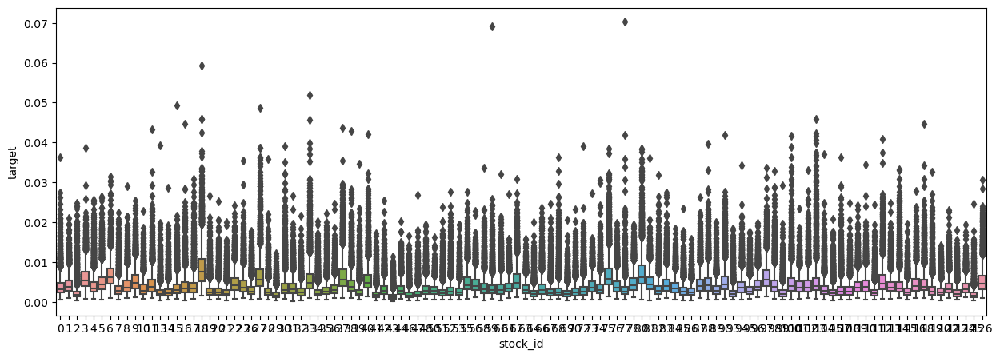

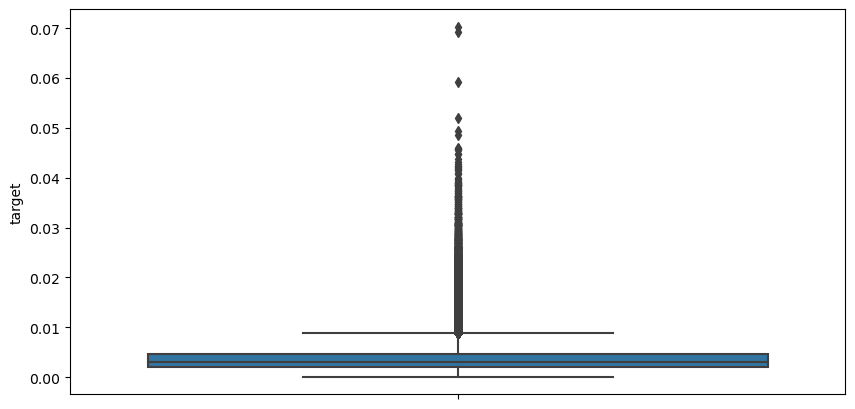

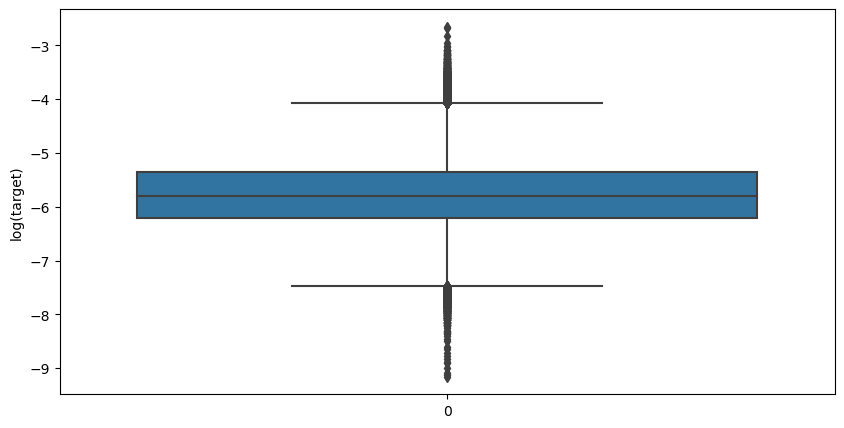

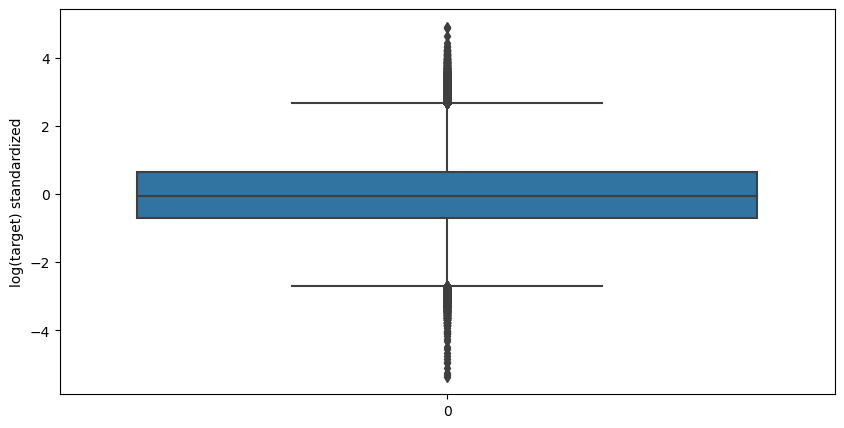

In [ ]:

plt.figure(figsize=(15, 5))
sns.boxplot( y="target",x='stock_id', data=train_feat_df)
plt.show()

temp_df1 = np.log(train_feat_df["target"])
temp_df2 = (temp_df1 - np.mean(temp_df1) )/ np.std(temp_df1)

plt.figure(figsize=(10, 5))
#sns.violinplot( y="target", data=train_feat_df)
sns.boxplot( y="target", data=train_feat_df)
plt.show()

## log transform target as it is right skewed to make it more normal
## target distribution is now more symmetric
plt.figure(figsize=(10, 5))
sns.boxplot(  data=temp_df1,)
plt.ylabel('log(target)')
plt.show()

## target distribution has mean 0 and std 1
plt.figure(figsize=(10, 5))
sns.boxplot(  data=temp_df2)
plt.ylabel('log(target) standardized')
plt.show()


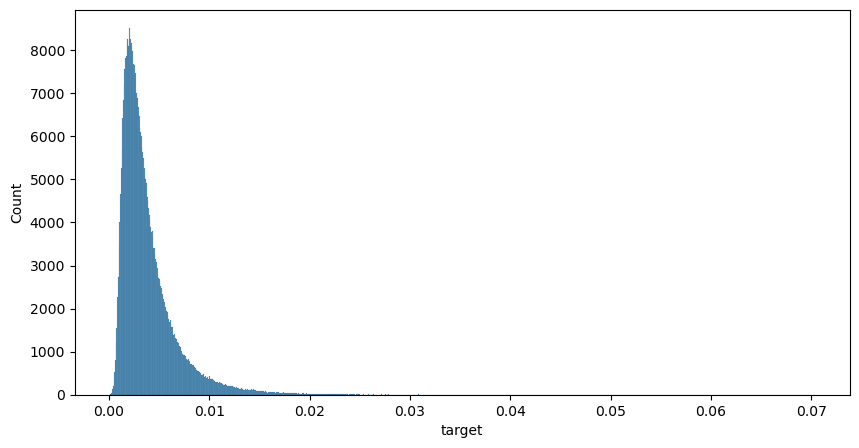

skew:  2.822600967625612
kurt:  14.961068724915897
count    428932.000000
mean          0.003880
std           0.002936
min           0.000105
25%           0.002026
50%           0.003048
75%           0.004738
max           0.070321
Name: target, dtype: float64


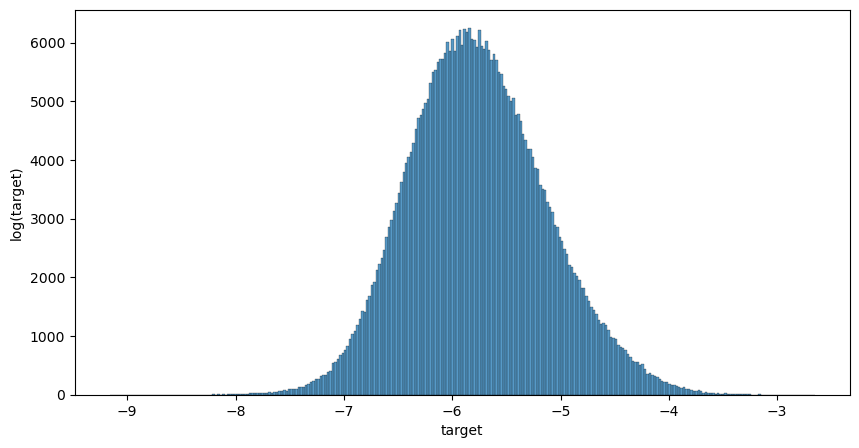

skew:  0.223038856756017
kurt:  0.0837121142059738
count    428932.000000
mean         -5.762331
std           0.633931
min          -9.159049
25%          -6.201538
50%          -5.793262
75%          -5.352215
max          -2.654690
Name: target, dtype: float64


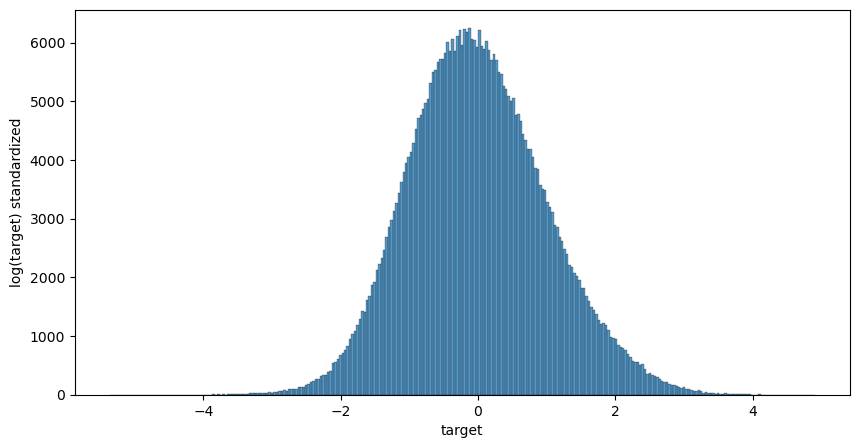

skew:  0.2230388567560219
kurt:  0.08371211420597557
count    4.289320e+05
mean    -1.609361e-15
std      1.000001e+00
min     -5.358188e+00
25%     -6.928312e-01
50%     -4.879280e-02
75%      6.469426e-01
max      4.902181e+00
Name: target, dtype: float64


In [ ]:
## target distribution
plt.figure(figsize=(10, 5))
sns.histplot( x="target", data=train_feat_df)
plt.show()
## skewness and kurtosis of target
print('skew: ',train_feat_df['target'].skew())
print('kurt: ',train_feat_df['target'].kurtosis())
print(train_feat_df['target'].describe())


## log transform target as it is right skewed to make it more normal
plt.figure(figsize=(10, 5))
sns.histplot( data=temp_df1)
plt.ylabel('log(target)')
plt.show()
## skewness and kurtosis reduced after log transform
print('skew: ',temp_df1.skew())
print('kurt: ',temp_df1.kurtosis())
print(temp_df1.describe())


## standardize log_target to have mean 0 and std 1
plt.figure(figsize=(10, 5))
sns.histplot( data=temp_df2)
plt.ylabel('log(target) standardized')
plt.show()
## skewness and kurtosis remain same after standardization
print('skew: ',temp_df2.skew())
print('kurt: ',temp_df2.kurtosis())
print(temp_df2.describe())

### FEATURE Exploration and initial ELimination

##### check the validity of the values in the features from 100 - 237

In [ ]:
# Check for NULL and INF values in train_feat_df

nan_cols = []
pos_inf_cols = []
neg_inf_cols = []

#float_cols = [ c for c in train_feat_df.columns if train_feat_df[c].dtype != 'category']

for c in float_cols:
    if np.isinf(train_feat_df[c]).any():
        print("pos INF: ",c,': ', np.isinf(train_feat_df[c]).sum())
        pos_inf_cols.append(c)

    if np.isneginf(train_feat_df[c]).any():
        print("neg INF: ",c,': ', np.isneginf(train_feat_df[c]).sum())
        neg_inf_cols.append(c)

    if np.isnan(train_feat_df[c]).any():
        print("NaN: ", c ,': ', np.isnan(train_feat_df[c]).sum())
        nan_cols.append(c)

In [ ]:
####### Drop any feature with large number of nan, positive and negative infinity

for c in train_feat_df.columns:
    if  np.isinf(train_feat_df[c]).sum() > 1000 or np.isneginf(train_feat_df[c]).sum() > 1000 or np.isnan(train_feat_df[c]).sum() > 1000:
        train_feat_df.drop(columns=[c], inplace=True)
        print(c)





TypeError: Object with dtype category cannot perform the numpy op isinf

In [ ]:
####### HANDLING NULL and INF VALUES ########

### drop columns with very high fraction of NaN values
# train_feat_df.drop(columns=["v1proj_29_15_std"], inplace=True)

# ### groupby stock id and fill NaN values with median of the stock id or leave it the same
# for c in nan_cols:
#     train_feat_df[c] = train_feat_df.groupby('stock_id')[c].transform(lambda x: x.fillna(np.nanmedian(x)))

### groupby stock id and fill positive infinity values with max of the stock id or 1e8
for c in pos_inf_cols:
    #train_feat_df[c] = train_feat_df.groupby('stock_id')[c].transform(lambda x: x.replace([np.inf], x.loc[~np.isinf(x)].max()))
    train_feat_df[c].replace(np.inf, 1e8, inplace=True)

### groupby stock id and fill negative infinity values with min of the stock id or -1e8
for c in neg_inf_cols:
    #train_feat_df[c] = train_feat_df.groupby('stock_id')[c].transform(lambda x: x.replace([-np.inf], x.loc[~np.isneginf(x)].min()))
    train_feat_df[c].replace(-np.inf, -1e8, inplace=True)






In [ ]:
#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

# with open('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced.pkl', 'wb') as fp:
#     pickle.dump(train_feat_df, fp)
#     print('saved train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced.pkl successfully')

with open('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced.pkl', 'rb') as fp:
    train_feat_df = pickle.load(fp)
    print('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced.pkl file')

train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced.pkl file


variable name:  wap1_log_price_ret_vol_from_25
variable type:  float64 

skew:  -1.8646634989196538
kurt:  13.691521852098088

fraction of null values:  0.0
num of null values:  0
,
num of inf values:  0
,
num of -inf values:  0
,
num of unique values:  428927
fraction of unique values:  0.9999883431406377


count    428932.000000
mean         -0.096552
std           0.278445
min          -7.120452
25%          -0.225808
50%          -0.066791
75%           0.073199
max           0.892285
Name: wap1_log_price_ret_vol_from_25, dtype: float64

At 0.99  quantile, variable value is <  0.43467069538920594


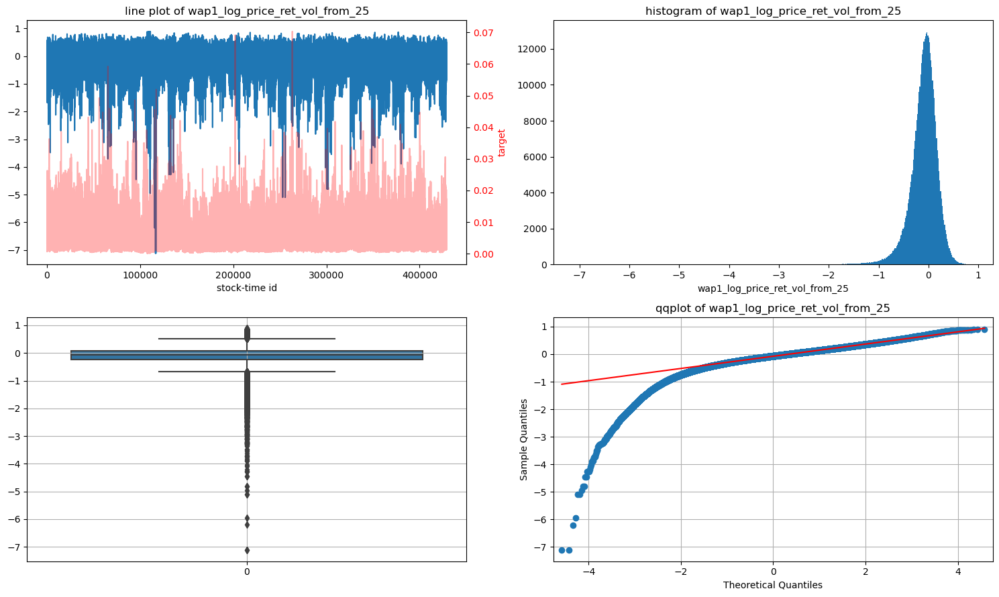

In [ ]:
######## Visualize the distribution of each feature in train_feat_df using column number ########


col = train_feat_df.columns[100]
target = train_feat_df['target']
val = train_feat_df[col]

#val = val[(val > -np.inf) & (val < np.inf)] # remove nan values


# val = np.exp(val* 10)# log transform
# val = (val - np.mean(val))/np.std(val) # standardize


## skewness and kurtosis of target
print('variable name: ',col)
print('variable type: ',val.dtype,'\n')
print('skew: ',val.skew())
print('kurt: ',val.kurtosis())
print('\nfraction of null values: ',val.isnull().sum()/val.shape[0])
print('num of null values: ',val.isnull().sum())
print(',\nnum of inf values: ',np.isinf(val).sum())
print(',\nnum of -inf values: ',np.isneginf(val).sum())
print(',\nnum of unique values: ',val.nunique())
print('fraction of unique values: ',val.nunique()/val.shape[0])
print('\n')
print(val.describe())

fig,ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 9),squeeze=False)

## line plot
ax[0,0].plot(val)
ax[0,0].set_title('line plot of '+col)
ax[0,0].set_xlabel('stock-time id')
twin_ax = ax[0,0].twinx()
twin_ax.plot(target,  'r', alpha=0.3)
twin_ax.tick_params(axis='y', labelcolor='red')
twin_ax.set_ylabel('target', color='red')
## histogram
ax[0,1].hist(val, bins=500)
ax[0,1].set_title('histogram of '+col)
ax[0,1].set_xlabel(col)
## violinplot
# ax[1,0] = sns.violinplot( data=val, ax=ax[1,0])
# ax[1,0].grid()
## boxplot distribution
ax[1,0] = sns.boxplot( data=val, ax=ax[1,0])
ax[1,0].grid()
ax[0,1].set_xlabel(col)

# ax[1,0].violinplot(train_feat_df[col], quantiles=[0.25, 0.5, 0.75,])
# ax[1,0].set_title('violin plot of '+col)
# ax[1,0].set_xlabel(col)

## qqplot
sm.qqplot(val, line='q', ax=ax[1,1])
ax[1,1].set_title('qqplot of '+col)
ax[1,1].grid()
fig.tight_layout()

## identify how many outliers are there in the data
qu = 0.99
print('\nAt', qu,' quantile, variable value is < ' , np.quantile(val, q=qu) )
#print('fraction of points below quantile: ', qu, ' is ', (val < np.quantile(val, q=qu) ).sum()/val.shape[0] )




In [ ]:
## VISUALIZE THE DISTRIBUTION OF multiple NUMERICAL FEATURES

rows = 10
cols = 3

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(25, 25),squeeze=False)

ind = 0
for i in range(rows):
    for j in range(cols):
        col = train_feat_df.columns[ind]
        val = train_feat_df.loc[(train_feat_df[col] > -np.inf) & ( train_feat_df[col] < np.inf), col]
        ax[i,j].hist(val,bins=500)
        ax[i,j].set_title(col+', '+str(ind))
        ind+=1
fig.tight_layout()

##### Apply feature transformation to make feature more normal #####

In [ ]:
import numpy as np


## Naming convention has t for transformation, e.g. tlog_1p for log transformation, texp for exp transformation

class FeatureTransformation():
    def __init__(self, data):
        self.data = data

    def log_3p(self, col_name):
        """log epsilon1 transformation"""
        self.data[col_name] = np.log(self.data[col_name]+ 3)
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'tlog_3p_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'tlog_3p_' + col_name , self.data[col_name].mean(), self.data[col_name].std()

    def log_3p_test(self, x, mean, std):
        """log epsilon1 transformation for test data"""
        x = np.log(x+ 3)
        x = (x - mean) / std
        return x

    def log_1p(self, col_name):
        """log epsilon1 transformation"""
        self.data[col_name] = np.log1p(self.data[col_name])
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'tlog_1p_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'tlog_1p_' + col_name , self.data[col_name].mean(), self.data[col_name].std()

    def log_1p_test(self, x, mean, std):
        """log epsilon1 transformation for test data"""
        x = np.log1p(x)
        x = (x - mean) / std
        return x

    def log_eps5e3(self, col_name):
        """log epsilon3 transformation"""
        self.data[col_name] = np.log(self.data[col_name]+ 0.005)
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'tlog_eps523_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'tlog_eps523_' + col_name , self.data[col_name].mean(), self.data[col_name].std()

    def log_eps5e3_test(self, x, mean, std):
        """log epsilon3 transformation for test data"""
        x = np.log(x+ 0.005)
        x = (x - mean) / std
        return x

    def log_eps1e4(self, col_name):
        """log epsilon4 transformation"""
        self.data[col_name] = np.log(self.data[col_name]+ 0.0001)
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'tlog_eps1e4_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'tlog_eps1e4_' + col_name , self.data[col_name].mean(), self.data[col_name].std()


    def log_eps1e4_test(self, x, mean, std):
        """log epsilon4 transformation for test data"""
        x = np.log(x+ 0.0001)
        x = (x - mean) / std
        return x


    def log(self, col_name):
        """log transformation"""
        val = np.log(self.data[col_name])
        val1 = (val - val.mean()) / val.std()
        #return val1, 'tlog_' + col_name , val.mean(), val.std()
        return val, 'tlog_' + col_name , val.mean(), val.std()

    def log_test(self, x, mean, std):
        """log transformation for test data"""
        x = np.log(x)
        x = (x - mean) / std
        return x

    def log_10p(self, col_name):
        """log epsilon2 transformation"""
        self.data[col_name] = np.log(self.data[col_name]+ 10)
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'tlog_10p_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'tlog_10p_' + col_name , self.data[col_name].mean(), self.data[col_name].std()

    def log_10p_test(self, x, mean, std):
        """log epsilon2 transformation for test data"""
        x = np.log(x+ 10)
        x = (x - mean) / std
        return x

    def log_log1p(self, col_name):
        """log log epsilon1 transformation"""
        self.data[col_name] = np.log(np.log1p(self.data[col_name]))
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'tlog_tlog1p_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'tlog_tlog1p_' + col_name , self.data[col_name].mean(), self.data[col_name].std()


    def log_log1p_test(self, x, mean, std):
        """log log epsilon1 transformation for test data"""
        x = np.log(np.log1p(x))
        x = (x - mean) / std
        return x

    def log_log1p_eps1e4(self, col_name):
        """log log epsilon4 transformation"""
        self.data[col_name] = np.log(np.log1p(self.data[col_name]+ 0.0001))
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'tlog_tlog1p_eps1e4_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name] , 'tlog_tlog1p_eps1e4_' + col_name , self.data[col_name].mean(), self.data[col_name].std()


    def log_log1p_eps1e4_test(self, x, mean, std):
        """log log epsilon4 transformation for test data"""
        x = np.log(np.log1p(x+ 0.0001))
        x = (x - mean) / std
        return x


    def log_lin100_1(self, col_name):
        """log of linear transformation"""
        self.data[col_name] = np.log(self.data[col_name]*100 + 1)
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'tlog_tlinear_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'tlog_tlinear_' + col_name , self.data[col_name].mean(), self.data[col_name].std()

    def log_lin100_1_test(self, x, mean, std):
        """log of linear transformation for test data"""
        x = np.log(x*100 + 1)
        x = (x - mean) / std
        return x

    def standard_scaling(self, col_name):
        """standard scaling transformation"""
        #self.data[col_name] = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return self.data[col_name], self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], self.data[col_name].mean(), self.data[col_name].std()

    def standard_scaling_test(self, x, mean, std):
        """standard scaling transformation for test data"""
        x = (x - mean) / std
        return x

    def exp(self, col_name):
        """exp transformation"""
        self.data[col_name] = np.exp(self.data[col_name])
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'texp_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'texp_' + col_name , self.data[col_name].mean(), self.data[col_name].std()


    def exp_test(self, x, mean, std):
        """exp transformation for test data"""
        x = np.exp(x)
        x = (x - mean) / std
        return x

    def exp_exp(self, col_name):
        """exp exp transformation"""
        self.data[col_name] = np.exp(np.exp(self.data[col_name]))
        val = (self.data[col_name] - self.data[col_name].mean()) / self.data[col_name].std()
        #return val, 'texp_texp_' + col_name , self.data[col_name].mean(), self.data[col_name].std()
        return self.data[col_name], 'texp_texp_' + col_name , self.data[col_name].mean(), self.data[col_name].std()


    def exp_exp_test(self, x, mean, std):
        """exp exp transformation for test data"""
        x = np.exp(np.exp(x))
        x = (x - mean) / std
        return x





In [ ]:
#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

# with open('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced_transformed.pkl', 'wb') as fp:
#     pickle.dump(train_feat_df, fp)
#     print('saved train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced_transformed.pkl successfully')

with open('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced.pkl', 'rb') as fp:
    train_feat_df = pickle.load(fp)
    print('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced.pkl file')

train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced.pkl file


In [ ]:
# import feature_transformation as feat_transformer

ft = FeatureTransformation(train_feat_df)

feat_normalization_mu_std_df = pd.DataFrame(index=["mean", "std", "transform"])

# val, new_col_name, mean, std = ft.log("wap1_log_price_ret_vol")
# train_feat_df.rename(columns={'wap1_log_price_ret_vol':new_col_name}, inplace=True)
# train_feat_df[new_col_name] = val
# feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df.drop(columns=['wap1_log_price_ret_vol'], inplace=True) ## we drop this because we have log_wap1_log_price_ret_vol already


train_feat_df["log_liq2_ret_*_wap_eqi_price1_ret_vol"], mean, std  = ft.standard_scaling("log_liq2_ret_*_wap_eqi_price1_ret_vol")
feat_normalization_mu_std_df["log_liq2_ret_*_wap_eqi_price1_ret_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["exp_log_liq1_ret_*_wap_eqi_price1_ret_vol"], mean, std  = ft.standard_scaling("exp_log_liq1_ret_*_wap_eqi_price1_ret_vol")
feat_normalization_mu_std_df["exp_log_liq1_ret_*_wap_eqi_price1_ret_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_liq2_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_liq2_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_per_liq2_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_spread_sqr_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_spread_sqr_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_per_spread_sqr_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df['log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio'], mean, std = ft.standard_scaling('log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio')
feat_normalization_mu_std_df['log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio'] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_liq2_vol_15_ratio"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_liq2_vol_15_ratio")
feat_normalization_mu_std_df["wap1_log_price_ret_per_liq2_vol_15_ratio"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_spread_sqr_vol_15_ratio"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_spread_sqr_vol_15_ratio")
feat_normalization_mu_std_df["wap1_log_price_ret_per_spread_sqr_vol_15_ratio"] = [mean, std, "standard_scaling_test"]

train_feat_df["exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio"], mean, std = ft.standard_scaling("exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio")
feat_normalization_mu_std_df["exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio"] = [mean, std, "standard_scaling_test"]

# train_feat_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio"], mean, std = ft.standard_scaling("wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio")
# feat_normalization_mu_std_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio"] = [mean, std, "standard_scaling_test"]

# train_feat_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock"], mean, std = ft.standard_scaling("wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock")
# feat_normalization_mu_std_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock"] = [mean, std, "standard_scaling_test"]

train_feat_df["log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock"], mean, std = ft.standard_scaling("log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock")
feat_normalization_mu_std_df["log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock")
feat_normalization_mu_std_df["wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol"],mean, std, = ft.standard_scaling("wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol")
feat_normalization_mu_std_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_neg_log_liq_ret_sqr_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_neg_log_liq_ret_sqr_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_neg_log_liq_ret_sqr_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_pos_log_liq_ret_sqr_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_pos_log_liq_ret_sqr_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_pos_log_liq_ret_sqr_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_pos-neg_log_liq_ret_sqr_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_pos-neg_log_liq_ret_sqr_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_pos-neg_log_liq_ret_sqr_vol"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log_3p("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:0")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:0':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_3p_test"]


val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:0")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:0':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:0"],mean, std = ft.standard_scaling("wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:0")
feat_normalization_mu_std_df["wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:0"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:10")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:10':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:10")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:10':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:10"],mean, std, = ft.standard_scaling("wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:10")
feat_normalization_mu_std_df["wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:10"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:20")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:20':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


val, new_col_name, mean, std = ft.log("wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:20")
train_feat_df.rename(columns={'wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:20':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["soft_stock_mean_tvpl2_:0"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_:0")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_:0"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_:10"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_:10")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_:10"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_:20"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_:20")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_:20"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_liqf"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_liqf")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_liqf"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_liqf_volf10"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_liqf_volf10")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_liqf_volf10"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_liqf_volf20"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_liqf_volf20")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_liqf_volf20"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_15"], mean, std = ft.standard_scaling("v1proj_25_15")
feat_normalization_mu_std_df["v1proj_25_15"] = [mean, std, "standard_scaling_test"]

# val, new_col_name, mean, std = ft.log("lsvol")  ## This is causing lsvol to have nan values
# train_feat_df.rename(columns={'lsvol':new_col_name}, inplace=True)
# train_feat_df[new_col_name] = val
# feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["lsvol"], mean, std = ft.standard_scaling("lsvol")
feat_normalization_mu_std_df["lsvol"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqvol1"], mean, std = ft.standard_scaling("liqvol1")
feat_normalization_mu_std_df["liqvol1"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqvol1_smean"], mean, std = ft.standard_scaling("liqvol1_smean")
feat_normalization_mu_std_df["liqvol1_smean"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqvol2"], mean, std = ft.standard_scaling("liqvol2")
feat_normalization_mu_std_df["liqvol2"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqvol1_15_15"], mean, std = ft.standard_scaling("liqvol1_15_15")
feat_normalization_mu_std_df["liqvol1_15_15"] = [mean, std, "standard_scaling_test"]

train_feat_df["trade_count"], mean, std = ft.standard_scaling("trade_count")
feat_normalization_mu_std_df["trade_count"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_trade_count"], mean, std = ft.standard_scaling("root_trade_count")
feat_normalization_mu_std_df["root_trade_count"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_trade_count_smean"], mean, std = ft.standard_scaling("root_trade_count_smean")
feat_normalization_mu_std_df["root_trade_count_smean"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_book_delta_count"], mean, std = ft.standard_scaling("root_book_delta_count")
feat_normalization_mu_std_df["root_book_delta_count"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_trade_count_var"], mean, std = ft.standard_scaling("root_trade_count_var")
feat_normalization_mu_std_df["root_trade_count_var"] = [mean, std, "standard_scaling_test"]

train_feat_df["trade_count_15_15"], mean, std = ft.standard_scaling("trade_count_15_15")
feat_normalization_mu_std_df["trade_count_15_15"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_trade_count_15_15"], mean, std = ft.standard_scaling("root_trade_count_15_15")
feat_normalization_mu_std_df["root_trade_count_15_15"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_15"], mean, std = ft.standard_scaling("v1proj_29_15")
feat_normalization_mu_std_df["v1proj_29_15"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_20"], mean, std = ft.standard_scaling("v1proj_20")
feat_normalization_mu_std_df["v1proj_20"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25"], mean, std = ft.standard_scaling("v1proj_25")
feat_normalization_mu_std_df["v1proj_25"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29"], mean, std = ft.standard_scaling("v1proj_29")
feat_normalization_mu_std_df["v1proj_29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_q1"], mean, std = ft.standard_scaling("v1proj_29_q1")
feat_normalization_mu_std_df["v1proj_29_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_q3"], mean, std = ft.standard_scaling("v1proj_29_q3")
feat_normalization_mu_std_df["v1proj_29_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_q1"], mean, std = ft.standard_scaling("v1proj_25_q1")
feat_normalization_mu_std_df["v1proj_25_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_q3"], mean, std = ft.standard_scaling("v1proj_25_q3")
feat_normalization_mu_std_df["v1proj_25_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_15_q1"], mean, std = ft.standard_scaling("v1proj_29_15_q1")
feat_normalization_mu_std_df["v1proj_29_15_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_15_q3"], mean, std = ft.standard_scaling("v1proj_29_15_q3")
feat_normalization_mu_std_df["v1proj_29_15_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_15_q1"], mean, std = ft.standard_scaling("v1proj_25_15_q1")
feat_normalization_mu_std_df["v1proj_25_15_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_15_q3"], mean, std = ft.standard_scaling("v1proj_25_15_q3")
feat_normalization_mu_std_df["v1proj_25_15_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_15_std"], mean, std = ft.standard_scaling("v1proj_25_15_std")
feat_normalization_mu_std_df["v1proj_25_15_std"] = [mean, std, "standard_scaling_test"]

# train_feat_df.drop(columns=["v1proj_29_15_std"], inplace=True) ## drop this column as it has very low variance

train_feat_df["v1proj_20_std"], mean, std = ft.standard_scaling("v1proj_20_std")
feat_normalization_mu_std_df["v1proj_20_std"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_std"], mean, std = ft.standard_scaling("v1proj_25_std")
feat_normalization_mu_std_df["v1proj_25_std"] = [mean, std, "standard_scaling_test"]

# train_feat_df["v1proj_29_std"], mean, std = ft.standard_scaling("v1proj_29_std")
# feat_normalization_mu_std_df["v1proj_29_std"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_q3q1"], mean, std = ft.standard_scaling("v1proj_29_q3q1")
feat_normalization_mu_std_df["v1proj_29_q3q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_rmed2v1"], mean, std = ft.standard_scaling("tvpl2_rmed2v1")
feat_normalization_mu_std_df["tvpl2_rmed2v1"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_rmed2v1lf25"], mean, std = ft.standard_scaling("tvpl2_rmed2v1lf25")
feat_normalization_mu_std_df["tvpl2_rmed2v1lf25"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_rmed2v1lf29"], mean, std = ft.standard_scaling("tvpl2_rmed2v1lf29")
feat_normalization_mu_std_df["tvpl2_rmed2v1lf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2"], mean, std = ft.standard_scaling("tvpl2")
feat_normalization_mu_std_df["tvpl2"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_liqf10"], mean, std = ft.standard_scaling("tvpl2_liqf10")
feat_normalization_mu_std_df["tvpl2_liqf10"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_liqf20"], mean, std = ft.standard_scaling("tvpl2_liqf20")
feat_normalization_mu_std_df["tvpl2_liqf20"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_liqf29"], mean, std = ft.standard_scaling("tvpl2_liqf29")
feat_normalization_mu_std_df["tvpl2_liqf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_smean_vol"], mean, std = ft.standard_scaling("tvpl2_smean_vol")
feat_normalization_mu_std_df["tvpl2_smean_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_smean_vol_liqf10"], mean, std = ft.standard_scaling("tvpl2_smean_vol_liqf10")
feat_normalization_mu_std_df["tvpl2_smean_vol_liqf10"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_smean_vol_liqf20"], mean, std = ft.standard_scaling("tvpl2_smean_vol_liqf20")
feat_normalization_mu_std_df["tvpl2_smean_vol_liqf20"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_smean_vol_liqf29"], mean, std = ft.standard_scaling("tvpl2_smean_vol_liqf29")
feat_normalization_mu_std_df["tvpl2_smean_vol_liqf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2projt5"], mean, std = ft.standard_scaling("v1liq2projt5")
feat_normalization_mu_std_df["v1liq2projt5"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2projt10"], mean, std = ft.standard_scaling("v1liq2projt10")
feat_normalization_mu_std_df["v1liq2projt10"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2projt20"], mean, std = ft.standard_scaling("v1liq2projt20")
feat_normalization_mu_std_df["v1liq2projt20"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqt10rf29"], mean, std = ft.standard_scaling("liqt10rf29")
feat_normalization_mu_std_df["liqt10rf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqt20rf29"], mean, std = ft.standard_scaling("liqt20rf29")
feat_normalization_mu_std_df["liqt20rf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2sprojt10f25"], mean, std = ft.standard_scaling("v1liq2sprojt10f25")
feat_normalization_mu_std_df["v1liq2sprojt10f25"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2sprojt5f25"], mean, std = ft.standard_scaling("v1liq2sprojt5f25")
feat_normalization_mu_std_df["v1liq2sprojt5f25"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt10f29"], mean, std = ft.standard_scaling("v1spprojt10f29")
feat_normalization_mu_std_df["v1spprojt10f29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f25"], mean, std = ft.standard_scaling("v1spprojt15f25")
feat_normalization_mu_std_df["v1spprojt15f25"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f29"], mean, std = ft.standard_scaling("v1spprojt15f29")
feat_normalization_mu_std_df["v1spprojt15f29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f29_q1"], mean, std = ft.standard_scaling("v1spprojt15f29_q1")
feat_normalization_mu_std_df["v1spprojt15f29_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f29_q3"], mean, std = ft.standard_scaling("v1spprojt15f29_q3")
feat_normalization_mu_std_df["v1spprojt15f29_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f25_q1"], mean, std = ft.standard_scaling("v1spprojt15f25_q1")
feat_normalization_mu_std_df["v1spprojt15f25_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f25_q3"], mean, std = ft.standard_scaling("v1spprojt15f25_q3")
feat_normalization_mu_std_df["v1spprojt15f25_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojtf29_q1"], mean, std = ft.standard_scaling("v1spprojtf29_q1")
feat_normalization_mu_std_df["v1spprojtf29_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojtf29_q3"], mean, std = ft.standard_scaling("v1spprojtf29_q3")
feat_normalization_mu_std_df["v1spprojtf29_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojtf25_q1"], mean, std = ft.standard_scaling("v1spprojtf25_q1")
feat_normalization_mu_std_df["v1spprojtf25_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojtf25_q3"], mean, std = ft.standard_scaling("v1spprojtf25_q3")
feat_normalization_mu_std_df["v1spprojtf25_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["wap1_log_price_ret_vol_from_0"], inplace=True) ## drop this column as it has all 0 values

train_feat_df["wap1_log_price_ret_volstock_mean_from_0"],mean, std, = ft.standard_scaling("wap1_log_price_ret_volstock_mean_from_0")
feat_normalization_mu_std_df["wap1_log_price_ret_volstock_mean_from_0"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.exp("wap1_log_price_ret_vol_from_10")
train_feat_df.rename(columns={'wap1_log_price_ret_vol_from_10':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "exp_test"]

train_feat_df["wap1_log_price_ret_volstock_mean_from_10"],mean, std, = ft.standard_scaling("wap1_log_price_ret_volstock_mean_from_10")
feat_normalization_mu_std_df["wap1_log_price_ret_volstock_mean_from_10"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.exp("wap1_log_price_ret_vol_from_20")
train_feat_df.rename(columns={'wap1_log_price_ret_vol_from_20':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "exp_test"]


train_feat_df["wap1_log_price_ret_volstock_mean_from_20"], mean, std = ft.standard_scaling("wap1_log_price_ret_volstock_mean_from_20")
feat_normalization_mu_std_df["wap1_log_price_ret_volstock_mean_from_20"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_vol_from_25"], mean, std = ft.standard_scaling("wap1_log_price_ret_vol_from_25")
feat_normalization_mu_std_df["wap1_log_price_ret_vol_from_25"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_volstock_mean_from_25"], mean, std = ft.standard_scaling("wap1_log_price_ret_volstock_mean_from_25")
feat_normalization_mu_std_df["wap1_log_price_ret_volstock_mean_from_25"] = [mean, std, "standard_scaling_test"]

train_feat_df["vol1_mean"], mean, std = ft.standard_scaling("vol1_mean")
feat_normalization_mu_std_df["vol1_mean"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["mean_half_delta"], inplace=True)# drop this column as it has very few unique values

train_feat_df.drop(columns=["mean_half_delta_lsprd"], inplace=True)# drop this column as it has very few unique values

train_feat_df["log_wap1_log_price_ret_vol"], mean, std = ft.standard_scaling("log_wap1_log_price_ret_vol")
feat_normalization_mu_std_df["log_wap1_log_price_ret_vol"] = [mean, std, "standard_scaling_test"]


train_feat_df.drop(columns=["log_target"], inplace=True)# drop log_target as we create it here as tlog_target which is sames as log_target_standardize
train_feat_df.drop(columns=["log_target_standardized"], inplace=True)#
temp_target = train_feat_df["target"]
val , new_col_name, mean, std = ft.log("target")
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]
train_feat_df["target"] = temp_target
del temp_target

train_feat_df["bid_lvl2_min_lvl1_size_feat"], mean, std = ft.standard_scaling("bid_lvl2_min_lvl1_size_feat")
feat_normalization_mu_std_df["bid_lvl2_min_lvl1_size_feat"] = [mean, std, "standard_scaling_test"]

train_feat_df["ask_lvl2_min_lvl1_size_feat"], mean, std = ft.standard_scaling("ask_lvl2_min_lvl1_size_feat")
feat_normalization_mu_std_df["ask_lvl2_min_lvl1_size_feat"] = [mean, std, "standard_scaling_test"]

train_feat_df["lvl2_minus_lvl1_bid_n_ask_size_feat"], mean, std = ft.standard_scaling("lvl2_minus_lvl1_bid_n_ask_size_feat")
feat_normalization_mu_std_df["lvl2_minus_lvl1_bid_n_ask_size_feat"] = [mean, std, "standard_scaling_test"]

train_feat_df["sum_size"], mean, std = ft.standard_scaling("sum_size")
feat_normalization_mu_std_df["sum_size"] = [mean, std, "standard_scaling_test"]

train_feat_df["sum_order_count"], mean, std = ft.standard_scaling("sum_order_count")
feat_normalization_mu_std_df["sum_order_count"] = [mean, std, "standard_scaling_test"]

train_feat_df["sum_size_per_order_count"], mean, std = ft.standard_scaling("sum_size_per_order_count")
feat_normalization_mu_std_df["sum_size_per_order_count"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log_eps5e3("trade_price_n_wap1_dev")
train_feat_df.rename(columns={'trade_price_n_wap1_dev':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_eps5e3_test"]

val, new_col_name, mean, std = ft.log_eps5e3("trade_price_n_wap_eqi_price0_dev")
train_feat_df.rename(columns={'trade_price_n_wap_eqi_price0_dev':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_eps5e3_test"]

val, new_col_name, mean, std = ft.log("first_10_min_vol")
train_feat_df.rename(columns={'first_10_min_vol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


val, new_col_name, mean, std = ft.log_eps1e4("trade_price_std")
train_feat_df.rename(columns={'trade_price_std':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_eps1e4_test"]

val, new_col_name, mean, std = ft.log_eps1e4("trade_price_real_vol")
train_feat_df.rename(columns={'trade_price_real_vol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_eps1e4_test"]

val, new_col_name, mean, std = ft.log_1p("trade_size_std")
train_feat_df.rename(columns={'trade_size_std':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.log_1p("trade_size_mean")
train_feat_df.rename(columns={'trade_size_mean':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.log_1p("trade_order_count_std")
train_feat_df.rename(columns={'trade_order_count_std':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.log_1p("trade_order_count_mean")
train_feat_df.rename(columns={'trade_order_count_mean':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]


val, new_col_name, mean, std = ft.log_log1p("target_vol_sum_stats_4_clusters")
train_feat_df.rename(columns={'target_vol_sum_stats_4_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_sum_stats_10_clusters")
train_feat_df.rename(columns={'target_vol_sum_stats_10_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_sum_stats_16_clusters")
train_feat_df.rename(columns={'target_vol_sum_stats_16_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]


val, new_col_name, mean, std = ft.log_log1p("target_vol_sum_stats_30_clusters")
train_feat_df.rename(columns={'target_vol_sum_stats_30_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]


val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_2_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_2_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_4_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_4_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_14_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_14_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_20_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_20_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_32_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_32_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_60_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_60_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log("target_vol_pcorr_3_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_3_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("target_vol_pcorr_49_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_49_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("target_vol_pcorr_90_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_90_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("target_vol_pcorr_10_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_10_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


val, new_col_name, mean, std = ft.log("target_vol_pcorr_26_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_26_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["min_bid_price1"], mean, std = ft.standard_scaling("min_bid_price1")
feat_normalization_mu_std_df["min_bid_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_bid_price1"], mean, std = ft.standard_scaling("max_bid_price1")
feat_normalization_mu_std_df["max_bid_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df["min_ask_price1"], mean, std = ft.standard_scaling("min_ask_price1")
feat_normalization_mu_std_df["min_ask_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_ask_price1"], mean, std = ft.standard_scaling("max_ask_price1")
feat_normalization_mu_std_df["max_ask_price1"] = [mean, std, "standard_scaling_test"]


train_feat_df.drop(columns=["min_bid_size1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_bid_size1")
train_feat_df.rename(columns={'max_bid_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df.drop(columns=["min_ask_size1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_ask_size1")
train_feat_df.rename(columns={'max_ask_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


val, new_col_name, mean, std = ft.log_log1p_eps1e4("range_ask_price1")
train_feat_df.rename(columns={'range_ask_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_eps1e4_test"]

val, new_col_name, mean, std = ft.log_log1p_eps1e4("range_bid_price1")
train_feat_df.rename(columns={'range_bid_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_eps1e4_test"]

val, new_col_name, mean, std = ft.log_1p("range_ask_size1")
train_feat_df.rename(columns={'range_ask_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]



val, new_col_name, mean, std = ft.log_1p("range_bid_size1")
train_feat_df.rename(columns={'range_bid_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]


val, new_col_name, mean, std = ft.log_log1p_eps1e4("sad_ask_price1")
train_feat_df.rename(columns={'sad_ask_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_eps1e4_test"]

val, new_col_name, mean, std = ft.log_1p("sad_ask_size1")
train_feat_df.rename(columns={'sad_ask_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_bid_price1")
train_feat_df.rename(columns={'sad_bid_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_bid_size1")
train_feat_df.rename(columns={'sad_bid_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

train_feat_df["bs_bp_corr1"], mean, std = ft.standard_scaling("bs_bp_corr1")
feat_normalization_mu_std_df["bs_bp_corr1"] = [mean, std, "standard_scaling_test"]

train_feat_df["bs_as_corr1"], mean, std = ft.standard_scaling("bs_as_corr1")
feat_normalization_mu_std_df["bs_as_corr1"] = [mean, std, "standard_scaling_test"]

train_feat_df["bs_ap_corr1"], mean, std = ft.standard_scaling("bs_ap_corr1")
feat_normalization_mu_std_df["bs_ap_corr1"] = [mean, std, "standard_scaling_test"]

train_feat_df["bp_as_corr1"], mean, std = ft.standard_scaling("bp_as_corr1")
feat_normalization_mu_std_df["bp_as_corr1"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.exp_exp("bp_ap_corr1")
train_feat_df.rename(columns={'bp_ap_corr1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "exp_exp_test"]

train_feat_df["as_ap_corr1"], mean, std = ft.standard_scaling("as_ap_corr1")
feat_normalization_mu_std_df["as_ap_corr1"] = [mean, std, "standard_scaling_test"]

train_feat_df["min_price1"], mean, std = ft.standard_scaling("min_price1")
feat_normalization_mu_std_df["min_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_price1"], mean, std = ft.standard_scaling("max_price1")
feat_normalization_mu_std_df["max_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["min_size1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_size1")
train_feat_df.rename(columns={'max_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


train_feat_df.drop(columns=["min_order_count1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

train_feat_df["max_order_count1"], mean, std = ft.standard_scaling("max_order_count1")
feat_normalization_mu_std_df["max_order_count1"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log_lin100_1("range_price1")
train_feat_df.rename(columns={'range_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]


val, new_col_name, mean, std = ft.log_1p("range_size1")
train_feat_df.rename(columns={'range_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]


train_feat_df.drop(columns=["range_order_count1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log_lin100_1("sad_price1")
train_feat_df.rename(columns={'sad_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_size1")
train_feat_df.rename(columns={'sad_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]


val, new_col_name, mean, std = ft.log_1p("sad_order_count1")
train_feat_df.rename(columns={'sad_order_count1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.exp("size_order_count_corr1")
train_feat_df.rename(columns={'size_order_count_corr1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "exp_test"]

val, new_col_name, mean, std = ft.log("book_ewma_vol")
train_feat_df.rename(columns={'book_ewma_vol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log_1p("trade_ewma_vol")
train_feat_df.rename(columns={'trade_ewma_vol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

train_feat_df["min_bid_price2"], mean, std = ft.standard_scaling("min_bid_price2")
feat_normalization_mu_std_df["min_bid_price2"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_bid_price2"], mean, std = ft.standard_scaling("max_bid_price2")
feat_normalization_mu_std_df["max_bid_price2"] = [mean, std, "standard_scaling_test"]

train_feat_df["min_ask_price2"], mean, std = ft.standard_scaling("min_ask_price2")
feat_normalization_mu_std_df["min_ask_price2"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_ask_price2"], mean, std = ft.standard_scaling("max_ask_price2")
feat_normalization_mu_std_df["max_ask_price2"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["min_bid_size2"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_bid_size2")
train_feat_df.rename(columns={'max_bid_size2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df.drop(columns=["min_ask_size2"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_ask_size2")
train_feat_df.rename(columns={'max_ask_size2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log_lin100_1("range_ask_price2")
train_feat_df.rename(columns={'range_ask_price2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("range_bid_price2")
train_feat_df.rename(columns={'range_bid_price2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log("range_ask_size2")
train_feat_df.rename(columns={'range_ask_size2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_ask_price2")
train_feat_df.rename(columns={'sad_ask_price2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_ask_size2")
train_feat_df.rename(columns={'sad_ask_size2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_bid_price2")
train_feat_df.rename(columns={'sad_bid_price2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

train_feat_df["bs_bp_corr2"], mean, std = ft.standard_scaling("bs_bp_corr2")
feat_normalization_mu_std_df["bs_bp_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["bs_as_corr2"], mean, std = ft.standard_scaling("bs_as_corr2")
feat_normalization_mu_std_df["bs_as_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["bs_ap_corr2"], mean, std = ft.standard_scaling("bs_ap_corr2")
feat_normalization_mu_std_df["bs_ap_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["bp_as_corr2"], mean, std = ft.standard_scaling("bp_as_corr2")
feat_normalization_mu_std_df["bp_as_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["bp_ap_corr2"], mean, std = ft.standard_scaling("bp_ap_corr2")
feat_normalization_mu_std_df["bp_ap_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["as_ap_corr2"], mean, std = ft.standard_scaling("as_ap_corr2")
feat_normalization_mu_std_df["as_ap_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["sum_stats_4_clusters_labels"] = train_feat_df["sum_stats_4_clusters_labels"].astype("category")

train_feat_df["sum_stats_10_clusters_labels"] = train_feat_df["sum_stats_10_clusters_labels"].astype("category")

train_feat_df["sum_stats_16_clusters_labels"] = train_feat_df["sum_stats_16_clusters_labels"].astype("category")

train_feat_df["sum_stats_30_clusters_labels"] = train_feat_df["sum_stats_30_clusters_labels"].astype("category")

train_feat_df["pear_corr_3_clusters_labels"] = train_feat_df["pear_corr_3_clusters_labels"].astype("category")

train_feat_df["pear_corr_49_clusters_labels"] = train_feat_df["pear_corr_49_clusters_labels"].astype("category")

train_feat_df["pear_corr_90_clusters_labels"] = train_feat_df["pear_corr_90_clusters_labels"].astype("category")

train_feat_df["pear_corr_10_clusters_labels"] = train_feat_df["pear_corr_10_clusters_labels"].astype("category")

train_feat_df["pear_corr_26_clusters_labels"] = train_feat_df["pear_corr_26_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_2_clusters_labels"] = train_feat_df["robust_sum_stats_2_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_4_clusters_labels"] = train_feat_df["robust_sum_stats_4_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_14_clusters_labels"] = train_feat_df["robust_sum_stats_14_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_20_clusters_labels"] = train_feat_df["robust_sum_stats_20_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_32_clusters_labels"] = train_feat_df["robust_sum_stats_32_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_60_clusters_labels"] = train_feat_df["robust_sum_stats_60_clusters_labels"].astype("category")





In [ ]:
#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('feat_normalization_mu_std_df.pkl', 'wb') as fp:
    pickle.dump(feat_normalization_mu_std_df, fp)

In [ ]:
# Check for NULL and INF values in train_feat_df

nan_cols = []
pos_inf_cols = []
neg_inf_cols = []


for c in train_feat_df.columns[:-16]: ## exclude the caetgorical columns
    if np.isinf(train_feat_df[c]).any():
        print("pos INF: ",c,': ', np.isinf(train_feat_df[c]).sum())
        pos_inf_cols.append(c)

    if np.isneginf(train_feat_df[c]).any():
        print("neg INF: ",c,': ', np.isneginf(train_feat_df[c]).sum())
        neg_inf_cols.append(c)

    if np.isnan(train_feat_df[c]).any():
        print("NaN: ", c ,': ', np.isnan(train_feat_df[c]).sum())
        nan_cols.append(c)

NaN:  trade_count_15_15 :  19
NaN:  root_trade_count_15_15 :  19
NaN:  v1proj_25_15_std :  560
NaN:  v1proj_25_std :  560


In [ ]:
#### Check that no two columns have the same values
for c in train_feat_df.columns:
    ctr=0
    for c1 in train_feat_df.columns:
        if np.array_equal(train_feat_df[c], train_feat_df[c1]) and c!=c1:
            ctr+=1
            print(c, c1)
        # if (ctr>1):
        #     print(c, c1)

# ### Drop the columns that have the same values
# train_feat_df.drop(columns=['exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2',"exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_2_15_ratio", "min_price", "max_price" ], inplace=True)
# train_feat_df

##### Reordering train_feat_df time_id's to the correct order for each stock to create the stock's time series


In [ ]:

# # load correct time_id order
# #os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
# os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/optimus_GPU_data/data/liquidity_features')

# with open('correct_time_id_order.pkl', 'rb') as f:
#     correct_time_id_order = pickle.load(f)

# time_ids_reordered = correct_time_id_order['time_id'].values




# # reorder time_ids to correct order

# df = train_feat_df.copy()
# #df["seq_id"] = -1 ## we exclude seq id because it cannot be generated for the submission data

# def my_reorder_stock_in_df(st_df, time_ids_reordered):
#     common_values = [value for value in time_ids_reordered if value in st_df['time_id'].values]
#     st_df = st_df.set_index('time_id')
#     st_df = st_df.reindex(common_values)
#     st_df = st_df.reset_index()
#     #st_df["seq_id"] = range(st_df.shape[0]) ## we exclude seq id because it cannot be generated for the submission data
#     return st_df

# # Assuming you have a dataframe called 'df' and an array of reordered time_ids called 'time_ids_reordered'
# df_reordered = df.groupby('stock_id').apply(my_reorder_stock_in_df, time_ids_reordered=time_ids_reordered).reset_index(drop=True)


# os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
# with open('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced_transformed_reordered.pkl', 'wb') as fp:
#     pickle.dump(df_reordered,fp)
#     print('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced_transformed_reordered.pkl file')

# df_reordered

### FEATURE SELECTION

In [ ]:
# os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')

# with open('transformed_train_feat_df_submission.pkl', 'rb') as fp:
#     train_feat_df = pickle.load(fp)
#     print('transformed_train_feat_df_submission.pkl file')



os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')
with open('train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced_transformed_reordered.pkl', 'rb') as fp:
    train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced_transformed_reordered = pickle.load(fp)


train_feat_df = train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced_transformed_reordered.copy()
del train_feat_df_all_feat_large_null_neg_posinf_dropped_null_inf_replaced_transformed_reordered

In [ ]:
########## Compute the number/fraction of unique values in each feature and rank them.
#### This is helpful for feature selection and elimination of features with very few unique values

uniq_df = pd.DataFrame(columns=['feature_name', 'num_unique_values', 'fraction_unique_values'])

for c in train_feat_df.columns:
    #print(c, train_feat_df[c].nunique(), train_feat_df[c].nunique()/train_feat_df.shape[0])
    uniq_df = pd.concat([uniq_df, pd.DataFrame({'feature_name':[c], 'num_unique_values':[train_feat_df[c].nunique()], 'fraction_unique_values':[train_feat_df[c].nunique()/train_feat_df.shape[0]]})])

## plot the number of unique values in each feature

uniq_df['num_unique_values'] = pd.to_numeric(uniq_df['num_unique_values'], errors='coerce') # convert to numeric
uniq_df['feature_name'] = uniq_df['feature_name'].astype(str)
uniq_df['fraction_unique_values'] = pd.to_numeric(uniq_df['fraction_unique_values'], errors='coerce')



uniq_df = uniq_df.sort_values(by='num_unique_values')

first_15 = uniq_df.iloc[:15,:]
next_15 = uniq_df.iloc[15:30,:]
next_20 = uniq_df.iloc[30:61,:]
second_50 = uniq_df.iloc[61:100,:]
third_50 = uniq_df.iloc[100:150,:]
fourth_50 = uniq_df.iloc[150:,:]

fig = px.bar(first_15, x='feature_name', y='num_unique_values', title='number of unique values in each feature')
fig.show()

fig = px.bar(next_15, x='feature_name', y='num_unique_values', title='number of unique values in each feature')
fig.show()

fig = px.bar(next_20, x='feature_name', y='num_unique_values', title='number of unique values in each feature')
fig.show()

fig = px.bar(second_50, x='feature_name', y='num_unique_values', title='number of unique values in each feature')
fig.show()

fig = px.bar(third_50, x='feature_name', y='num_unique_values', title='number of unique values in each feature')
fig.show()

fig = px.bar(fourth_50, x='feature_name', y='num_unique_values', title='number of unique values in each feature')
fig.show()



<ipython-input-7-dc517f3dd8ae>:8: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  uniq_df = pd.concat([uniq_df, pd.DataFrame({'feature_name':[c], 'num_unique_values':[train_feat_df[c].nunique()], 'fraction_unique_values':[train_feat_df[c].nunique()/train_feat_df.shape[0]]})])


In [ ]:
## Variance theresholding to remove low variance features
## remove the bottom 1% of features with lowest variance

## Ensure all features on same scale using min-max scaling (0-1) before we can compare them

# train_feat_df_mm_stnd = (train_feat_df - np.nanmin(train_feat_df, axis=0))/(np.nanmax(train_feat_df, axis=0) - np.nanmin(train_feat_df, axis=0))

# feat_var = np.nanvar(train_feat_df[train_feat_df.columns[2:]], axis=0)

# print('\nAfter standard scaling:\n',pd.DataFrame(feat_var).describe())

# fig = go.Figure()
# fig.add_trace(go.Histogram(x=feat_var, nbinsx=1000))
# fig.update_layout(title_text='Histogram of feature variance')
# fig.show()

# p=0.10
# th = np.nanpercentile(feat_var, q=p)

# print('percentile: ',p, '%, threshold: ', th )
# print(train_feat_df.columns[np.argwhere(feat_var < th).flatten()])





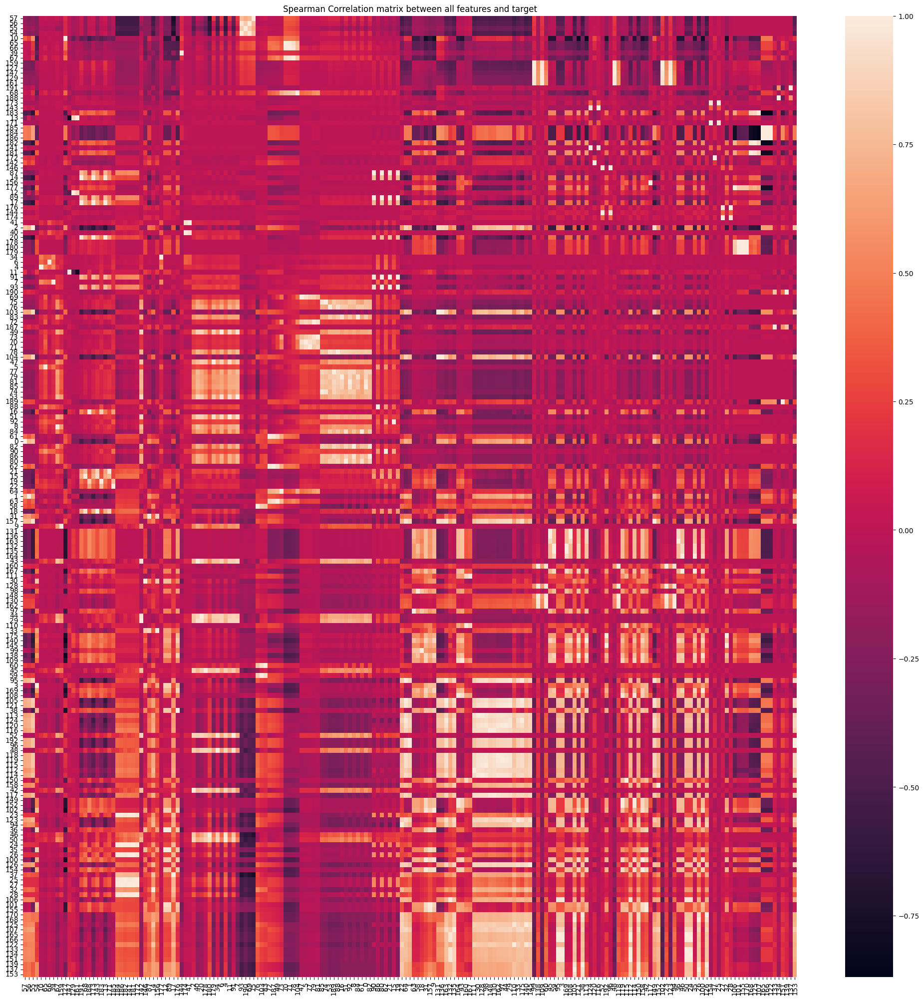

In [ ]:
## pearson Correlation between features and target

df_excl_stid_timeid = train_feat_df[train_feat_df.columns[2:]]
corr_mat = df_excl_stid_timeid.corr(method='spearman')
plt.figure(figsize=(25, 25))


## sort features based on average correlation with other features
## so that we see the features with highest average correlation with other features at the bottom
## and features with lowest average correlation with other features at the top
## darker colors appera at the top and lighter colors at the bottom
## This can help to elimiate some features that are highly correlated with other features
## target, tlog_target is column number 102. 103 of df_excl_stid_timeid matrix as shown in corr plot below

sorted_corr_mat = corr_mat.iloc[np.argsort(np.mean(corr_mat , axis=1)).values]
sns.heatmap(data=sorted_corr_mat, annot=False,xticklabels=np.argsort(np.mean(corr_mat , axis=1)).values, yticklabels=np.argsort(np.mean(corr_mat , axis=1)).values)
plt.title(f'Spearman Correlation matrix between all features and target')
plt.show()

In [ ]:
## barplot of pearson correlation of all features with target



fig = px.bar(x=corr_mat["target"].sort_values(ascending=False).index[:50], y=corr_mat["target"].sort_values(ascending=False).values[:50], title='Spearman correlation of all features with target')
fig.show()

fig = px.bar(x=corr_mat["target"].sort_values(ascending=False).index[50:100], y=corr_mat["target"].sort_values(ascending=False).values[50:100], title='Spearman correlation of all features with target')
fig.show()

fig = px.bar(x=corr_mat["target"].sort_values(ascending=False).index[100:150], y=corr_mat["target"].sort_values(ascending=False).values[100:150], title='Spearman correlation of all features with target')
fig.show()

fig = px.bar(x=corr_mat["target"].sort_values(ascending=False).index[150:], y=corr_mat["target"].sort_values(ascending=False).values[150:], title='Spearman correlation of all features with target')
fig.show()


In [ ]:
## Mutual information between features and target




In [ ]:
## borutapy feature selection



##### Distinguish between boolean, numerical and categorical features

In [ ]:
## rename columns to remove special characters
# df = train_feat_df.copy()

# import re
# train_feat_df = train_feat_df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))




In [ ]:
train_feat_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 428932 entries, 0 to 428931
Columns: 195 entries, time_id to tlog_target
dtypes: category(15), float32(18), float64(160), int16(1), int64(1)
memory usage: 563.3 MB


In [ ]:
### Identify the numerical, categorical features and TARGET

float32_feat_submission = train_feat_df.dtypes[train_feat_df.dtypes == 'float32'].index

float64_feat_submission = train_feat_df.dtypes[train_feat_df.dtypes == 'float64'].index

int64_feat_submission  = train_feat_df.dtypes[train_feat_df.dtypes == 'int64'].index

int16_feat_submission  = train_feat_df.dtypes[train_feat_df.dtypes == 'int16'].index

category_feat_submission  = train_feat_df.dtypes[train_feat_df.dtypes == 'category'].index

target_labels_submission  = train_feat_df[['target', 'tlog_target']]


#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('float32_feat_submission.pkl', 'wb') as fp:
    pickle.dump(float32_feat_submission, fp)

with open('float64_feat_submission.pkl', 'wb') as fp:
    pickle.dump(float64_feat_submission, fp)

with open('int64_feat_submission.pkl', 'wb') as fp:
    pickle.dump(int64_feat_submission, fp)

with open('int16_feat_submission.pkl', 'wb') as fp:
    pickle.dump(int16_feat_submission, fp)

with open('category_feat_submission.pkl', 'wb') as fp:
    pickle.dump(category_feat_submission, fp)

with open('target_labels_submission.pkl', 'wb') as fp:
    pickle.dump(target_labels_submission, fp)


In [ ]:

# ## load reordered train_feat_df
# os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
# with open('train_feat_df_reordered_submission.pkl', 'rb') as fp:
#     train_feat_df_reordered = pickle.load(fp)

# train_feat_df_reordered

In [ ]:
#### Check that no two columns have the same values
train_feat_df_reordered = train_feat_df.copy()
del train_feat_df

for c in train_feat_df_reordered.columns:
    ctr=0
    for c1 in train_feat_df_reordered.columns:
        if np.array_equal(train_feat_df_reordered[c], train_feat_df_reordered[c1]) and c!=c1:
            ctr+=1
            print(c, c1)

### XGB for feature selection

In [ ]:
#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('feat_normalization_mu_std_df.pkl', 'rb') as fr:
    feat_normalization_mu_std_df = pickle.load(fr)

In [ ]:

hand_picked_cols = [
    "time_id",
    "stock_id",
    "log_wap1_log_price_ret_vol",
    "wap1_log_price_ret_per_liq2_vol",
    #"target",
    'target' # log target is easier to transform back than log_target_standardized
]


In [ ]:
train_feat_df_reordered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 428932 entries, 0 to 428931
Columns: 195 entries, time_id to tlog_target
dtypes: category(15), float32(18), float64(160), int16(1), int64(1)
memory usage: 563.3 MB


In [ ]:
import xgboost as xgb
from sklearn.preprocessing import OneHotEncoder
from xgboost import plot_tree
from sklearn.utils import class_weight
from xgboost import plot_importance

from sklearn.model_selection import RepeatedKFold, cross_val_score, TimeSeriesSplit


import optuna
from optuna.trial import TrialState


df_copy = train_feat_df_reordered.copy()

## convert stock id and time id to categorical feature
df_copy['stock_id'] = df_copy['stock_id'].astype('category')
df_copy['time_id'] = df_copy['time_id'].astype('category')

category_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'category']
float32_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'float32']
float64_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'float64']
float64_feat_labels.remove('target') #target, log_target
float64_feat_labels.remove('tlog_target')


#cat_feat_labels = obj_feat_labels+int16_feat_labels +int32_feat_labels+ int64_feat_labels
cat_feat_labels = category_feat_labels #int16_feat_labels + int64_feat_labels #+ category_feat_labels


time_id_order = df_copy.loc[:3829,'time_id'].values # select ordered unique time_ids
train_time_id_ind = int(len(time_id_order)*0.7)
n_folds = 10
folds = TimeSeriesSplit(n_splits=n_folds,)# max_train_size=None, gap=10)
splits = folds.split( range( train_time_id_ind ) ) # split 70% train time_ids into n_fold splits

train_time_ids = time_id_order[:train_time_id_ind]
train_stock_id = df_copy[df_copy['time_id'].isin(train_time_ids)]['stock_id']
train_time_id = df_copy[df_copy['time_id'].isin(train_time_ids)]['time_id']

test_time_ids = time_id_order[train_time_id_ind:]
test_df = df_copy[df_copy['time_id'].isin(test_time_ids)]
test_stock_id = test_df['stock_id']
test_time_id = test_df['time_id']

# feature_importances = pd.DataFrame()
# feat_cols_list = float32_feat_labels + float64_feat_labels + cat_feat_labels # +int32_feat_labels+int64_feat_labels+float32_feat_labels+float64_feat_labels
feat_cols_list = float32_feat_labels + float64_feat_labels + cat_feat_labels # +int32_feat_labels+int64_feat_labels+float32_feat_labels+float64_feat_labels


#target_name = 'tlog_target' # _standardized' log target is easier to transform back than log_target_standardized
target_name = 'tlog_target' # _standardized' log target is easier to transform back than log_target_standardized


def rmspe(y_true, y_pred):
    return np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))


# Custom RMSPE objective function
def rmspe_objective(preds, dtrain):
    labels = dtrain.get_label()
    errors = (preds - labels) / labels
    gradient = 2 * errors / (1 + errors**2)
    hessian = 2 * (1 - errors**2) / (1 + errors**2)**2
    return gradient, hessian


def xgb_RMSPE(preds, train_data):
    labels = train_data.get_label()
    return 'RMSPE', round(rmspe(y_true = labels, y_pred = preds),5)

def nancorr(a, b):
    v = np.isfinite(a)*np.isfinite(b) > 0
    return np.corrcoef(a[v], b[v])[0,1]

def xgb_train_validate(df_copy,params_xgb,n_rounds,esr,trial):
    rmspe_val_score = []
    models= []
    test_y_preds = np.zeros(len(test_df))
    best_iterations = []
    learning_train_rmspe = []
    learning_val_rmspe = []

    time_id_order = df_copy.loc[:3829,'time_id'].values # select ordered unique time_ids
    train_time_id_ind = int(len(time_id_order)*0.7)
    n_folds = 10
    folds = TimeSeriesSplit(n_splits=n_folds,)# max_train_size=None, gap=10)
    splits = folds.split( range( train_time_id_ind ) ) # split 70% train time_ids into n_fold splits


    for fold_n, (train_index, valid_index) in enumerate(splits):
        print('Fold:',fold_n+1)
        # print('train_index',train_index)
        # print('valid_index',valid_index)
        train_time_ids = time_id_order[train_index]
        val_time_ids = time_id_order[valid_index]
        train_df = df_copy[df_copy['time_id'].isin(train_time_ids)]
        val_df = df_copy[df_copy['time_id'].isin(val_time_ids)]

        X_train = train_df[feat_cols_list]
        y_train = train_df[target_name] # target
        w_train = train_df["target"]**-2
        X_valid = val_df[feat_cols_list]
        y_val = val_df[target_name] # target
        w_val = val_df["target"]**-2


        print('Training....')
        dtrain = xgb.DMatrix(X_train, label=y_train,weight=w_train,enable_categorical=True)
        dvalid = xgb.DMatrix(X_valid,   label=  y_val,weight=w_val,enable_categorical=True)
        # dtrain = xgb.DMatrix(X_train, label=y_train,enable_categorical=True)
        # dvalid = xgb.DMatrix(X_valid,   label=  y_val,enable_categorical=True)

        watchlist  = [(dtrain,'train_loss_fold_'+str(fold_n+1)), (dvalid, 'val_loss_fold_'+str(fold_n+1))]
        evals_result = {}
        reg = xgb.train(params=params_xgb, dtrain=dtrain, num_boost_round=n_rounds, evals=watchlist, obj=rmspe_objective,custom_metric=xgb_RMSPE,  evals_result=evals_result,maximize=False,  early_stopping_rounds=esr,verbose_eval=False)
        learning_train_rmspe.append(evals_result['train_loss_fold_'+str(fold_n+1)])
        learning_val_rmspe.append(evals_result['val_loss_fold_'+str(fold_n+1)])

        models.append(reg)
        best_iterations.append(reg.best_iteration)

        p = reg.predict(dvalid)

        if (target_name == 'tlog_target'):
            #print('corr(p, y_val)',nancorr(       p ,        y_val ))
            ori_p = np.exp( p )
            ori_y_val = np.exp( y_val )
            #print('corr(p, y_val)',nancorr(ori_p, ori_y_val))

            #print("val_df",val_df["target"], 'ori_y_val',ori_y_val)

            val_score =  np.mean( ((ori_p-ori_y_val)/ori_y_val)**2 )**0.5
            print(f'fold: {fold_n+1}, val rmspe score is {val_score}')

        elif(target_name == 'target'):
            val_score =  np.mean( ((p-y_val)/y_val)**2 )**0.5
            print(f'fold: {fold_n+1}, val rmspe score is {val_score}')

        #test_pred = reg.predict(self.test_df[self.feat_cols_list] )*v1ts ## this method is not suitable for Timeseries cross validation because initial splits are too far from test set.
        #test_y_preds += test_pred/self.n_folds

        rmspe_val_score.append(val_score)

    mean_rmspe_val_score = np.mean(rmspe_val_score)
    print(f'mean rmspe val score over {n_folds} splits is',mean_rmspe_val_score)
    #print(f'mean rmspe test score: ',  np.mean( ((test_y_preds-self.test_df[self.target_name])/self.test_df[self.target_name])**2 )**0.5  ) # target

    print('rmspe_val_score',len(rmspe_val_score))
    print('learning_val_rmspe',len(learning_val_rmspe))
    # Plot learning curves
    fig,ax = plt.subplots(2,1,figsize=(10,6))
    for fold_n in range(len(rmspe_val_score)):
        ax[0].plot(learning_train_rmspe[fold_n]['RMSPE'], label=f'Fold {fold_n+1} Train RMSPE')
        ax[0].plot(learning_val_rmspe[fold_n]['RMSPE'],linestyle='dashed', label=f'Fold {fold_n+1} Validation RMSPE')
    last_fold = len(rmspe_val_score) - 1
    ax[1].plot(learning_val_rmspe[last_fold]['RMSPE'],linestyle='dashed', label=f'Fold {last_fold+1} Validation RMSPE')
    ax[1].set_xlabel('Boosting Round')
    ax[0].set_ylabel('RMSPE')
    ax[1].set_ylabel('RMSPE')
    ax[0].legend()
    ax[1].legend()
    ax[0].grid(True)
    ax[1].grid(True)
    fig.suptitle(f'Learning Curves, Trial: {1}')
    fig.show()

    fig, ax = plt.subplots(figsize=(10, 10))
    xgb.plot_importance(reg, importance_type='gain', max_num_features=30, height=0.8, show_values=False)
    fig.show()


    del df_copy, X_train, X_valid, y_train, y_val,train_df,val_df,dtrain,dvalid
    gc.collect()
    return mean_rmspe_val_score,best_iterations[-1]




num_trees = 300

def objective(trial):

    ######  SET Hyperparameter's range for tuning ######
    early_stopping_rounds = 25
    num_round= num_trees
    seed1=11
    missing_value = -np.inf   # Replace with a suitable value

    # Hyperparameters and algorithm parameters are described here
    params = {'disable_default_eval_metric': 1,
              "max_depth": trial.suggest_int('max_depth', 5, 10),
            "eta": trial.suggest_float(name='eta', low=0.001, high=1,log=True),
            "subsample" : round(trial.suggest_float(name='subsample', low=0.5, high=1.0,step=0.1),1),
            "colsample_bytree": round(trial.suggest_float(name='colsample_bytree', low=0.0, high=0.8,step=0.1),1),
            'gamma': trial.suggest_int('gamma', 1, 5),
            'reg_alpha': trial.suggest_int('reg_alpha', 2, 8),
            'reg_lambda': trial.suggest_int('reg_lambda', 2, 5),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 8),
            "tree_method": 'hist',
            "device": "cuda",
            "seed":seed1,
            #'missing': missing_value
            }


    ######  SET Hyperparameter's range for tuning ######

    val_avg_error,best_iteration = xgb_train_validate(df_copy,params,num_round,early_stopping_rounds,trial)
    trial.set_user_attr("best_iteration", best_iteration)

    return val_avg_error




study = optuna.create_study(direction="minimize")
study.optimize(objective, timeout=12000, n_trials=25) # 50

pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("Trial no.: ",trial.number)
print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

#print("Best hyperparameters:", study.best_params)

fig = optuna.visualization.plot_parallel_coordinate(study)
fig.show()

fig = optuna.visualization.plot_optimization_history(study)
fig.show()

fig = optuna.visualization.plot_slice(study)
fig.show()

fig = optuna.visualization.plot_param_importances(study)
fig.show()




In [ ]:
# ######### jager normalization

# import xgboost as xgb
# from sklearn.preprocessing import OneHotEncoder
# from xgboost import plot_tree
# from sklearn.utils import class_weight
# from xgboost import plot_importance

# from sklearn.model_selection import RepeatedKFold, cross_val_score, TimeSeriesSplit


# import optuna
# from optuna.trial import TrialState


# df_copy = train_feat_df_reordered.copy()

# #obj_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'object']
# int16_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'int16']
# int32_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'int32']
# int64_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'int64']
# float32_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'float32']
# float64_feat_labels = [col for col, dtype in df_copy.dtypes.items() if dtype == 'float64']
# float64_feat_labels.remove('target') #target, log_target
# float64_feat_labels.remove('tlog_target')


# #df2[obj_feat_labels] = df2[obj_feat_labels].astype('category')
# df_copy[int16_feat_labels] = df_copy[int16_feat_labels].astype('category')
# df_copy[int32_feat_labels] = df_copy[int32_feat_labels].astype('category')
# df_copy[int64_feat_labels] = df_copy[int64_feat_labels].astype('category')

# #cat_feat_labels = obj_feat_labels+int16_feat_labels +int32_feat_labels+ int64_feat_labels
# cat_feat_labels = int16_feat_labels + int64_feat_labels + int32_feat_labels



# time_id_order = df_copy.loc[:3829,'time_id'].values # select ordered unique time_ids
# train_time_id_ind = int(len(time_id_order)*0.7)
# n_folds = 10
# folds = TimeSeriesSplit(n_splits=n_folds,)# max_train_size=None, gap=10)
# splits = folds.split( range( train_time_id_ind ) ) # split 70% train time_ids into n_fold splits

# train_time_ids = time_id_order[:train_time_id_ind]
# train_stock_id = df_copy[df_copy['time_id'].isin(train_time_ids)]['stock_id']
# train_time_id = df_copy[df_copy['time_id'].isin(train_time_ids)]['time_id']

# test_time_ids = time_id_order[train_time_id_ind:]
# test_df = df_copy[df_copy['time_id'].isin(test_time_ids)]
# test_stock_id = test_df['stock_id']
# test_time_id = test_df['time_id']

# # feature_importances = pd.DataFrame()
# feat_cols_list = float32_feat_labels+float64_feat_labels # + cat_feat_labels int32_feat_labels+int64_feat_labels+float32_feat_labels+float64_feat_labels
# # feature_importances['feature'] = self.feat_cols_list

# target_name = 'target' # _standardized' log target is easier to transform back than log_target_standardized


# def rmspe(y_true, y_pred):
#     return np.sqrt(np.mean(np.square((y_true - y_pred) / y_true)))


# # Custom RMSPE objective function
# def rmspe_objective(preds, dtrain):
#     labels = dtrain.get_label()
#     errors = (preds - labels) / labels
#     gradient = 2 * errors / (1 + errors**2)
#     hessian = 2 * (1 - errors**2) / (1 + errors**2)**2
#     return gradient, hessian


# def xgb_RMSPE(preds, train_data):
#     labels = train_data.get_label()
#     return 'RMSPE', round(rmspe(y_true = labels, y_pred = preds),5)

# def nancorr(a, b):
#     v = np.isfinite(a)*np.isfinite(b) > 0
#     return np.corrcoef(a[v], b[v])[0,1]


# def xgb_train_validate(params_xgb,n_rounds,esr,trial):
#     rmspe_val_score = []
#     models= []
#     test_y_preds = np.zeros(len(test_df))
#     best_iterations = []
#     learning_train_rmspe = []
#     learning_val_rmspe = []

#     time_id_order = df_copy.loc[:3829,'time_id'].values # select ordered unique time_ids
#     train_time_id_ind = int(len(time_id_order)*0.7)
#     n_folds = 10
#     folds = TimeSeriesSplit(n_splits=n_folds,)# max_train_size=None, gap=10)
#     splits = folds.split( range( train_time_id_ind ) ) # split 70% train time_ids into n_fold splits


#     for fold_n, (train_index, valid_index) in enumerate(splits):
#         print('Fold:',fold_n+1)
#         # print('train_index',train_index)
#         # print('valid_index',valid_index)
#         train_time_ids = time_id_order[train_index]
#         val_time_ids = time_id_order[valid_index]
#         train_df = df_copy[df_copy['time_id'].isin(train_time_ids)]
#         val_df = df_copy[df_copy['time_id'].isin(val_time_ids)]

#         X_train = train_df[feat_cols_list]
#         y_train = train_df[target_name] # target
#         X_valid = val_df[feat_cols_list]
#         y_val = val_df[target_name] # target

#         v1tr = np.exp(X_train['log_wap1_log_price_ret_vol']) # double exponential to nullify the log
#         v1v = np.exp(  X_valid['log_wap1_log_price_ret_vol']) # double exponential to nullify the log

#         # v1tr = np.exp(np.exp(X_train['log_wap1_log_price_ret_vol'])) # double exponential to nullify the log
#         # v1v = np.exp(np.exp(  X_valid['log_wap1_log_price_ret_vol'])) # double exponential to nullify the log
#         #v1ts = np.exp(np.exp( self.test_df['log_wap1_log_price_ret_vol'])) # double exponential to nullify log

#         w_train = y_train **-2 * v1tr**2
#         w_val = y_val **-2 * v1v**2

#         print('Training....')
#         dtrain = xgb.DMatrix(X_train, label=y_train/v1tr,weight=w_train,enable_categorical=True)
#         dvalid = xgb.DMatrix(X_valid,   label=  y_val/v1v,weight=w_val,enable_categorical=True)
#         watchlist  = [(dtrain,'train_loss_fold_'+str(fold_n+1)), (dvalid, 'val_loss_fold_'+str(fold_n+1))]
#         evals_result = {}
#         reg = xgb.train(params=params_xgb, dtrain=dtrain, num_boost_round=n_rounds, evals=watchlist, obj=rmspe_objective,custom_metric=xgb_RMSPE,  evals_result=evals_result,maximize=False,  early_stopping_rounds=esr,verbose_eval=False)
#         learning_train_rmspe.append(evals_result['train_loss_fold_'+str(fold_n+1)])
#         learning_val_rmspe.append(evals_result['val_loss_fold_'+str(fold_n+1)])

#         models.append(reg)
#         best_iterations.append(reg.best_iteration)

#         p = reg.predict(dvalid)*v1v
#         val_score =  np.mean( ((p-y_val)/y_val)**2 )**0.5

#         # full_score += y_val.shape[0]*score**2

#         print(f'fold: {fold_n+1}, val rmspe score is {val_score}')
#         #print('corr(p/v1v, y_val/v1v)',nancorr(       p/v1v ,        y_val/v1v ))
#         #print('log(corr( ))',nancorr(np.log(p/v1v), np.log(y_val/v1v)))
#         #print('corr(p, y_val)',nancorr(p, y_val))
#         #print('log(corr( ))',nancorr(np.log(p), np.log(y_val)))

#         #test_pred = reg.predict(self.test_df[self.feat_cols_list] )*v1ts ## this method is not suitable for Timeseries cross validation because initial splits are too far from test set.
#         #test_y_preds += test_pred/self.n_folds

#         rmspe_val_score.append(val_score)

#     mean_rmspe_val_score = np.mean(rmspe_val_score)
#     print(f'mean rmspe val score over {n_folds} splits is',mean_rmspe_val_score)
#     #print(f'mean rmspe test score: ',  np.mean( ((test_y_preds-self.test_df[self.target_name])/self.test_df[self.target_name])**2 )**0.5  ) # target

#     print("learning_val_rmspe[last_fold]['RMSPE']",learning_val_rmspe)

#     # Plot learning curves
#     fig,ax = plt.subplots(2,1,figsize=(10,6))
#     for fold_n in range(len(rmspe_val_score)):
#         ax[0].plot(learning_train_rmspe[fold_n]['RMSPE'], label=f'Fold {fold_n+1} Train RMSPE')
#         ax[0].plot(learning_val_rmspe[fold_n]['RMSPE'],linestyle='dashed', label=f'Fold {fold_n+1} Validation RMSPE')
#     last_fold = len(rmspe_val_score) - 1
#     ax[1].plot(learning_val_rmspe[last_fold]['RMSPE'],linestyle='dashed', label=f'Fold {last_fold+1} Validation RMSPE')
#     ax[1].set_xlabel('Boosting Round')
#     ax[0].set_ylabel('RMSPE')
#     ax[1].set_ylabel('RMSPE')
#     ax[0].legend()
#     ax[1].legend()
#     ax[0].grid(True)
#     ax[1].grid(True)
#     fig.suptitle(f'Learning Curves, Trial: {trial.number}')
#     fig.show()

#     del X_train, X_valid, y_train, y_val,train_df,val_df,dtrain,dvalid, v1tr, v1v
#     gc.collect()
#     return mean_rmspe_val_score,best_iterations[-1]




# num_trees = 300

# def objective(trial):

#     ######  SET Hyperparameter's range for tuning ######
#     early_stopping_rounds = 25
#     num_round= num_trees
#     seed1=11
#     missing_value = -np.inf   # Replace with a suitable value

#     # Hyperparameters and algorithm parameters are described here
#     params = {'disable_default_eval_metric': 1,
#               "max_depth": trial.suggest_int('max_depth', 1, 5),
#             "eta": trial.suggest_float(name='eta', low=0.01, high=1,log=True),
#             "subsample" : round(trial.suggest_float(name='subsample', low=0.5, high=1.0,step=0.1),1),
#             "colsample_bytree": round(trial.suggest_float(name='colsample_bytree', low=0.0, high=0.8,step=0.1),1),
#             'gamma': trial.suggest_int('gamma', 1, 5),
#             'reg_alpha': trial.suggest_int('reg_alpha', 2, 8),
#             'reg_lambda': trial.suggest_int('reg_lambda', 2, 5),
#             'min_child_weight': trial.suggest_int('min_child_weight', 1, 8),
#             "tree_method": 'hist',
#             "device": "cuda",
#             "seed":seed1,
#             #'missing': missing_value
#             }


#     ######  SET Hyperparameter's range for tuning ######

#     val_avg_error,best_iteration = xgb_train_validate(params,num_round,early_stopping_rounds,trial)
#     trial.set_user_attr("best_iteration", best_iteration)

#     return val_avg_error




# study = optuna.create_study(direction="minimize")
# study.optimize(objective, timeout=12000, n_trials=25) # 50

# pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
# complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

# print("Study statistics: ")
# print("  Number of finished trials: ", len(study.trials))
# print("  Number of pruned trials: ", len(pruned_trials))
# print("  Number of complete trials: ", len(complete_trials))

# print("Best trial:")
# trial = study.best_trial

# print("Trial no.: ",trial.number)
# print("  Value: ", trial.value)

# print("  Params: ")
# for key, value in trial.params.items():
#     print("    {}: {}".format(key, value))

# #print("Best hyperparameters:", study.best_params)

# fig = optuna.visualization.plot_parallel_coordinate(study)
# fig.show()

# fig = optuna.visualization.plot_optimization_history(study)
# fig.show()

# fig = optuna.visualization.plot_slice(study)
# fig.show()

# fig = optuna.visualization.plot_param_importances(study)
# fig.show()




#### tsfresh feature extraction and selection

In [ ]:
###### identify features for tsfresh feature extraction ######
# do not include any categorical columns

xgboost_important_feat =['v1spprojt15f25', 'v1spprojt15f25_q1','v1spprojt15f29', 'v1spprojt10f29','wap1_log_price_ret_volstock_mean_from_20', 'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock',
 'wap1_log_price_ret_volstock_mean_from_25', 'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20', 'v1proj_29_15_q3', "v1spprojtf25_q1" , 'v1proj_25',
                         'soft_stock_mean_tvpl2_liqf_volf20', 'tlog_eps523_trade_price_n_wap_eqi_price0_dev', 'bs_bp_corr2', 'tlog_max_bid_size2'] #, 'v1spprojt15f29_q1', 'wap1_log_price_ret_volstock_mean_from_10' ]

target_high_Corr_feat = ['log_wap1_log_price_ret_vol','tlog_first_10_min_vol', 'tlog_book_ewma_vol','tlog_eps1e4_trade_price_real_vol', 'wap1_log_price_ret_per_liq2_vol', 'tlog_eps523_trade_price_n_wap1_dev',
'tlog_eps523_trade_price_n_wap_eqi_price0_dev','vol1_mean','tlog_tlinear_range_ask_price2','tlog_tlinear_range_bid_price2', 'tlog_tlog1p_eps1e4_range_ask_price1', 'tlog_tlog1p_eps1e4_range_bid_price1',
'tlog_1p_trade_ewma_vol','tlog_tlinear_range_price1','tlog_tlinear_sad_ask_price2']

col_list = set(xgboost_important_feat + target_high_Corr_feat)


In [ ]:
"""
Create TSFRESH Time series features


Features for TSFRESH feature extraction are selected based feature importance from the lgbm model and high correlation with target variable
"""
df_reordered = train_feat_df_reordered
df_reordered['seq_id'] = range(df_reordered.shape[0])

win_lengths = [10] # hyperparameter

feature_settings = {'fft_coefficient': [{'coeff': 1, 'attr': 'angle'}, {'coeff': 1, 'attr': 'abs'},{'coeff': 2, 'attr': 'angle'}, {'coeff': 2, 'attr': 'abs'}],
                    'time_reversal_asymmetry_statistic':[{'lag': 10}],
                    'ratio_beyond_r_sigma': [{'r': 2}],
                    'absolute_sum_of_changes': None,
                    'mean_second_derivative_central': None,
                    'first_location_of_maximum':None,
                    'linear_trend':[{'attr': 'slope'}],
                    'cid_ce': [{'normalize': True}],
                    'count_above_mean': None,
                    'longest_strike_above_mean': None,
                    'longest_strike_below_mean': None,
                    'c3': [{'lag': 1}, {'lag': 2}, {'lag': 3}, ],
                    'approximate_entropy':[{  'm':30, 'r':0.1}],
                    'autocorrelation': [{'lag': 1}, {'lag': 2}, {'lag': 3}, {'lag': 4}, {'lag': 5}, {'lag': 6}],
                    'partial_autocorrelation': [{'lag': 1}, {'lag': 2}, {'lag': 3} ,{'lag': 4}, {'lag': 5}, {'lag': 6}]}


for c in col_list: # select 1 numeric column at a time, leave out target and long lags
    print('time series name: ',c)
    for win in win_lengths:
        num_df = df_reordered.loc[:,['seq_id','stock_id',c]]
        print('num_df.shape', num_df.shape)
        df_rolled = tsf.utilities.dataframe_functions.roll_time_series(num_df,column_id='stock_id',column_sort='seq_id',max_timeshift=win)
        df_rolled.drop(columns=['stock_id'], inplace=True)
        df_features = tsf.extract_features(df_rolled, column_id='id', column_sort='seq_id',
                                            default_fc_parameters=feature_settings, n_jobs=-1)
        del df_rolled # free-up the RAM

        # Remove any missing values
        imputed_features = impute(df_features)
        del df_features # free-up the RAM

        # Select a subset of relevant features using tsfresh's built-in feature selection function
        imputed_features.index = range(df_reordered.shape[0])
        selected_features = tsf.select_features(imputed_features, df_reordered['target'])
        del imputed_features # free-up the RAM

        # Print the names of the selected features
        print('selected_features.columns',selected_features.columns)

        print('selected_features.columns: ',selected_features.columns)
        print('selected_features.shape: ',selected_features.shape)

        print('all_stns_df.columns: ',df_reordered.columns)
        print('all_stns_df.shape: ',df_reordered.shape)

        df_reordered = pd.concat([df_reordered,selected_features],axis=1)

        del num_df # free-up the RAM
        del selected_features # free-up the RAM



df_reordered.drop(columns=['seq_id'], inplace=True)
df_reordered_tsfresh = df_reordered

#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('df_reordered_tsfresh_submission.pkl', 'wb') as fp:
    pickle.dump(df_reordered,fp)
    print('df_reordered_tsfresh_submission.pkl file')

time series name:  tlog_tlinear_sad_ask_price2
num_df.shape (428932, 3)


Feature Extraction: 100%|██████████| 30/30 [04:23<00:00,  8.77s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_tlinear_sad_ask_price2__partial_autocorrelation__lag_5'
 'tlog_tlinear_sad_ask_price2__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_tlinear_sad_ask_price2__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_tlinear_sad_ask_price2__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_tlinear_sad_ask_price2__fft_coefficient__attr_"abs"__coeff_2',
       'tlog_tlinear_sad_ask_price2__ratio_beyond_r_sigma__r_2',
       'tlog_tlinear_sad_ask_price2__mean_second_derivative_central',
       'tlog_tlinear_sad_ask_price2__absolute_sum_of_changes',
       'tlog_tlinear_sad_ask_price2__first_location_of_maximum',
       'tlog_tlinear_sad_ask_price2__linear_trend__attr_"slope"',
       'tlog_tlinear_sad_ask_price2__c3__lag_2',
       'tlog_tlinear_sad_ask_price2__count_above_mean',
       'tlog_tlinear_sad_ask_price2__c3__lag_1',
       'tlog_tlinear_sad_ask_price2__longest_strike_below_mean',
       'tlog_tlinear_sad_ask_price2__c3__lag_3',
       'tlog_tlinear_sad_ask_price2__autocorrelation__lag_1',
       'tlog_tlinear_sad_ask_price2__partial_autocorrelation__lag_1',
       'tlog_

Feature Extraction: 100%|██████████| 30/30 [04:13<00:00,  8.43s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_eps1e4_trade_price_real_vol__partial_autocorrelation__lag_5'
 'tlog_eps1e4_trade_price_real_vol__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_eps1e4_trade_price_real_vol__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_eps1e4_trade_price_real_vol__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_eps1e4_trade_price_real_vol__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_eps1e4_trade_price_real_vol__first_location_of_maximum',
       'tlog_eps1e4_trade_price_real_vol__mean_second_derivative_central',
       'tlog_eps1e4_trade_price_real_vol__c3__lag_2',
       'tlog_eps1e4_trade_price_real_vol__longest_strike_above_mean',
       'tlog_eps1e4_trade_price_real_vol__linear_trend__attr_"slope"',
       'tlog_eps1e4_trade_price_real_vol__c3__lag_3',
       'tlog_eps1e4_trade_price_real_vol__c3__lag_1',
       'tlog_eps1e4_trade_price_real_vol__partial_autocorrelation__lag_1',
       'tlog_eps1e4_trade_price_real_vol__autocorrelation__lag_1',
       'tlog_eps1e4_trade_price_real_vol__ratio_beyond_r_sigma__r_2',
       'tlog_eps1e4_trade_price_real_vol__count_above_mean',
      

Feature Extraction: 100%|██████████| 30/30 [04:13<00:00,  8.46s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_tlinear_range_price1__partial_autocorrelation__lag_5'
 'tlog_tlinear_range_price1__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_tlinear_range_price1__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_tlinear_range_price1__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_tlinear_range_price1__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_tlinear_range_price1__fft_coefficient__attr_"abs"__coeff_2',
       'tlog_tlinear_range_price1__absolute_sum_of_changes',
       'tlog_tlinear_range_price1__mean_second_derivative_central',
       'tlog_tlinear_range_price1__first_location_of_maximum',
       'tlog_tlinear_range_price1__linear_trend__attr_"slope"',
       'tlog_tlinear_range_price1__c3__lag_3',
       'tlog_tlinear_range_price1__count_above_mean',
       'tlog_tlinear_range_price1__c3__lag_2',
       'tlog_tlinear_range_price1__c3__lag_1',
       'tlog_tlinear_range_price1__ratio_beyond_r_sigma__r_2',
       'tlog_tlinear_range_price1__partial_autocorrelation__lag_1',
       'tlog_tlinear_range_price1__autocorrelation__lag_1',
       'tlog_tlinear_range_price

Feature Extraction: 100%|██████████| 30/30 [04:10<00:00,  8.36s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['v1proj_29_15_q3__partial_autocorrelation__lag_5'
 'v1proj_29_15_q3__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['v1proj_29_15_q3__fft_coefficient__attr_"angle"__coeff_1',
       'v1proj_29_15_q3__fft_coefficient__attr_"angle"__coeff_2',
       'v1proj_29_15_q3__mean_second_derivative_central',
       'v1proj_29_15_q3__absolute_sum_of_changes',
       'v1proj_29_15_q3__c3__lag_1',
       'v1proj_29_15_q3__linear_trend__attr_"slope"',
       'v1proj_29_15_q3__partial_autocorrelation__lag_1',
       'v1proj_29_15_q3__autocorrelation__lag_1', 'v1proj_29_15_q3__c3__lag_3',
       'v1proj_29_15_q3__autocorrelation__lag_5',
       'v1proj_29_15_q3__count_above_mean',
       'v1proj_29_15_q3__partial_autocorrelation__lag_3',
       'v1proj_29_15_q3__first_location_of_maximum',
       'v1proj_29_15_q3__fft_coefficient__attr_"abs"__coeff_2',
       'v1proj_29_15_q3__autocorrelation__lag_3',
       'v1proj_29_15_q3__longest_strike_above_mean',
       'v1proj_29_15_q3__cid_ce__normalize_True',
       'v1proj_29_15_q3__fft_coefficient__attr_"abs"__coeff_1',
       'v1proj_29_

Feature Extraction: 100%|██████████| 30/30 [04:23<00:00,  8.80s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_max_bid_size2__partial_autocorrelation__lag_5'
 'tlog_max_bid_size2__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_max_bid_size2__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_max_bid_size2__fft_coefficient__attr_"abs"__coeff_2',
       'tlog_max_bid_size2__absolute_sum_of_changes',
       'tlog_max_bid_size2__c3__lag_2', 'tlog_max_bid_size2__c3__lag_3',
       'tlog_max_bid_size2__c3__lag_1',
       'tlog_max_bid_size2__linear_trend__attr_"slope"',
       'tlog_max_bid_size2__first_location_of_maximum',
       'tlog_max_bid_size2__longest_strike_above_mean',
       'tlog_max_bid_size2__partial_autocorrelation__lag_1',
       'tlog_max_bid_size2__autocorrelation__lag_1',
       'tlog_max_bid_size2__mean_second_derivative_central',
       'tlog_max_bid_size2__cid_ce__normalize_True',
       'tlog_max_bid_size2__autocorrelation__lag_5',
       'tlog_max_bid_size2__count_above_mean',
       'tlog_max_bid_size2__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_max_bid_size2__autocorrelation__lag_4',
       'tlog_max_bid_size2__autocorrelation__lag_6',
 

Feature Extraction: 100%|██████████| 30/30 [04:12<00:00,  8.43s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['soft_stock_mean_tvpl2_liqf_volf20__partial_autocorrelation__lag_5'
 'soft_stock_mean_tvpl2_liqf_volf20__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['soft_stock_mean_tvpl2_liqf_volf20__fft_coefficient__attr_"angle"__coeff_1',
       'soft_stock_mean_tvpl2_liqf_volf20__fft_coefficient__attr_"abs"__coeff_1',
       'soft_stock_mean_tvpl2_liqf_volf20__mean_second_derivative_central',
       'soft_stock_mean_tvpl2_liqf_volf20__first_location_of_maximum',
       'soft_stock_mean_tvpl2_liqf_volf20__c3__lag_1',
       'soft_stock_mean_tvpl2_liqf_volf20__c3__lag_2',
       'soft_stock_mean_tvpl2_liqf_volf20__c3__lag_3',
       'soft_stock_mean_tvpl2_liqf_volf20__linear_trend__attr_"slope"',
       'soft_stock_mean_tvpl2_liqf_volf20__autocorrelation__lag_6',
       'soft_stock_mean_tvpl2_liqf_volf20__fft_coefficient__attr_"angle"__coeff_2',
       'soft_stock_mean_tvpl2_liqf_volf20__longest_strike_above_mean',
       'soft_stock_mean_tvpl2_liqf_volf20__absolute_sum_of_changes',
       'soft_stock_mean_tvpl2_liqf_volf20__ratio_beyond_r_sigma__r_2',
       'soft_stock_mean_tvpl2_liqf_volf20__cid_ce__normalize_

Feature Extraction: 100%|██████████| 30/30 [04:12<00:00,  8.41s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['wap1_log_price_ret_per_liq2_vol__partial_autocorrelation__lag_5'
 'wap1_log_price_ret_per_liq2_vol__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['wap1_log_price_ret_per_liq2_vol__fft_coefficient__attr_"angle"__coeff_1',
       'wap1_log_price_ret_per_liq2_vol__fft_coefficient__attr_"angle"__coeff_2',
       'wap1_log_price_ret_per_liq2_vol__absolute_sum_of_changes',
       'wap1_log_price_ret_per_liq2_vol__ratio_beyond_r_sigma__r_2',
       'wap1_log_price_ret_per_liq2_vol__mean_second_derivative_central',
       'wap1_log_price_ret_per_liq2_vol__first_location_of_maximum',
       'wap1_log_price_ret_per_liq2_vol__count_above_mean',
       'wap1_log_price_ret_per_liq2_vol__linear_trend__attr_"slope"',
       'wap1_log_price_ret_per_liq2_vol__c3__lag_3',
       'wap1_log_price_ret_per_liq2_vol__c3__lag_1',
       'wap1_log_price_ret_per_liq2_vol__c3__lag_2',
       'wap1_log_price_ret_per_liq2_vol__autocorrelation__lag_1',
       'wap1_log_price_ret_per_liq2_vol__partial_autocorrelation__lag_1',
       'wap1_log_price_ret_per_liq2_vol__longest_strike_above_mean',
       'wap1_log_price_ret_per_li

Feature Extraction: 100%|██████████| 30/30 [04:14<00:00,  8.49s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['v1spprojt15f29__partial_autocorrelation__lag_5'
 'v1spprojt15f29__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['v1spprojt15f29__fft_coefficient__attr_"angle"__coeff_1',
       'v1spprojt15f29__fft_coefficient__attr_"abs"__coeff_1',
       'v1spprojt15f29__fft_coefficient__attr_"angle"__coeff_2',
       'v1spprojt15f29__fft_coefficient__attr_"abs"__coeff_2',
       'v1spprojt15f29__absolute_sum_of_changes',
       'v1spprojt15f29__mean_second_derivative_central',
       'v1spprojt15f29__count_above_mean',
       'v1spprojt15f29__linear_trend__attr_"slope"',
       'v1spprojt15f29__longest_strike_above_mean',
       'v1spprojt15f29__autocorrelation__lag_5',
       'v1spprojt15f29__ratio_beyond_r_sigma__r_2',
       'v1spprojt15f29__c3__lag_3', 'v1spprojt15f29__autocorrelation__lag_4',
       'v1spprojt15f29__partial_autocorrelation__lag_1',
       'v1spprojt15f29__autocorrelation__lag_1',
       'v1spprojt15f29__cid_ce__normalize_True',
       'v1spprojt15f29__longest_strike_below_mean',
       'v1spprojt15f29__c3__lag_1', 'v1spprojt15f29__c3__lag_2',
       'v1sp

Feature Extraction: 100%|██████████| 30/30 [04:12<00:00,  8.40s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_first_10_min_vol__partial_autocorrelation__lag_5'
 'tlog_first_10_min_vol__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_first_10_min_vol__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_first_10_min_vol__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_first_10_min_vol__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_first_10_min_vol__first_location_of_maximum',
       'tlog_first_10_min_vol__mean_second_derivative_central',
       'tlog_first_10_min_vol__c3__lag_2',
       'tlog_first_10_min_vol__longest_strike_above_mean',
       'tlog_first_10_min_vol__linear_trend__attr_"slope"',
       'tlog_first_10_min_vol__c3__lag_3', 'tlog_first_10_min_vol__c3__lag_1',
       'tlog_first_10_min_vol__partial_autocorrelation__lag_1',
       'tlog_first_10_min_vol__autocorrelation__lag_1',
       'tlog_first_10_min_vol__autocorrelation__lag_2',
       'tlog_first_10_min_vol__ratio_beyond_r_sigma__r_2',
       'tlog_first_10_min_vol__autocorrelation__lag_5',
       'tlog_first_10_min_vol__count_above_mean',
       'tlog_first_10_min_vol__autocorrelation__lag_6',

Feature Extraction: 100%|██████████| 30/30 [04:12<00:00,  8.41s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['vol1_mean__partial_autocorrelation__lag_5'
 'vol1_mean__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['vol1_mean__fft_coefficient__attr_"angle"__coeff_1',
       'vol1_mean__fft_coefficient__attr_"abs"__coeff_1',
       'vol1_mean__fft_coefficient__attr_"angle"__coeff_2',
       'vol1_mean__first_location_of_maximum',
       'vol1_mean__mean_second_derivative_central', 'vol1_mean__c3__lag_2',
       'vol1_mean__longest_strike_above_mean',
       'vol1_mean__linear_trend__attr_"slope"', 'vol1_mean__c3__lag_3',
       'vol1_mean__c3__lag_1', 'vol1_mean__partial_autocorrelation__lag_1',
       'vol1_mean__autocorrelation__lag_1',
       'vol1_mean__autocorrelation__lag_2',
       'vol1_mean__autocorrelation__lag_5',
       'vol1_mean__ratio_beyond_r_sigma__r_2',
       'vol1_mean__autocorrelation__lag_6', 'vol1_mean__count_above_mean',
       'vol1_mean__cid_ce__normalize_True',
       'vol1_mean__autocorrelation__lag_4',
       'vol1_mean__partial_autocorrelation__lag_2',
       'vol1_mean__fft_coefficient__attr_"abs"__coeff_2',
       'vol1_mean__partial

Feature Extraction: 100%|██████████| 30/30 [04:13<00:00,  8.44s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['wap1_log_price_ret_volstock_mean_from_20__partial_autocorrelation__lag_5'
 'wap1_log_price_ret_volstock_mean_from_20__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['wap1_log_price_ret_volstock_mean_from_20__absolute_sum_of_changes',
       'wap1_log_price_ret_volstock_mean_from_20__c3__lag_2',
       'wap1_log_price_ret_volstock_mean_from_20__c3__lag_3',
       'wap1_log_price_ret_volstock_mean_from_20__linear_trend__attr_"slope"',
       'wap1_log_price_ret_volstock_mean_from_20__c3__lag_1',
       'wap1_log_price_ret_volstock_mean_from_20__fft_coefficient__attr_"angle"__coeff_1',
       'wap1_log_price_ret_volstock_mean_from_20__mean_second_derivative_central',
       'wap1_log_price_ret_volstock_mean_from_20__fft_coefficient__attr_"abs"__coeff_2',
       'wap1_log_price_ret_volstock_mean_from_20__fft_coefficient__attr_"angle"__coeff_2',
       'wap1_log_price_ret_volstock_mean_from_20__first_location_of_maximum',
       'wap1_log_price_ret_volstock_mean_from_20__fft_coefficient__attr_"abs"__coeff_1',
       'wap1_log_price_ret_volstock_mean_from_20__longest_strike_below_mean',
       'wap1_log_price_ret_volstoc

Feature Extraction: 100%|██████████| 30/30 [04:08<00:00,  8.30s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['v1spprojt15f25__partial_autocorrelation__lag_5'
 'v1spprojt15f25__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['v1spprojt15f25__fft_coefficient__attr_"angle"__coeff_1',
       'v1spprojt15f25__fft_coefficient__attr_"abs"__coeff_1',
       'v1spprojt15f25__fft_coefficient__attr_"angle"__coeff_2',
       'v1spprojt15f25__fft_coefficient__attr_"abs"__coeff_2',
       'v1spprojt15f25__absolute_sum_of_changes',
       'v1spprojt15f25__mean_second_derivative_central',
       'v1spprojt15f25__count_above_mean',
       'v1spprojt15f25__linear_trend__attr_"slope"',
       'v1spprojt15f25__longest_strike_above_mean',
       'v1spprojt15f25__autocorrelation__lag_4',
       'v1spprojt15f25__partial_autocorrelation__lag_1',
       'v1spprojt15f25__autocorrelation__lag_1',
       'v1spprojt15f25__cid_ce__normalize_True',
       'v1spprojt15f25__ratio_beyond_r_sigma__r_2',
       'v1spprojt15f25__autocorrelation__lag_5',
       'v1spprojt15f25__partial_autocorrelation__lag_4',
       'v1spprojt15f25__c3__lag_3', 'v1spprojt15f25__autocorrelation__lag_2',
       'v1spprojt15f25_

Feature Extraction: 100%|██████████| 30/30 [04:23<00:00,  8.77s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_tlog1p_eps1e4_range_bid_price1__partial_autocorrelation__lag_5'
 'tlog_tlog1p_eps1e4_range_bid_price1__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_tlog1p_eps1e4_range_bid_price1__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_tlog1p_eps1e4_range_bid_price1__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_tlog1p_eps1e4_range_bid_price1__mean_second_derivative_central',
       'tlog_tlog1p_eps1e4_range_bid_price1__first_location_of_maximum',
       'tlog_tlog1p_eps1e4_range_bid_price1__c3__lag_1',
       'tlog_tlog1p_eps1e4_range_bid_price1__c3__lag_2',
       'tlog_tlog1p_eps1e4_range_bid_price1__longest_strike_above_mean',
       'tlog_tlog1p_eps1e4_range_bid_price1__linear_trend__attr_"slope"',
       'tlog_tlog1p_eps1e4_range_bid_price1__c3__lag_3',
       'tlog_tlog1p_eps1e4_range_bid_price1__partial_autocorrelation__lag_1',
       'tlog_tlog1p_eps1e4_range_bid_price1__autocorrelation__lag_1',
       'tlog_tlog1p_eps1e4_range_bid_price1__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_tlog1p_eps1e4_range_bid_price1__autocorrelation__lag_6',
       'tlog_tlog1p_eps1e4_rang

Feature Extraction: 100%|██████████| 30/30 [04:13<00:00,  8.45s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['v1proj_25__partial_autocorrelation__lag_5'
 'v1proj_25__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['v1proj_25__fft_coefficient__attr_"angle"__coeff_1',
       'v1proj_25__absolute_sum_of_changes',
       'v1proj_25__mean_second_derivative_central',
       'v1proj_25__linear_trend__attr_"slope"', 'v1proj_25__c3__lag_1',
       'v1proj_25__c3__lag_2', 'v1proj_25__c3__lag_3',
       'v1proj_25__fft_coefficient__attr_"angle"__coeff_2',
       'v1proj_25__autocorrelation__lag_3',
       'v1proj_25__partial_autocorrelation__lag_2',
       'v1proj_25__partial_autocorrelation__lag_3',
       'v1proj_25__fft_coefficient__attr_"abs"__coeff_2',
       'v1proj_25__autocorrelation__lag_2',
       'v1proj_25__autocorrelation__lag_5',
       'v1proj_25__partial_autocorrelation__lag_1',
       'v1proj_25__fft_coefficient__attr_"abs"__coeff_1',
       'v1proj_25__autocorrelation__lag_1',
       'v1proj_25__longest_strike_below_mean',
       'v1proj_25__first_location_of_maximum', 'v1proj_25__count_above_mean',
       'v1proj_25__partial_autocorrelation__lag_4',
     

Feature Extraction: 100%|██████████| 30/30 [04:11<00:00,  8.40s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_tlinear_range_ask_price2__partial_autocorrelation__lag_5'
 'tlog_tlinear_range_ask_price2__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_tlinear_range_ask_price2__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_tlinear_range_ask_price2__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_tlinear_range_ask_price2__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_tlinear_range_ask_price2__fft_coefficient__attr_"abs"__coeff_2',
       'tlog_tlinear_range_ask_price2__absolute_sum_of_changes',
       'tlog_tlinear_range_ask_price2__mean_second_derivative_central',
       'tlog_tlinear_range_ask_price2__first_location_of_maximum',
       'tlog_tlinear_range_ask_price2__linear_trend__attr_"slope"',
       'tlog_tlinear_range_ask_price2__c3__lag_3',
       'tlog_tlinear_range_ask_price2__count_above_mean',
       'tlog_tlinear_range_ask_price2__c3__lag_2',
       'tlog_tlinear_range_ask_price2__c3__lag_1',
       'tlog_tlinear_range_ask_price2__ratio_beyond_r_sigma__r_2',
       'tlog_tlinear_range_ask_price2__partial_autocorrelation__lag_1',
       'tlog_tlinear_range_ask_price

Feature Extraction: 100%|██████████| 30/30 [04:24<00:00,  8.81s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_eps523_trade_price_n_wap1_dev__partial_autocorrelation__lag_5'
 'tlog_eps523_trade_price_n_wap1_dev__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_eps523_trade_price_n_wap1_dev__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_eps523_trade_price_n_wap1_dev__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_eps523_trade_price_n_wap1_dev__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_eps523_trade_price_n_wap1_dev__fft_coefficient__attr_"abs"__coeff_2',
       'tlog_eps523_trade_price_n_wap1_dev__absolute_sum_of_changes',
       'tlog_eps523_trade_price_n_wap1_dev__mean_second_derivative_central',
       'tlog_eps523_trade_price_n_wap1_dev__first_location_of_maximum',
       'tlog_eps523_trade_price_n_wap1_dev__linear_trend__attr_"slope"',
       'tlog_eps523_trade_price_n_wap1_dev__c3__lag_3',
       'tlog_eps523_trade_price_n_wap1_dev__longest_strike_above_mean',
       'tlog_eps523_trade_price_n_wap1_dev__c3__lag_2',
       'tlog_eps523_trade_price_n_wap1_dev__c3__lag_1',
       'tlog_eps523_trade_price_n_wap1_dev__partial_autocorrelation__lag_1',
       'tlog_eps523_trade_pri

Feature Extraction: 100%|██████████| 30/30 [04:11<00:00,  8.40s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_tlog1p_eps1e4_range_ask_price1__partial_autocorrelation__lag_5'
 'tlog_tlog1p_eps1e4_range_ask_price1__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_tlog1p_eps1e4_range_ask_price1__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_tlog1p_eps1e4_range_ask_price1__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_tlog1p_eps1e4_range_ask_price1__mean_second_derivative_central',
       'tlog_tlog1p_eps1e4_range_ask_price1__first_location_of_maximum',
       'tlog_tlog1p_eps1e4_range_ask_price1__c3__lag_1',
       'tlog_tlog1p_eps1e4_range_ask_price1__c3__lag_2',
       'tlog_tlog1p_eps1e4_range_ask_price1__longest_strike_above_mean',
       'tlog_tlog1p_eps1e4_range_ask_price1__linear_trend__attr_"slope"',
       'tlog_tlog1p_eps1e4_range_ask_price1__c3__lag_3',
       'tlog_tlog1p_eps1e4_range_ask_price1__partial_autocorrelation__lag_1',
       'tlog_tlog1p_eps1e4_range_ask_price1__autocorrelation__lag_1',
       'tlog_tlog1p_eps1e4_range_ask_price1__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_tlog1p_eps1e4_range_ask_price1__autocorrelation__lag_6',
       'tlog_tlog1p_eps1e4_rang

Feature Extraction: 100%|██████████| 30/30 [04:16<00:00,  8.56s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__partial_autocorrelation__lag_5'
 'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__fft_coefficient__attr_"angle"__coeff_1',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__fft_coefficient__attr_"angle"__coeff_2',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__mean_second_derivative_central',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__absolute_sum_of_changes',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__longest_strike_below_mean',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__c3__lag_1',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__c3__lag_2',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__linear_trend__attr_"slope"',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__autocorrelation__lag_5',
       'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock__fft_coefficient__attr_"abs"__coeff_2'

Feature Extraction: 100%|██████████| 30/30 [04:10<00:00,  8.36s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['v1spprojt15f25_q1__partial_autocorrelation__lag_5'
 'v1spprojt15f25_q1__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['v1spprojt15f25_q1__fft_coefficient__attr_"angle"__coeff_1',
       'v1spprojt15f25_q1__fft_coefficient__attr_"angle"__coeff_2',
       'v1spprojt15f25_q1__fft_coefficient__attr_"abs"__coeff_2',
       'v1spprojt15f25_q1__absolute_sum_of_changes',
       'v1spprojt15f25_q1__mean_second_derivative_central',
       'v1spprojt15f25_q1__c3__lag_3',
       'v1spprojt15f25_q1__longest_strike_below_mean',
       'v1spprojt15f25_q1__linear_trend__attr_"slope"',
       'v1spprojt15f25_q1__partial_autocorrelation__lag_1',
       'v1spprojt15f25_q1__autocorrelation__lag_1',
       'v1spprojt15f25_q1__c3__lag_2',
       'v1spprojt15f25_q1__fft_coefficient__attr_"abs"__coeff_1',
       'v1spprojt15f25_q1__autocorrelation__lag_5',
       'v1spprojt15f25_q1__autocorrelation__lag_4',
       'v1spprojt15f25_q1__ratio_beyond_r_sigma__r_2',
       'v1spprojt15f25_q1__c3__lag_1',
       'v1spprojt15f25_q1__longest_strike_above_mean',
       'v1spprojt15f25_q1__partial_auto

Feature Extraction: 100%|██████████| 30/30 [04:13<00:00,  8.46s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_1p_trade_ewma_vol__partial_autocorrelation__lag_5'
 'tlog_1p_trade_ewma_vol__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_1p_trade_ewma_vol__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_1p_trade_ewma_vol__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_1p_trade_ewma_vol__mean_second_derivative_central',
       'tlog_1p_trade_ewma_vol__first_location_of_maximum',
       'tlog_1p_trade_ewma_vol__c3__lag_1',
       'tlog_1p_trade_ewma_vol__c3__lag_2',
       'tlog_1p_trade_ewma_vol__longest_strike_above_mean',
       'tlog_1p_trade_ewma_vol__linear_trend__attr_"slope"',
       'tlog_1p_trade_ewma_vol__c3__lag_3',
       'tlog_1p_trade_ewma_vol__partial_autocorrelation__lag_1',
       'tlog_1p_trade_ewma_vol__autocorrelation__lag_1',
       'tlog_1p_trade_ewma_vol__longest_strike_below_mean',
       'tlog_1p_trade_ewma_vol__count_above_mean',
       'tlog_1p_trade_ewma_vol__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_1p_trade_ewma_vol__cid_ce__normalize_True',
       'tlog_1p_trade_ewma_vol__autocorrelation__lag_2',
       'tlog_1p_trade_ewma_vol__

Feature Extraction: 100%|██████████| 30/30 [04:12<00:00,  8.41s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['log_wap1_log_price_ret_vol__partial_autocorrelation__lag_5'
 'log_wap1_log_price_ret_vol__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['log_wap1_log_price_ret_vol__fft_coefficient__attr_"angle"__coeff_1',
       'log_wap1_log_price_ret_vol__fft_coefficient__attr_"abs"__coeff_1',
       'log_wap1_log_price_ret_vol__fft_coefficient__attr_"angle"__coeff_2',
       'log_wap1_log_price_ret_vol__first_location_of_maximum',
       'log_wap1_log_price_ret_vol__mean_second_derivative_central',
       'log_wap1_log_price_ret_vol__c3__lag_2',
       'log_wap1_log_price_ret_vol__longest_strike_above_mean',
       'log_wap1_log_price_ret_vol__linear_trend__attr_"slope"',
       'log_wap1_log_price_ret_vol__c3__lag_3',
       'log_wap1_log_price_ret_vol__c3__lag_1',
       'log_wap1_log_price_ret_vol__partial_autocorrelation__lag_1',
       'log_wap1_log_price_ret_vol__autocorrelation__lag_1',
       'log_wap1_log_price_ret_vol__autocorrelation__lag_2',
       'log_wap1_log_price_ret_vol__autocorrelation__lag_5',
       'log_wap1_log_price_ret_vol__ratio_beyond_r_sigma__r_2',
       'log_wap1_log_pr

Feature Extraction: 100%|██████████| 30/30 [04:12<00:00,  8.40s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['wap1_log_price_ret_volstock_mean_from_25__partial_autocorrelation__lag_5'
 'wap1_log_price_ret_volstock_mean_from_25__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['wap1_log_price_ret_volstock_mean_from_25__absolute_sum_of_changes',
       'wap1_log_price_ret_volstock_mean_from_25__c3__lag_2',
       'wap1_log_price_ret_volstock_mean_from_25__c3__lag_3',
       'wap1_log_price_ret_volstock_mean_from_25__linear_trend__attr_"slope"',
       'wap1_log_price_ret_volstock_mean_from_25__c3__lag_1',
       'wap1_log_price_ret_volstock_mean_from_25__fft_coefficient__attr_"angle"__coeff_1',
       'wap1_log_price_ret_volstock_mean_from_25__mean_second_derivative_central',
       'wap1_log_price_ret_volstock_mean_from_25__fft_coefficient__attr_"abs"__coeff_2',
       'wap1_log_price_ret_volstock_mean_from_25__fft_coefficient__attr_"angle"__coeff_2',
       'wap1_log_price_ret_volstock_mean_from_25__first_location_of_maximum',
       'wap1_log_price_ret_volstock_mean_from_25__fft_coefficient__attr_"abs"__coeff_1',
       'wap1_log_price_ret_volstock_mean_from_25__longest_strike_below_mean',
       'wap1_log_price_ret_volstoc

Feature Extraction: 100%|██████████| 30/30 [04:12<00:00,  8.42s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['v1spprojt10f29__partial_autocorrelation__lag_5'
 'v1spprojt10f29__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['v1spprojt10f29__fft_coefficient__attr_"angle"__coeff_1',
       'v1spprojt10f29__fft_coefficient__attr_"abs"__coeff_1',
       'v1spprojt10f29__fft_coefficient__attr_"angle"__coeff_2',
       'v1spprojt10f29__fft_coefficient__attr_"abs"__coeff_2',
       'v1spprojt10f29__absolute_sum_of_changes',
       'v1spprojt10f29__mean_second_derivative_central',
       'v1spprojt10f29__count_above_mean',
       'v1spprojt10f29__linear_trend__attr_"slope"',
       'v1spprojt10f29__longest_strike_above_mean',
       'v1spprojt10f29__ratio_beyond_r_sigma__r_2',
       'v1spprojt10f29__autocorrelation__lag_5',
       'v1spprojt10f29__cid_ce__normalize_True',
       'v1spprojt10f29__autocorrelation__lag_4',
       'v1spprojt10f29__first_location_of_maximum',
       'v1spprojt10f29__longest_strike_below_mean',
       'v1spprojt10f29__partial_autocorrelation__lag_1',
       'v1spprojt10f29__autocorrelation__lag_1',
       'v1spprojt10f29__autocorrelation__lag_2',
     

Feature Extraction: 100%|██████████| 30/30 [04:28<00:00,  8.95s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_eps523_trade_price_n_wap_eqi_price0_dev__partial_autocorrelation__lag_5'
 'tlog_eps523_trade_price_n_wap_eqi_price0_dev__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_eps523_trade_price_n_wap_eqi_price0_dev__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__fft_coefficient__attr_"abs"__coeff_2',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__absolute_sum_of_changes',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__mean_second_derivative_central',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__first_location_of_maximum',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__linear_trend__attr_"slope"',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__c3__lag_3',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__longest_strike_above_mean',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev__c3__lag_2',
       'tlog_eps523_trade_price_n_wap_eqi_price0_dev

Feature Extraction: 100%|██████████| 30/30 [04:16<00:00,  8.56s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_tlinear_range_bid_price2__partial_autocorrelation__lag_5'
 'tlog_tlinear_range_bid_price2__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_tlinear_range_bid_price2__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_tlinear_range_bid_price2__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_tlinear_range_bid_price2__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_tlinear_range_bid_price2__fft_coefficient__attr_"abs"__coeff_2',
       'tlog_tlinear_range_bid_price2__absolute_sum_of_changes',
       'tlog_tlinear_range_bid_price2__mean_second_derivative_central',
       'tlog_tlinear_range_bid_price2__first_location_of_maximum',
       'tlog_tlinear_range_bid_price2__linear_trend__attr_"slope"',
       'tlog_tlinear_range_bid_price2__c3__lag_3',
       'tlog_tlinear_range_bid_price2__count_above_mean',
       'tlog_tlinear_range_bid_price2__c3__lag_2',
       'tlog_tlinear_range_bid_price2__c3__lag_1',
       'tlog_tlinear_range_bid_price2__ratio_beyond_r_sigma__r_2',
       'tlog_tlinear_range_bid_price2__partial_autocorrelation__lag_1',
       'tlog_tlinear_range_bid_price

Feature Extraction: 100%|██████████| 30/30 [04:13<00:00,  8.46s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['bs_bp_corr2__partial_autocorrelation__lag_5'
 'bs_bp_corr2__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['bs_bp_corr2__fft_coefficient__attr_"abs"__coeff_1',
       'bs_bp_corr2__fft_coefficient__attr_"abs"__coeff_2',
       'bs_bp_corr2__absolute_sum_of_changes',
       'bs_bp_corr2__first_location_of_maximum', 'bs_bp_corr2__c3__lag_2',
       'bs_bp_corr2__linear_trend__attr_"slope"', 'bs_bp_corr2__c3__lag_1',
       'bs_bp_corr2__c3__lag_3', 'bs_bp_corr2__mean_second_derivative_central',
       'bs_bp_corr2__cid_ce__normalize_True',
       'bs_bp_corr2__fft_coefficient__attr_"angle"__coeff_1',
       'bs_bp_corr2__fft_coefficient__attr_"angle"__coeff_2',
       'bs_bp_corr2__partial_autocorrelation__lag_3',
       'bs_bp_corr2__partial_autocorrelation__lag_4',
       'bs_bp_corr2__longest_strike_below_mean',
       'bs_bp_corr2__partial_autocorrelation__lag_2',
       'bs_bp_corr2__partial_autocorrelation__lag_1'],
      dtype='object')
selected_features.columns:  Index(['bs_bp_corr2__fft_coefficient__attr_"abs"__coeff_1',
       'bs_bp_corr2__fft_coeff

Feature Extraction: 100%|██████████| 30/30 [04:12<00:00,  8.42s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_book_ewma_vol__partial_autocorrelation__lag_5'
 'tlog_book_ewma_vol__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_book_ewma_vol__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_book_ewma_vol__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_book_ewma_vol__mean_second_derivative_central',
       'tlog_book_ewma_vol__first_location_of_maximum',
       'tlog_book_ewma_vol__c3__lag_1', 'tlog_book_ewma_vol__c3__lag_2',
       'tlog_book_ewma_vol__longest_strike_above_mean',
       'tlog_book_ewma_vol__linear_trend__attr_"slope"',
       'tlog_book_ewma_vol__c3__lag_3',
       'tlog_book_ewma_vol__partial_autocorrelation__lag_1',
       'tlog_book_ewma_vol__autocorrelation__lag_1',
       'tlog_book_ewma_vol__fft_coefficient__attr_"abs"__coeff_1',
       'tlog_book_ewma_vol__autocorrelation__lag_2',
       'tlog_book_ewma_vol__ratio_beyond_r_sigma__r_2',
       'tlog_book_ewma_vol__autocorrelation__lag_5',
       'tlog_book_ewma_vol__autocorrelation__lag_6',
       'tlog_book_ewma_vol__partial_autocorrelation__lag_2',
       'tlog_book_ewma_vol__count_ab

Feature Extraction: 100%|██████████| 30/30 [04:13<00:00,  8.45s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['v1spprojtf25_q1__partial_autocorrelation__lag_5'
 'v1spprojtf25_q1__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['v1spprojtf25_q1__fft_coefficient__attr_"angle"__coeff_1',
       'v1spprojtf25_q1__fft_coefficient__attr_"angle"__coeff_2',
       'v1spprojtf25_q1__fft_coefficient__attr_"abs"__coeff_2',
       'v1spprojtf25_q1__absolute_sum_of_changes',
       'v1spprojtf25_q1__mean_second_derivative_central',
       'v1spprojtf25_q1__c3__lag_2', 'v1spprojtf25_q1__c3__lag_3',
       'v1spprojtf25_q1__linear_trend__attr_"slope"',
       'v1spprojtf25_q1__longest_strike_below_mean',
       'v1spprojtf25_q1__autocorrelation__lag_1',
       'v1spprojtf25_q1__partial_autocorrelation__lag_1',
       'v1spprojtf25_q1__autocorrelation__lag_4', 'v1spprojtf25_q1__c3__lag_1',
       'v1spprojtf25_q1__fft_coefficient__attr_"abs"__coeff_1',
       'v1spprojtf25_q1__count_above_mean',
       'v1spprojtf25_q1__autocorrelation__lag_5',
       'v1spprojtf25_q1__ratio_beyond_r_sigma__r_2',
       'v1spprojtf25_q1__first_location_of_maximum',
       'v1spprojtf25_q1__partial_autocorrel

Feature Extraction: 100%|██████████| 30/30 [04:19<00:00,  8.64s/it]
/usr/local/lib/python3.10/dist-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning:

The columns ['tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__partial_autocorrelation__lag_5'
 'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__partial_autocorrelation__lag_6'] did not have any finite values. Filling with zeros.



selected_features.columns Index(['tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__fft_coefficient__attr_"angle"__coeff_1',
       'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__absolute_sum_of_changes',
       'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__mean_second_derivative_central',
       'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__linear_trend__attr_"slope"',
       'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__c3__lag_1',
       'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__c3__lag_2',
       'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__c3__lag_3',
       'tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20__fft_coefficient__attr_"angle"__coeff_2',
       'tlog_wap1_lprice_ret_vol

##### compute lag and diff features

In [ ]:
# Add lags and first differences to selected features as time id order is correct

# actually tsfresh features are NOT needed to compute lag and diff features
#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('df_reordered_tsfresh_submission.pkl', 'rb') as fp:
    df_reordered_tsfresh = pickle.load(fp)
    print('df_reordered_tsfresh_submission.pkl file')
df_reordered = df_reordered_tsfresh

## this list is same as col_list above
lag_features_list = col_list

lags_list = [1, 2, 3, 4]  # Modify the lags_list to be a tuple instead of a list

diff_list = [1, 2]


for c in lag_features_list:

    lag_ts0 = df_reordered.groupby('stock_id')[c].shift(periods=lags_list[0])
    lag_ts1 = df_reordered.groupby('stock_id')[c].shift(periods=lags_list[1])
    lag1_2_avg = ((lag_ts1 + lag_ts0) / 2).bfill()
    df_reordered[c + '_lag1_2_avg'] = lag1_2_avg

    lag_ts2 = df_reordered.groupby('stock_id')[c].shift(periods=lags_list[2])
    lag_ts3 = df_reordered.groupby('stock_id')[c].shift(periods=lags_list[3])
    lag3_4_avg = ((lag_ts3 + lag_ts2) / 2).bfill()
    df_reordered[c + '_lag3_4_avg'] = lag3_4_avg

    diff1_p1 = df_reordered.groupby('stock_id')[c].diff(periods=diff_list[0]).bfill()
    diff1_p2 = df_reordered.groupby('stock_id')[c].diff(periods=diff_list[1]).bfill()
    df_reordered[c + '_dif1_p1'] = diff1_p1
    df_reordered[c + '_dif1_p2'] = diff1_p2

    diff2_p1 = df_reordered.groupby('stock_id')[c].diff(periods=diff_list[0]).diff().bfill()
    df_reordered[c + '_dif2_p1'] = diff2_p1

#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('train_feat_df_reordered_tsfresh_lag_dif_submission.pkl', 'wb') as fp:
    pickle.dump(df_reordered,fp)
    print('train_feat_df_reordered_tsfresh_lag_dif_submission.pkl file')



df_reordered_tsfresh_submission.pkl file


<ipython-input-111-6aba763817ab>:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

<ipython-input-111-6aba763817ab>:30: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

<ipython-input-111-6aba763817ab>:34: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

<ipython-input-111-6aba763817ab>:35: PerformanceWarn

train_feat_df_reordered_tsfresh_lag_dif_submission.pkl file


In [ ]:
#os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')
os.chdir('/content/drive/MyDrive/optiver_real_vol/Datasets/liquidity_features')

with open('train_feat_df_reordered_tsfresh_lag_dif_submission.pkl', 'rb') as fp:
    train_feat_df = pickle.load(fp)
    print('train_feat_df_reordered_tsfresh_lag_dif_submission.pkl file')


non_cat_cols = [col for col, dtype in train_feat_df.dtypes.items() if dtype != 'category']
cat_cols = [col for col, dtype in train_feat_df.dtypes.items() if dtype == 'category']

# Check for NULL and INF values in train_feat_df

nan_cols = []
pos_inf_cols = []
neg_inf_cols = []


for c in non_cat_cols: ## exclude the caetgorical columns
    if np.isinf(train_feat_df[c]).any():
        print("pos INF: ",c,': ', np.isinf(train_feat_df[c]).sum())
        pos_inf_cols.append(c)

    if np.isneginf(train_feat_df[c]).any():
        print("neg INF: ",c,': ', np.isneginf(train_feat_df[c]).sum())
        neg_inf_cols.append(c)

    if np.isnan(train_feat_df[c]).any():
        print("NaN: ", c ,': ', np.isnan(train_feat_df[c]).sum())
        nan_cols.append(c)

train_feat_df_reordered_tsfresh_lag_dif_submission.pkl file
NaN:  trade_count_15_15 :  19
NaN:  root_trade_count_15_15 :  19
NaN:  v1proj_25_15_std :  560
NaN:  v1proj_25_std :  560


In [ ]:
train_feat_df

,time_id,stock_id,log_liq2_ret_*_wap_eqi_price1_ret_vol,exp_log_liq1_ret_*_wap_eqi_price1_ret_vol,wap1_log_price_ret_per_liq2_vol,wap1_log_price_ret_per_spread_sqr_vol,log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio,wap1_log_price_ret_per_liq2_vol_15_ratio,wap1_log_price_ret_per_spread_sqr_vol_15_ratio,exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio,...,v1spprojtf25_q1_lag1_2_avg,v1spprojtf25_q1_lag3_4_avg,v1spprojtf25_q1_dif1_p1,v1spprojtf25_q1_dif1_p2,v1spprojtf25_q1_dif2_p1,tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20_lag1_2_avg,tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20_lag3_4_avg,tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20_dif1_p1,tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20_dif1_p2,tlog_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20_dif2_p1
0,4294,0,-5.934349,-6.810587,-17.351526,-0.288068,-1.833425,-1.269886,-1.201815,-1.056934,...,-0.138780,-0.138780,0.196065,0.124214,-0.267915,-0.544523,-0.544523,0.358945,0.779218,0.061328
1,31984,0,-7.451430,-8.245446,-23.841381,-0.091547,-1.305534,0.432976,0.112902,-0.356722,...,-0.138780,-0.138780,0.196065,0.124214,-0.267915,-0.544523,-0.544523,0.358945,0.779218,0.061328
2,31570,0,-8.310555,-8.679023,-24.343382,-0.661090,0.946295,-0.798889,-0.658543,-1.168535,...,-0.138780,-0.138780,-0.071850,0.124214,-0.267915,-0.544523,-0.544523,0.420273,0.779218,0.061328
3,5666,0,-8.137130,-4.350507,-22.429991,0.547199,0.736498,1.278856,0.063039,3.928727,...,-0.076673,-0.138780,0.046176,-0.025674,0.118026,-0.154914,-0.544523,-0.529310,-0.109038,-0.949583
4,29740,0,-8.037395,-8.226672,-23.393270,1.294799,0.827131,0.271693,2.520512,1.355549,...,-0.089510,-0.138780,0.001062,0.047238,-0.045114,-0.209433,-0.544523,0.024076,-0.505235,0.553386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
428927,24913,126,-7.289034,-6.646298,-18.611494,0.409686,-1.037227,0.821153,0.495971,1.233227,...,-0.039188,-0.031231,0.000166,-0.032532,0.032863,-0.774109,-0.789223,-0.264544,-0.108598,-0.420490
428928,15365,126,-6.890628,-2.398457,-18.541900,0.457009,1.055824,-0.140664,-0.283738,4.528042,...,-0.055454,-0.024521,-0.036945,-0.036779,-0.037110,-0.828409,-0.795867,0.158984,-0.105561,0.423528
428929,29316,126,-6.986471,-5.495227,-19.725357,0.205459,0.003620,-0.096869,-0.435193,1.065253,...,-0.073843,-0.039188,0.033090,-0.003855,0.070035,-0.881189,-0.774109,0.193404,0.352387,0.034420
428930,32195,126,-6.594648,-4.616600,-19.147121,0.732570,-0.129259,0.202878,0.125500,0.920598,...,-0.075771,-0.055454,0.016630,0.049720,-0.016460,-0.704995,-0.828409,-0.210780,-0.017376,-0.404183


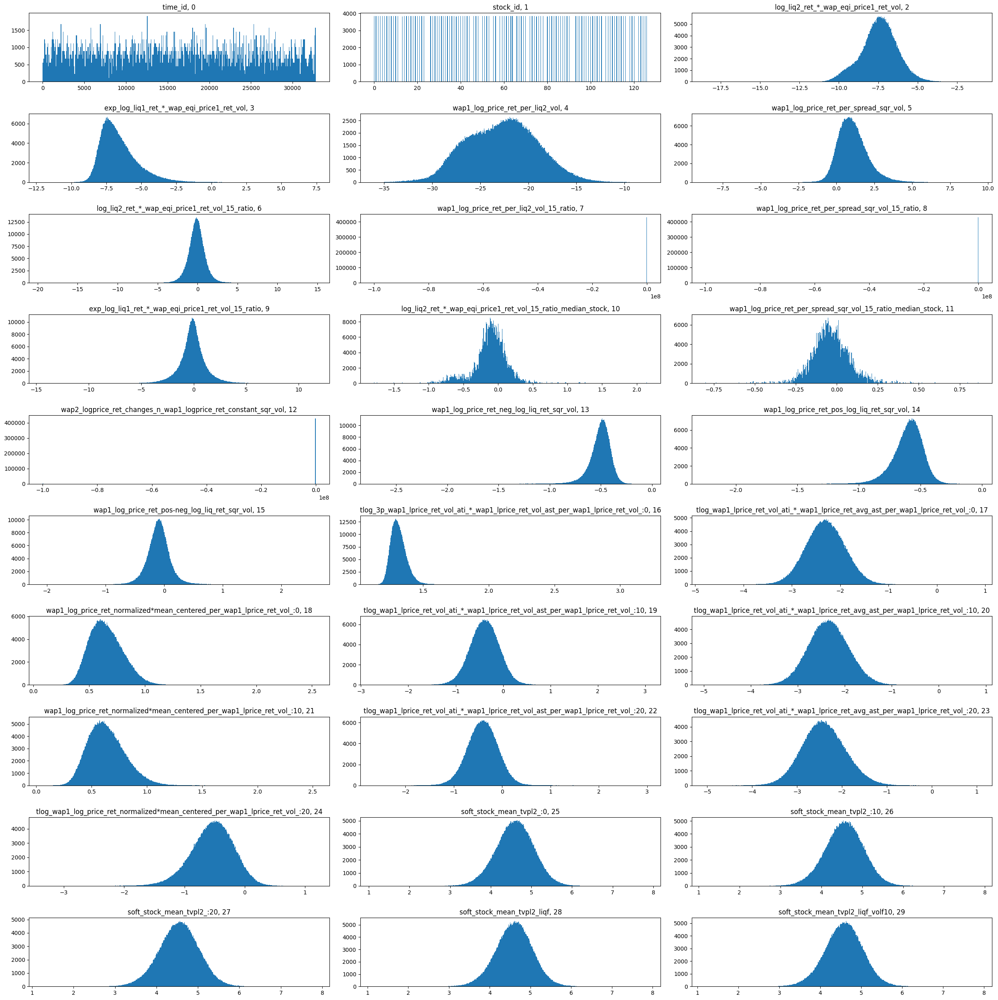

In [ ]:
## VISUALIZE THE DISTRIBUTION OF multiple NUMERICAL FEATURES

rows = 10
cols = 3

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(25, 25),squeeze=False)

ind = 0
for i in range(rows):
    for j in range(cols):
        col = train_feat_df.columns[ind]
        val = train_feat_df.loc[(train_feat_df[col] > -np.inf) & ( train_feat_df[col] < np.inf), col]
        ax[i,j].hist(val,bins=500)
        ax[i,j].set_title(col+', '+str(ind))
        ind+=1
fig.tight_layout()

# ARCHIVE section

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.28223
SCORE: 0.2822336289503427
0.41062058528551904
0.5231826100079096
0.8810874341755669
0.9178408058253344


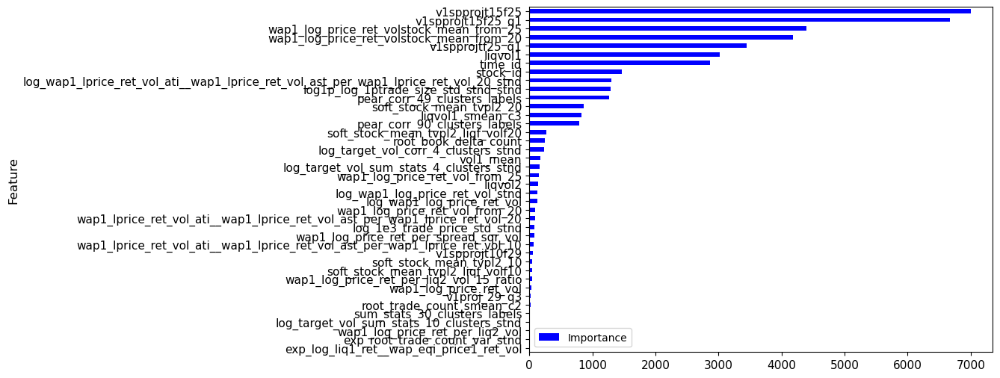

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.28004
SCORE: 0.2800402106763268
0.4031373685160679
0.5090941897038471
0.8799185502522725
0.914613685193788


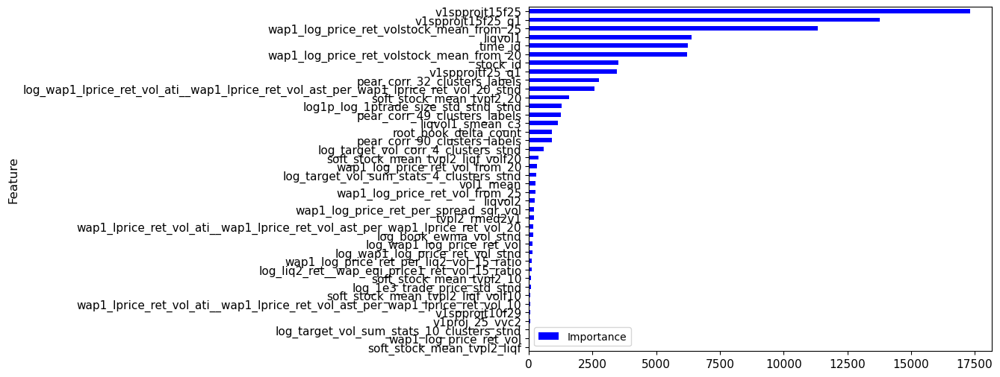

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.28112
SCORE: 0.28112343180020793
0.399639073298165
0.48737775613973855
0.8867182508089185
0.9138687983915227


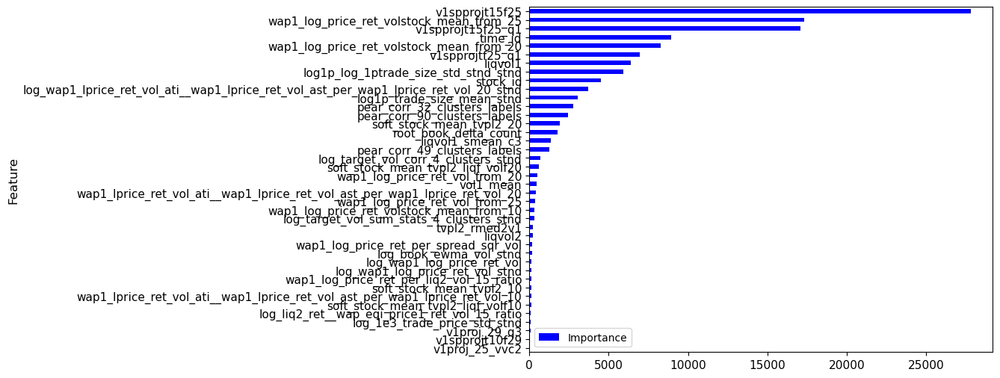

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.28074
SCORE: 0.2807444553690884
0.4320930531218931
0.5492482164874299
0.872416493932891
0.9134374237562458


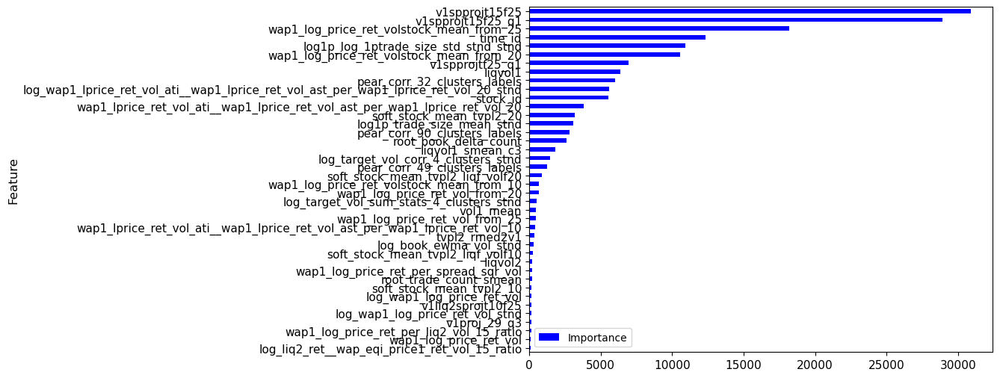

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.27263
SCORE: 0.2726257127715356
0.36590554565803085
0.49906173824663264
0.8793474537750849
0.910441634148748


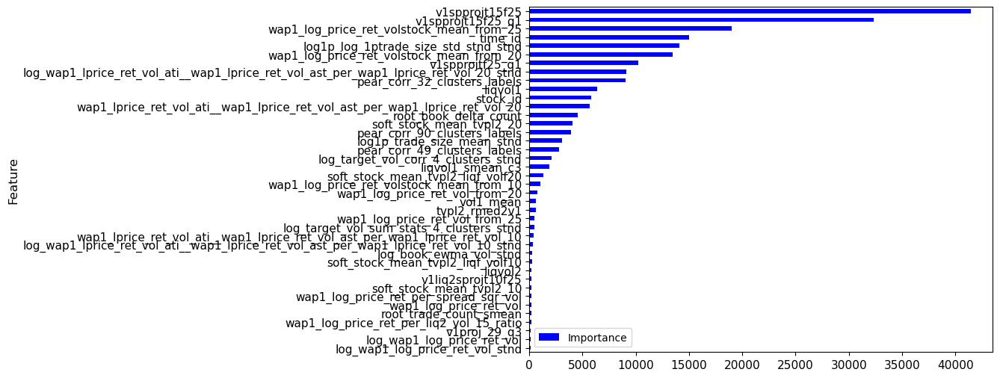

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.28745
SCORE: 0.2874513640856061
0.45812832943767773
0.5454382315871215
0.8845358600976791
0.9167558691083597


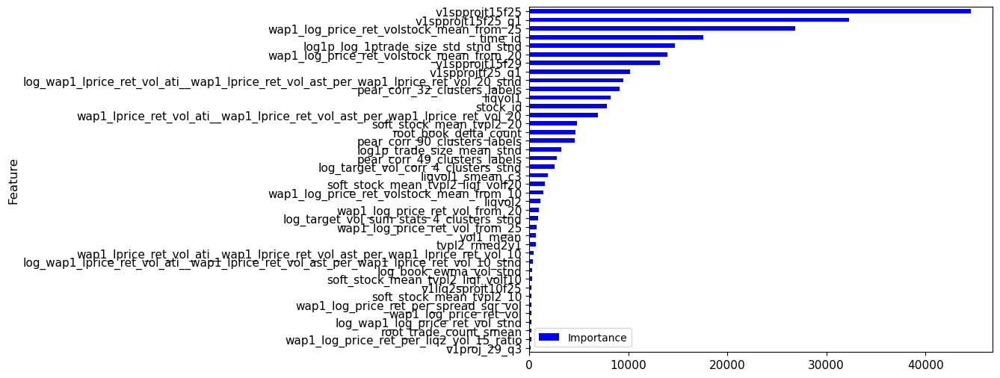

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.2771
SCORE: 0.2771035807475018
0.39994043257883655
0.5104953533771638
0.8728344700642349
0.9155177770677373


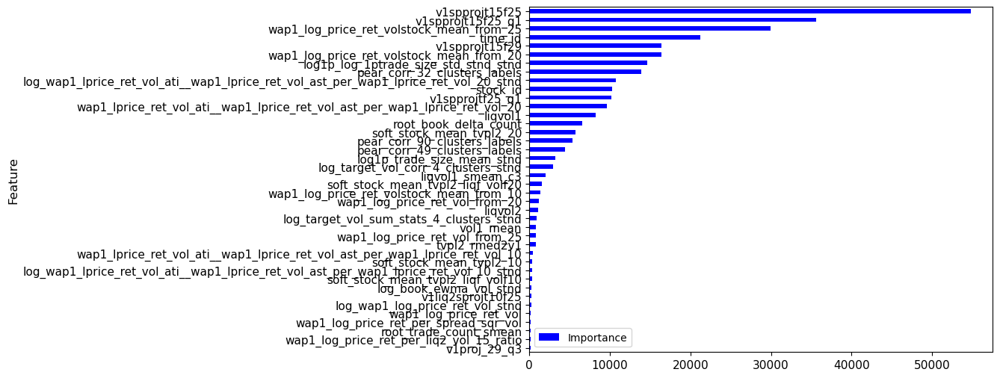

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.28683
SCORE: 0.286833625485947
0.46153665654369375
0.5308441853960921
0.8806154661235588
0.9169693340377545


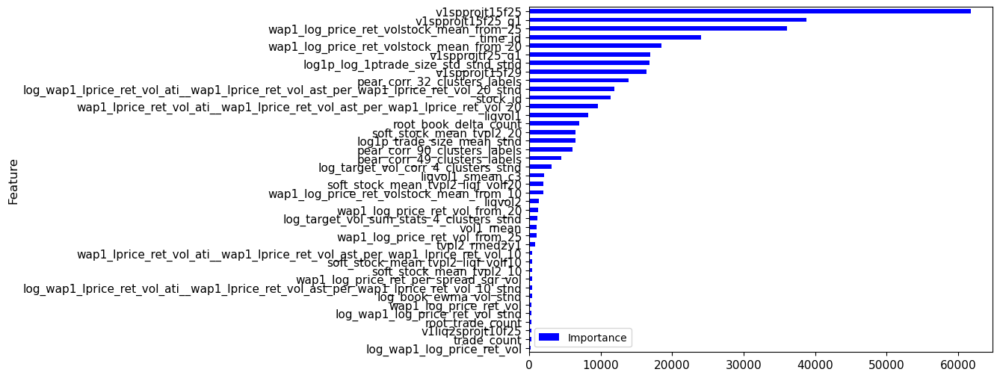

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.27165
SCORE: 0.27165333883692344
0.38544900784797326
0.5128387211775354
0.8896223974758068
0.9165660224557911


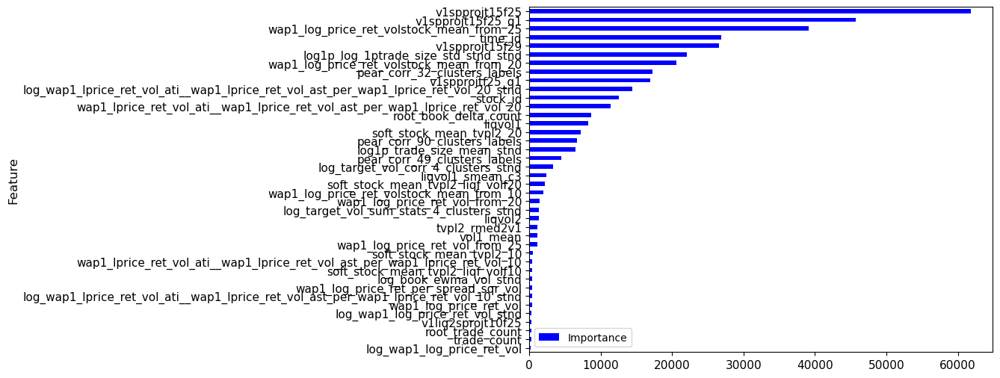

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.28842
SCORE: 0.2884203702013482
0.4405724174486508
0.5214674265140736
0.877979288443948
0.9147116148604978


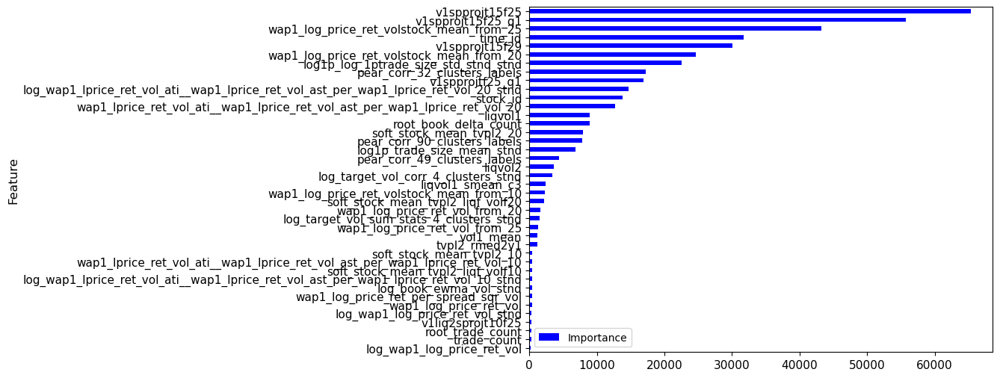

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.27918
SCORE: 0.27918113379613907
0.40921982696910697
0.5152250668433925
0.8742545622116241
0.9158010413819794


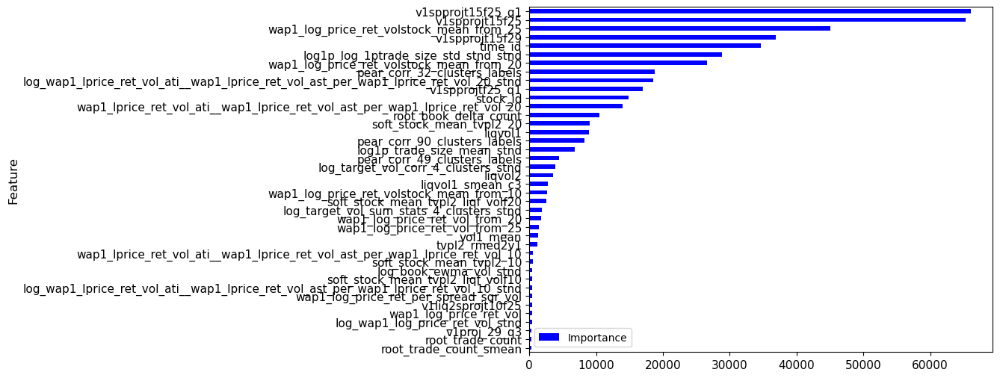

model


/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
/home/optimusprime/miniconda3/envs/optiver_linux/lib/python3.10/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


Training until validation scores don't improve for 500 rounds
Did not meet early stopping. Best iteration is:
[5]	valid_0's RMSPE: 0.28441
SCORE: 0.2844087072308114
0.4217819610385277
0.5254633415002249
0.8777494253215717
0.9125527500147678


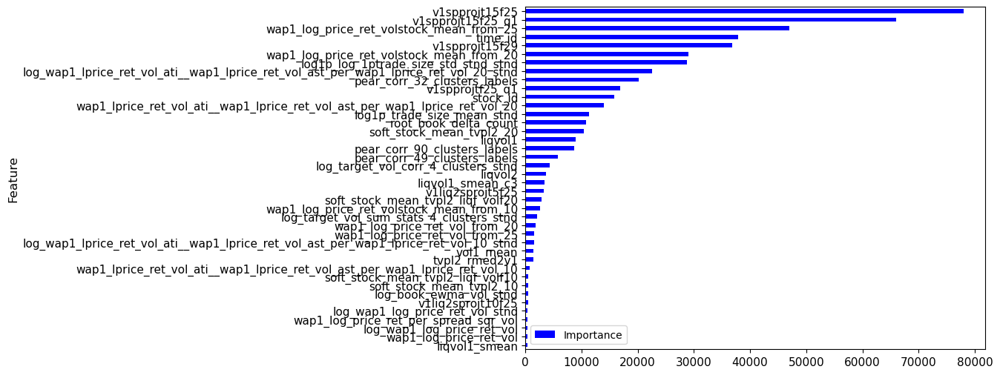

In [ ]:
# ## feature selection using LGBM


# from sklearn.model_selection import RepeatedKFold, cross_val_score

# def nancorr(a, b):
#     v = np.isfinite(a)*np.isfinite(b) > 0
#     return np.corrcoef(a[v], b[v])[0,1]

# def rmspe(y_true, y_pred):
#     return  (np.sqrt(np.mean(np.square((y_true - y_pred) / y_true))))


# def feval_RMSPE(preds, train_data):
#     labels = train_data.get_label()
#     return 'RMSPE', round(rmspe(y_true = labels, y_pred = preds),5), False


# seed1=11


# params_lgbm = {
#         'learning_rate': 0.01,
#         'lambda_l1': 4,
#         'lambda_l2': 7,
#         'num_leaves': 80,
#         'min_sum_hessian_in_leaf': 20,
#         'feature_fraction': 0.8,
#         'feature_fraction_bynode': 0.8,
#         'bagging_fraction': 0.9,
#         'bagging_freq': 42,
#         'min_data_in_leaf': 25,
#         'max_depth': 8,
#         'objective': 'regression',
#         'metric': 'None',

#         'seed': seed1,
#         'feature_fraction_seed': seed1,
#         'bagging_seed': seed1,
#         'drop_seed': seed1,
#         'data_random_seed': seed1,
#         'boosting': 'gbdt',
#         'verbosity': -1,
#         'n_jobs':-1,
#     }



# features_to_consider = df_int64_feat + df_int32_feat + df_float32_feat + df_float64_feat
# features_to_consider = list(np.unique(features_to_consider))


# gc.collect()

# n_folds = 4
# n_rounds = 5

# kf = RepeatedKFold(n_splits=n_folds, n_repeats=3, random_state=1)

# #scores_folds[model_name] = []
# counter = 1

# u = np.unique(train['time_id'])

# models= []

# comb_importances = []

# cluster_importances = {}


# for ttids, vtids in kf.split(u):

#     train_batch = df.loc[df['time_id'].isin(u[ttids])].reset_index(drop=True)
#     val_batch   = df.loc[df['time_id'].isin(u[vtids])].reset_index(drop=True)


#     v1t = np.exp(train_batch['log_wap1_log_price_ret_vol'])
#     v1v = np.exp(  val_batch['log_wap1_log_price_ret_vol'])

#     X_train = train_batch[features_to_consider]
#     y_train = train_batch['target'].values
#     w_train = train_batch['target'].values **-2 * v1t**2

#     X_val = val_batch[features_to_consider]
#     y_val = val_batch['target'].values
#     w_val = val_batch['target'].values **-2 * v1v**2


#     train_data = lgb.Dataset(X_train, label=y_train/v1t, categorical_feature=int64_feat + int32_feat, weight=w_train)
#     val_data   = lgb.Dataset(X_val,   label=  y_val/v1v,   categorical_feature=int64_feat + int32_feat, weight=w_val  )

#     print('model')
#     model = lgb.train(params_lgbm,
#                       train_data,
#                       n_rounds,
#                       valid_sets=val_data,
#                       feval=feval_RMSPE,

#                     #   verbose_eval= 250,
#                     #   early_stopping_rounds=500,
#                       callbacks=[lgb.early_stopping(stopping_rounds=500), lgb.log_evaluation(period=250)])

#     models.append(model)
#     # all_models.append(model)

#     p = model.predict(X_val)*v1v
#     score =  np.mean( ((p-y_val)/y_val)**2 )**0.5

#     # full_score += y_val.shape[0]*score**2


#     print('SCORE:', score)
#     print(nancorr(       p/v1v ,        y_val/v1v ))
#     print(nancorr(np.log(p/v1v), np.log(y_val/v1v)))

#     print(nancorr(p, y_val))
#     print(nancorr(np.log(p), np.log(y_val)))


#     # #test_pred = (model.predict(test_df[features_to_consider][test_df[cluster_key]==cluster] )
#     # #                                                         *np.exp(test_df['vol1'][test_df[cluster_key]==cluster]) )

#     # #test_df['target'][test_df[cluster_key]==cluster] += test_pred/n_folds


#     importances = pd.DataFrame({'Feature': model.feature_name(),
#                                 'Importance': sum( [model.feature_importance(importance_type='gain') for model in models] )})


#     importances2 = importances.nlargest(40,'Importance', keep='first').sort_values(by='Importance', ascending=True)
#     importances2[['Importance', 'Feature']].plot(kind = 'barh', x = 'Feature', figsize = (8,6), color = 'blue', fontsize=11);plt.ylabel('Feature', fontsize=12)
#     plt.show()




In [ ]:
if np.array_equal(train_feat_df['log_wap1_log_price_ret_vol'], train_df['vol1']):
    print('train_feat_df and train_df are same')

train_feat_df and train_df are same


In [ ]:
########## COPY OF feature_transformations above for safety ##########



import feature_transformation as feat_transformer

ft = feat_transformer.FeatureTransformation(train_feat_df)

feat_normalization_mu_std_df = pd.DataFrame(index=["mean", "std", "transform"])

# val, new_col_name, mean, std = ft.log("wap1_log_price_ret_vol")
# train_feat_df.rename(columns={'wap1_log_price_ret_vol':new_col_name}, inplace=True)
# train_feat_df[new_col_name] = val
# feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df.drop(columns=['wap1_log_price_ret_vol'], inplace=True) ## we drop this because we have log_wap1_log_price_ret_vol already

train_feat_df["log_liq2_ret_*_wap_eqi_price1_ret_vol"], mean, std  = ft.standard_scaling("log_liq2_ret_*_wap_eqi_price1_ret_vol")
feat_normalization_mu_std_df["log_liq2_ret_*_wap_eqi_price1_ret_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["exp_log_liq1_ret_*_wap_eqi_price1_ret_vol"], mean, std  = ft.standard_scaling("exp_log_liq1_ret_*_wap_eqi_price1_ret_vol")
feat_normalization_mu_std_df["exp_log_liq1_ret_*_wap_eqi_price1_ret_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_liq2_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_liq2_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_per_liq2_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_spread_sqr_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_spread_sqr_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_per_spread_sqr_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df['log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio'], mean, std = ft.standard_scaling('log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio')
feat_normalization_mu_std_df['log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio'] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_liq2_vol_15_ratio"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_liq2_vol_15_ratio")
feat_normalization_mu_std_df["wap1_log_price_ret_per_liq2_vol_15_ratio"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_spread_sqr_vol_15_ratio"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_spread_sqr_vol_15_ratio")
feat_normalization_mu_std_df["wap1_log_price_ret_per_spread_sqr_vol_15_ratio"] = [mean, std, "standard_scaling_test"]

train_feat_df["exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio"], mean, std = ft.standard_scaling("exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio")
feat_normalization_mu_std_df["exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio"], mean, std = ft.standard_scaling("wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio")
feat_normalization_mu_std_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock"], mean, std = ft.standard_scaling("wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock")
feat_normalization_mu_std_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock"] = [mean, std, "standard_scaling_test"]

train_feat_df["log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock"], mean, std = ft.standard_scaling("log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock")
feat_normalization_mu_std_df["log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock"], mean, std = ft.standard_scaling("wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock")
feat_normalization_mu_std_df["wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol"], mean, std = ft.standard_scaling("wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol")
feat_normalization_mu_std_df["wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_neg_log_liq_ret_sqr_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_neg_log_liq_ret_sqr_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_neg_log_liq_ret_sqr_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_pos_log_liq_ret_sqr_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_pos_log_liq_ret_sqr_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_pos_log_liq_ret_sqr_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_pos-neg_log_liq_ret_sqr_vol"], mean, std = ft.standard_scaling("wap1_log_price_ret_pos-neg_log_liq_ret_sqr_vol")
feat_normalization_mu_std_df["wap1_log_price_ret_pos-neg_log_liq_ret_sqr_vol"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log_3p("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:0")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:0':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_3p_test"]


val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:0")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:0':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:0"] = ft.standard_scaling("wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:0")
feat_normalization_mu_std_df["wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:0"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:10")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:10':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:10")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:10':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:10"] = ft.standard_scaling("wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:10")
feat_normalization_mu_std_df["wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:10"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:20")
train_feat_df.rename(columns={'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:20':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


val, new_col_name, mean, std = ft.log("wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:20")
train_feat_df.rename(columns={'wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:20':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["soft_stock_mean_tvpl2_:0"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_:0")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_:0"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_:10"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_:10")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_:10"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_:20"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_:20")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_:20"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_liqf"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_liqf")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_liqf"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_liqf_volf10"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_liqf_volf10")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_liqf_volf10"] = [mean, std, "standard_scaling_test"]

train_feat_df["soft_stock_mean_tvpl2_liqf_volf20"], mean, std = ft.standard_scaling("soft_stock_mean_tvpl2_liqf_volf20")
feat_normalization_mu_std_df["soft_stock_mean_tvpl2_liqf_volf20"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_15"], mean, std = ft.standard_scaling("v1proj_25_15")
feat_normalization_mu_std_df["v1proj_25_15"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log("lsvol")
train_feat_df.rename(columns={'lsvol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["liqvol1"], mean, std = ft.standard_scaling("liqvol1")
feat_normalization_mu_std_df["liqvol1"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqvol1_smean"], mean, std = ft.standard_scaling("liqvol1_smean")
feat_normalization_mu_std_df["liqvol1_smean"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqvol2"], mean, std = ft.standard_scaling("liqvol2")
feat_normalization_mu_std_df["liqvol2"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqvol1_15_15"], mean, std = ft.standard_scaling("liqvol1_15_15")
feat_normalization_mu_std_df["liqvol1_15_15"] = [mean, std, "standard_scaling_test"]

train_feat_df["trade_count"], mean, std = ft.standard_scaling("trade_count")
feat_normalization_mu_std_df["trade_count"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_trade_count"], mean, std = ft.standard_scaling("root_trade_count")
feat_normalization_mu_std_df["root_trade_count"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_trade_count_smean"], mean, std = ft.standard_scaling("root_trade_count_smean")
feat_normalization_mu_std_df["root_trade_count_smean"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_book_delta_count"], mean, std = ft.standard_scaling("root_book_delta_count")
feat_normalization_mu_std_df["root_book_delta_count"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_trade_count_var"], mean, std = ft.standard_scaling("root_trade_count_var")
feat_normalization_mu_std_df["root_trade_count_var"] = [mean, std, "standard_scaling_test"]

train_feat_df["trade_count_15_15"], mean, std = ft.standard_scaling("trade_count_15_15")
feat_normalization_mu_std_df["trade_count_15_15"] = [mean, std, "standard_scaling_test"]

train_feat_df["root_trade_count_15_15"], mean, std = ft.standard_scaling("root_trade_count_15_15")
feat_normalization_mu_std_df["root_trade_count_15_15"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_15"], mean, std = ft.standard_scaling("v1proj_29_15")
feat_normalization_mu_std_df["v1proj_29_15"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_20"], mean, std = ft.standard_scaling("v1proj_20")
feat_normalization_mu_std_df["v1proj_20"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25"], mean, std = ft.standard_scaling("v1proj_25")
feat_normalization_mu_std_df["v1proj_25"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29"], mean, std = ft.standard_scaling("v1proj_29")
feat_normalization_mu_std_df["v1proj_29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_q1"], mean, std = ft.standard_scaling("v1proj_29_q1")
feat_normalization_mu_std_df["v1proj_29_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_q3"], mean, std = ft.standard_scaling("v1proj_29_q3")
feat_normalization_mu_std_df["v1proj_29_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_q1"], mean, std = ft.standard_scaling("v1proj_25_q1")
feat_normalization_mu_std_df["v1proj_25_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_q3"], mean, std = ft.standard_scaling("v1proj_25_q3")
feat_normalization_mu_std_df["v1proj_25_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_15_q1"], mean, std = ft.standard_scaling("v1proj_29_15_q1")
feat_normalization_mu_std_df["v1proj_29_15_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_15_q3"], mean, std = ft.standard_scaling("v1proj_29_15_q3")
feat_normalization_mu_std_df["v1proj_29_15_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_15_q1"], mean, std = ft.standard_scaling("v1proj_25_15_q1")
feat_normalization_mu_std_df["v1proj_25_15_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_15_q3"], mean, std = ft.standard_scaling("v1proj_25_15_q3")
feat_normalization_mu_std_df["v1proj_25_15_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_15_std"], mean, std = ft.standard_scaling("v1proj_25_15_std")
feat_normalization_mu_std_df["v1proj_25_15_std"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["v1proj_29_15_std"], inplace=True) ## drop this column as it has very low variance

train_feat_df["v1proj_20_std"], mean, std = ft.standard_scaling("v1proj_20_std")
feat_normalization_mu_std_df["v1proj_20_std"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_25_std"], mean, std = ft.standard_scaling("v1proj_25_std")
feat_normalization_mu_std_df["v1proj_25_std"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_std"], mean, std = ft.standard_scaling("v1proj_29_std")
feat_normalization_mu_std_df["v1proj_29_std"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1proj_29_q3q1"], mean, std = ft.standard_scaling("v1proj_29_q3q1")
feat_normalization_mu_std_df["v1proj_29_q3q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_rmed2v1"], mean, std = ft.standard_scaling("tvpl2_rmed2v1")
feat_normalization_mu_std_df["tvpl2_rmed2v1"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_rmed2v1lf25"], mean, std = ft.standard_scaling("tvpl2_rmed2v1lf25")
feat_normalization_mu_std_df["tvpl2_rmed2v1lf25"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_rmed2v1lf29"], mean, std = ft.standard_scaling("tvpl2_rmed2v1lf29")
feat_normalization_mu_std_df["tvpl2_rmed2v1lf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2"], mean, std = ft.standard_scaling("tvpl2")
feat_normalization_mu_std_df["tvpl2"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_liqf10"], mean, std = ft.standard_scaling("tvpl2_liqf10")
feat_normalization_mu_std_df["tvpl2_liqf10"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_liqf20"], mean, std = ft.standard_scaling("tvpl2_liqf20")
feat_normalization_mu_std_df["tvpl2_liqf20"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_liqf29"], mean, std = ft.standard_scaling("tvpl2_liqf29")
feat_normalization_mu_std_df["tvpl2_liqf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_smean_vol"], mean, std = ft.standard_scaling("tvpl2_smean_vol")
feat_normalization_mu_std_df["tvpl2_smean_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_smean_vol_liqf10"], mean, std = ft.standard_scaling("tvpl2_smean_vol_liqf10")
feat_normalization_mu_std_df["tvpl2_smean_vol_liqf10"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_smean_vol_liqf20"], mean, std = ft.standard_scaling("tvpl2_smean_vol_liqf20")
feat_normalization_mu_std_df["tvpl2_smean_vol_liqf20"] = [mean, std, "standard_scaling_test"]

train_feat_df["tvpl2_smean_vol_liqf29"], mean, std = ft.standard_scaling("tvpl2_smean_vol_liqf29")
feat_normalization_mu_std_df["tvpl2_smean_vol_liqf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2projt5"], mean, std = ft.standard_scaling("v1liq2projt5")
feat_normalization_mu_std_df["v1liq2projt5"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2projt10"], mean, std = ft.standard_scaling("v1liq2projt10")
feat_normalization_mu_std_df["v1liq2projt10"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2projt20"], mean, std = ft.standard_scaling("v1liq2projt20")
feat_normalization_mu_std_df["v1liq2projt20"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqt10rf29"], mean, std = ft.standard_scaling("liqt10rf29")
feat_normalization_mu_std_df["liqt10rf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["liqt20rf29"], mean, std = ft.standard_scaling("liqt20rf29")
feat_normalization_mu_std_df["liqt20rf29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2sprojt10f25"], mean, std = ft.standard_scaling("v1liq2sprojt10f25")
feat_normalization_mu_std_df["v1liq2sprojt10f25"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1liq2sprojt5f25"], mean, std = ft.standard_scaling("v1liq2sprojt5f25")
feat_normalization_mu_std_df["v1liq2sprojt5f25"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt10f29"], mean, std = ft.standard_scaling("v1spprojt10f29")
feat_normalization_mu_std_df["v1spprojt10f29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f25"], mean, std = ft.standard_scaling("v1spprojt15f25")
feat_normalization_mu_std_df["v1spprojt15f25"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f29"], mean, std = ft.standard_scaling("v1spprojt15f29")
feat_normalization_mu_std_df["v1spprojt15f29"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f29_q1"], mean, std = ft.standard_scaling("v1spprojt15f29_q1")
feat_normalization_mu_std_df["v1spprojt15f29_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f29_q3"], mean, std = ft.standard_scaling("v1spprojt15f29_q3")
feat_normalization_mu_std_df["v1spprojt15f29_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f25_q1"], mean, std = ft.standard_scaling("v1spprojt15f25_q1")
feat_normalization_mu_std_df["v1spprojt15f25_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojt15f25_q3"], mean, std = ft.standard_scaling("v1spprojt15f25_q3")
feat_normalization_mu_std_df["v1spprojt15f25_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojtf29_q1"], mean, std = ft.standard_scaling("v1spprojtf29_q1")
feat_normalization_mu_std_df["v1spprojtf29_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojtf29_q3"], mean, std = ft.standard_scaling("v1spprojtf29_q3")
feat_normalization_mu_std_df["v1spprojtf29_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojtf25_q1"], mean, std = ft.standard_scaling("v1spprojtf25_q1")
feat_normalization_mu_std_df["v1spprojtf25_q1"] = [mean, std, "standard_scaling_test"]

train_feat_df["v1spprojtf25_q3"], mean, std = ft.standard_scaling("v1spprojtf25_q3")
feat_normalization_mu_std_df["v1spprojtf25_q3"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["wap1_log_price_ret_vol_from_0"], inplace=True) ## drop this column as it has all 0 values

train_feat_df["wap1_log_price_ret_volstock_mean_from_0"] = ft.standard_scaling("wap1_log_price_ret_volstock_mean_from_0")
feat_normalization_mu_std_df["wap1_log_price_ret_volstock_mean_from_0"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.exp("wap1_log_price_ret_vol_from_10")
train_feat_df.rename(columns={'wap1_log_price_ret_vol_from_10':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "exp_test"]

train_feat_df["wap1_log_price_ret_volstock_mean_from_10"] = ft.standard_scaling("wap1_log_price_ret_volstock_mean_from_10")
feat_normalization_mu_std_df["wap1_log_price_ret_volstock_mean_from_10"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.exp("wap1_log_price_ret_vol_from_20")
train_feat_df.rename(columns={'wap1_log_price_ret_vol_from_20':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "exp_test"]


train_feat_df["wap1_log_price_ret_volstock_mean_from_20"], mean, std = ft.standard_scaling("wap1_log_price_ret_volstock_mean_from_20")
feat_normalization_mu_std_df["wap1_log_price_ret_volstock_mean_from_20"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_vol_from_25"], mean, std = ft.standard_scaling("wap1_log_price_ret_vol_from_25")
feat_normalization_mu_std_df["wap1_log_price_ret_vol_from_25"] = [mean, std, "standard_scaling_test"]

train_feat_df["wap1_log_price_ret_volstock_mean_from_25"], mean, std = ft.standard_scaling("wap1_log_price_ret_volstock_mean_from_25")
feat_normalization_mu_std_df["wap1_log_price_ret_volstock_mean_from_25"] = [mean, std, "standard_scaling_test"]

train_feat_df["vol1_mean"], mean, std = ft.standard_scaling("vol1_mean")
feat_normalization_mu_std_df["vol1_mean"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["mean_half_delta"], inplace=True)# drop this column as it has very few unique values

train_feat_df.drop(columns=["mean_half_delta_lsprd"], inplace=True)# drop this column as it has very few unique values

train_feat_df["log_wap1_log_price_ret_vol"], mean, std = ft.standard_scaling("log_wap1_log_price_ret_vol")
feat_normalization_mu_std_df["log_wap1_log_price_ret_vol"] = [mean, std, "standard_scaling_test"]

train_feat_df["bid_lvl2_min_lvl1_size_feat"], mean, std = ft.standard_scaling("bid_lvl2_min_lvl1_size_feat")
feat_normalization_mu_std_df["bid_lvl2_min_lvl1_size_feat"] = [mean, std, "standard_scaling_test"]

train_feat_df["ask_lvl2_min_lvl1_size_feat"], mean, std = ft.standard_scaling("ask_lvl2_min_lvl1_size_feat")
feat_normalization_mu_std_df["ask_lvl2_min_lvl1_size_feat"] = [mean, std, "standard_scaling_test"]

train_feat_df["lvl2_minus_lvl1_bid_n_ask_size_feat"], mean, std = ft.standard_scaling("lvl2_minus_lvl1_bid_n_ask_size_feat")
feat_normalization_mu_std_df["lvl2_minus_lvl1_bid_n_ask_size_feat"] = [mean, std, "standard_scaling_test"]

train_feat_df["sum_size"], mean, std = ft.standard_scaling("sum_size")
feat_normalization_mu_std_df["sum_size"] = [mean, std, "standard_scaling_test"]

train_feat_df["sum_order_count"], mean, std = ft.standard_scaling("sum_order_count")
feat_normalization_mu_std_df["sum_order_count"] = [mean, std, "standard_scaling_test"]

train_feat_df["sum_size_per_order_count"], mean, std = ft.standard_scaling("sum_size_per_order_count")
feat_normalization_mu_std_df["sum_size_per_order_count"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.log_eps5e3("trade_price_n_wap1_dev")
train_feat_df.rename(columns={'trade_price_n_wap1_dev':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_eps5e3_test"]

val, new_col_name, mean, std = ft.log_eps5e3("trade_price_n_wap_eqi_price0_dev")
train_feat_df.rename(columns={'trade_price_n_wap_eqi_price0_dev':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_eps5e3_test"]

val, new_col_name, mean, std = ft.log_("first_10_min_vol")
train_feat_df.rename(columns={'first_10_min_vol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


val, new_col_name, mean, std = ft.log_eps1e4("trade_price_std")
train_feat_df.rename(columns={'trade_price_std':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_eps1e4_test"]

val, new_col_name, mean, std = ft.log_eps1e4("trade_price_real_vol")
train_feat_df.rename(columns={'trade_price_real_vol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_eps1e4_test"]

val, new_col_name, mean, std = ft.log_1p("trade_size_std")
train_feat_df.rename(columns={'trade_size_std':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.log_1p("trade_size_mean")
train_feat_df.rename(columns={'trade_size_mean':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.log_1p("trade_order_count_std")
train_feat_df.rename(columns={'trade_order_count_std':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.log_1p("trade_order_count_mean")
train_feat_df.rename(columns={'trade_order_count_mean':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]


val, new_col_name, mean, std = ft.log_log1p("target_vol_sum_stats_4_clusters")
train_feat_df.rename(columns={'target_vol_sum_stats_4_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_sum_stats_10_clusters")
train_feat_df.rename(columns={'target_vol_sum_stats_10_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_sum_stats_16_clusters")
train_feat_df.rename(columns={'target_vol_sum_stats_16_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]


val, new_col_name, mean, std = ft.log_log1p("target_vol_sum_stats_30_clusters")
train_feat_df.rename(columns={'target_vol_sum_stats_30_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]


val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_2_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_2_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_4_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_4_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_14_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_14_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_20_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_20_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_32_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_32_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log_log1p("target_vol_robust_sum_stats_60_clusters")
train_feat_df.rename(columns={'target_vol_robust_sum_stats_60_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_test"]

val, new_col_name, mean, std = ft.log("target_vol_pcorr_3_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_3_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("target_vol_pcorr_49_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_49_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("target_vol_pcorr_90_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_90_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log("target_vol_pcorr_10_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_10_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


val, new_col_name, mean, std = ft.log("target_vol_pcorr_26_clusters")
train_feat_df.rename(columns={'target_vol_pcorr_26_clusters':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df["min_bid_price1"], mean, std = ft.standard_scaling("min_bid_price1")
feat_normalization_mu_std_df["min_bid_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_bid_price1"], mean, std = ft.standard_scaling("max_bid_price1")
feat_normalization_mu_std_df["max_bid_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df["min_ask_price1"], mean, std = ft.standard_scaling("min_ask_price1")
feat_normalization_mu_std_df["min_ask_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_ask_price1"], mean, std = ft.standard_scaling("max_ask_price1")
feat_normalization_mu_std_df["max_ask_price1"] = [mean, std, "standard_scaling_test"]


train_feat_df.drop(columns=["min_bid_size1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_bid_size1")
train_feat_df.rename(columns={'max_bid_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df.drop(columns=["min_ask_size1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_ask_size1")
train_feat_df.rename(columns={'max_ask_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


val, new_col_name, mean, std = ft.log_log1p_eps1e4("range_ask_price1")
train_feat_df.rename(columns={'range_ask_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_eps1e4_test"]

val, new_col_name, mean, std = ft.log_log1p_eps1e4("range_bid_price1")
train_feat_df.rename(columns={'range_bid_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_eps1e4_test"]

val, new_col_name, mean, std = ft.log_1p("range_ask_size1")
train_feat_df.rename(columns={'range_ask_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]



val, new_col_name, mean, std = ft.log_1p("range_bid_size1")
train_feat_df.rename(columns={'range_bid_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]


val, new_col_name, mean, std = ft.log_log1p_eps1e4("sad_ask_price1")
train_feat_df.rename(columns={'sad_ask_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_log1p_eps1e4_test"]

val, new_col_name, mean, std = ft.log_1p("sad_ask_size1")
train_feat_df.rename(columns={'sad_ask_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log1p_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_bid_price1")
train_feat_df.rename(columns={'sad_bid_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_bid_size1")
train_feat_df.rename(columns={'sad_bid_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

train_feat_df["bs_bp_corr1"], mean, std = ft.standard_scaling("bs_bp_corr1")
feat_normalization_mu_std_df["bs_bp_corr1"] = [mean, std, "standard_scaling_test"]

train_feat_df["bs_as_corr1"], mean, std = ft.standard_scaling("bs_as_corr1")
feat_normalization_mu_std_df["bs_as_corr1"] = [mean, std, "standard_scaling_test"]

train_feat_df["bs_ap_corr1"], mean, std = ft.standard_scaling("bs_ap_corr1")
feat_normalization_mu_std_df["bs_ap_corr1"] = [mean, std, "standard_scaling_test"]

train_feat_df["bp_as_corr1"], mean, std = ft.standard_scaling("bp_as_corr1")
feat_normalization_mu_std_df["bp_as_corr1"] = [mean, std, "standard_scaling_test"]

val, new_col_name, mean, std = ft.exp_exp("bp_ap_corr1")
train_feat_df.rename(columns={'bp_ap_corr1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "exp_exp_test"]

train_feat_df["as_ap_corr1"], mean, std = ft.standard_scaling("as_ap_corr1")
feat_normalization_mu_std_df["as_ap_corr1"] = [mean, std, "standard_scaling_test"]

train_feat_df["min_price1"], mean, std = ft.standard_scaling("min_price1")
feat_normalization_mu_std_df["min_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_price1"], mean, std = ft.standard_scaling("max_price1")
feat_normalization_mu_std_df["max_price1"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["min_size1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_size1")
train_feat_df.rename(columns={'max_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]


train_feat_df.drop(columns=["min_order_count1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

train_feat_df["max_order_count1"], mean, std = ft.standard_scaling("max_order_count1")

val, new_col_name, mean, std = ft.log_lin100_1("range_price1")
train_feat_df.rename(columns={'range_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]


val, new_col_name, mean, std = ft.log_1p("range_size1")
train_feat_df.rename(columns={'range_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]


train_feat_df.drop(columns=["range_order_count1"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log_lin100_1("sad_price1")
train_feat_df.rename(columns={'sad_price1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_size1")
train_feat_df.rename(columns={'sad_size1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]


val, new_col_name, mean, std = ft.log_1p("sad_order_count1")
train_feat_df.rename(columns={'sad_order_count1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

val, new_col_name, mean, std = ft.exp("size_order_count_corr1")
train_feat_df.rename(columns={'size_order_count_corr1':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "exp_test"]

val, new_col_name, mean, std = ft.log("book_ewma_vol")
train_feat_df.rename(columns={'book_ewma_vol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log_1p("trade_ewma_vol")
train_feat_df.rename(columns={'trade_ewma_vol':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_1p_test"]

train_feat_df["min_bid_price2"], mean, std = ft.standard_scaling("min_bid_price2")
feat_normalization_mu_std_df["min_bid_price2"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_bid_price2"], mean, std = ft.standard_scaling("max_bid_price2")
feat_normalization_mu_std_df["max_bid_price2"] = [mean, std, "standard_scaling_test"]

train_feat_df["min_ask_price2"], mean, std = ft.standard_scaling("min_ask_price2")
feat_normalization_mu_std_df["min_ask_price2"] = [mean, std, "standard_scaling_test"]

train_feat_df["max_ask_price2"], mean, std = ft.standard_scaling("max_ask_price2")
feat_normalization_mu_std_df["max_ask_price2"] = [mean, std, "standard_scaling_test"]

train_feat_df.drop(columns=["min_bid_size2"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_bid_size2")
train_feat_df.rename(columns={'max_bid_size2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

train_feat_df.drop(columns=["min_ask_size2"], inplace=True) ## drop this column as it mostly 0 values and highly kurtotic

val, new_col_name, mean, std = ft.log("max_ask_size2")
train_feat_df.rename(columns={'max_ask_size2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log_lin100_1("range_ask_price2")
train_feat_df.rename(columns={'range_ask_price2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("range_bid_price2")
train_feat_df.rename(columns={'range_bid_price2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log("range_ask_size2")
train_feat_df.rename(columns={'range_ask_size2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_ask_price2")
train_feat_df.rename(columns={'sad_ask_price2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_ask_size2")
train_feat_df.rename(columns={'sad_ask_size2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

val, new_col_name, mean, std = ft.log_lin100_1("sad_bid_price2")
train_feat_df.rename(columns={'sad_bid_price2':new_col_name}, inplace=True)
train_feat_df[new_col_name] = val
feat_normalization_mu_std_df[new_col_name] = [mean, std, "log_lin100_1_test"]

train_feat_df["bs_bp_corr2"], mean, std = ft.standard_scaling("bs_bp_corr2")
feat_normalization_mu_std_df["bs_bp_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["bs_as_corr2"], mean, std = ft.standard_scaling("bs_as_corr2")
feat_normalization_mu_std_df["bs_as_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["bs_ap_corr2"], mean, std = ft.standard_scaling("bs_ap_corr2")
feat_normalization_mu_std_df["bs_ap_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["bp_as_corr2"], mean, std = ft.standard_scaling("bp_as_corr2")
feat_normalization_mu_std_df["bp_as_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["bp_ap_corr2"], mean, std = ft.standard_scaling("bp_ap_corr2")
feat_normalization_mu_std_df["bp_ap_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["as_ap_corr2"], mean, std = ft.standard_scaling("as_ap_corr2")
feat_normalization_mu_std_df["as_ap_corr2"] = [mean, std, "standard_scaling_test"]

train_feat_df["sum_stats_4_clusters_labels"] = train_feat_df["sum_stats_4_clusters_labels"].astype("category")

train_feat_df["sum_stats_10_clusters_labels"] = train_feat_df["sum_stats_10_clusters_labels"].astype("category")

train_feat_df["sum_stats_16_clusters_labels"] = train_feat_df["sum_stats_16_clusters_labels"].astype("category")

train_feat_df["sum_stats_30_clusters_labels"] = train_feat_df["sum_stats_30_clusters_labels"].astype("category")

train_feat_df["pear_corr_3_clusters_labels"] = train_feat_df["pear_corr_3_clusters_labels"].astype("category")

train_feat_df["pear_corr_49_clusters_labels"] = train_feat_df["pear_corr_49_clusters_labels"].astype("category")

train_feat_df["pear_corr_90_clusters_labels"] = train_feat_df["pear_corr_90_clusters_labels"].astype("category")

train_feat_df["pear_corr_10_clusters_labels"] = train_feat_df["pear_corr_10_clusters_labels"].astype("category")

train_feat_df["pear_corr_26_clusters_labels"] = train_feat_df["pear_corr_26_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_2_clusters_labels"] = train_feat_df["robust_sum_stats_2_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_4_clusters_labels"] = train_feat_df["robust_sum_stats_4_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_14_clusters_labels"] = train_feat_df["robust_sum_stats_14_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_20_clusters_labels"] = train_feat_df["robust_sum_stats_20_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_32_clusters_labels"] = train_feat_df["robust_sum_stats_32_clusters_labels"].astype("category")

train_feat_df["robust_sum_stats_60_clusters_labels"] = train_feat_df["robust_sum_stats_60_clusters_labels"].astype("category")





KeyError: 'wap1_log_price_ret_vol'

In [ ]:
# ### Identify the numerical, categorical features and TARGET

# # dtype_columns = df.select_dtypes(include='float64').columns #dtype('int32'), dtype('int64'), dtype('float32'), dtype('int32'),
# #                                                                #dtype('int64'), dtype('float64',
# # [print("'"+c+"'"+",") for c in dtype_columns]


# ########### categorical features

# ## int32 features

# int32_feat = ['sum_stats_4_clusters_labels',
# 'sum_stats_10_clusters_labels',
# 'sum_stats_16_clusters_labels',
# 'sum_stats_30_clusters_labels',
# 'pear_corr_32_clusters_labels',
# 'pear_corr_4_clusters_labels',
# 'pear_corr_49_clusters_labels',
# 'pear_corr_90_clusters_labels',]

# ## int64 features

# int64_feat = ['stock_id','time_id', 'wap1_log_price_ret_cluster2_labels', 'wap1_log_price_ret_cluster3_labels',]



# ########### numerical features

# ## float32 features

# float32_feat = ['min_bid_price1',
# 'max_bid_price1',
# 'min_ask_price1',
# 'max_ask_price1',
# 'log_+1e-2_sad_ask_price1_stnd',
# 'log_+1e-2_sad_bid_price1_stnd',
# 'min_price1',
# 'max_price1',
# 'log_+1e-3_sad_price1_stnd',
# 'log1p_sad_order_count1_stnd',
# 'min_bid_price2',
# 'max_bid_price2',
# 'min_ask_price2',
# 'max_ask_price2',
# 'log_+1e-3_sad_ask_price2_stnd',
# 'log_+1e-3_sad_bid_price2_stnd',]

# ## float64 features


# float64_feat = ['wap1_log_price_ret_vol',
# 'log_liq2_ret_*_wap_eqi_price1_ret_vol',
# 'exp_log_liq1_ret_*_wap_eqi_price1_ret_vol',
# 'wap1_log_price_ret_per_liq2_vol',
# 'wap1_log_price_ret_per_spread_sqr_vol',
# 'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio',
# 'wap1_log_price_ret_per_liq2_vol_15_ratio',
# 'wap1_log_price_ret_per_spread_sqr_vol_15_ratio',
# 'exp_log_liq1_ret_*_wap_eqi_price1_ret_vol_15_ratio',
# 'wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio',
# 'wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock',
# 'log_liq2_ret_*_wap_eqi_price1_ret_vol_15_ratio_median_stock',
# 'wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock',
# 'wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol',
# 'wap1_log_price_ret_neg_log_liq_ret_sqr_vol',
# 'wap1_log_price_ret_pos_log_liq_ret_sqr_vol',
# 'wap1_log_price_ret_pos-neg_log_liq_ret_sqr_vol',
# 'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:0',
# 'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:0',
# 'wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:0',
# 'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:10',
# 'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:10',
# 'wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:10',
# 'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20',
# 'wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:20',
# 'wap1_log_price_ret_normalized*mean_centered_per_wap1_lprice_ret_vol_:20',
# 'soft_stock_mean_tvpl2_:0',
# 'soft_stock_mean_tvpl2_:10',
# 'soft_stock_mean_tvpl2_:20',
# 'soft_stock_mean_tvpl2_liqf',
# 'soft_stock_mean_tvpl2_liqf_volf10',
# 'soft_stock_mean_tvpl2_liqf_volf20',
# 'v1proj_25_15',
# 'v1proj_25_15_lr1_high_corr_stocks',
# 'v1proj_25_15_vol1_high_corr_stocks',
# 'v1proj_25_lr1_high_corr_stocks',
# 'v1proj_25_vol1_high_corr_stocks',
# 'lsvol',
# 'liqvol1',
# 'liqvol1_smean',
# 'liqvol1_smean_c3',
# 'liqvol2',
# 'liqvol1_15_15',
# 'trade_count',
# 'root_trade_count',
# 'root_trade_count_smean',
# 'root_book_delta_count',
# 'root_trade_count_smean_c1',
# 'root_trade_count_smean_c2',
# 'root_trade_count_smean_c3',
# 'root_trade_count_var',
# 'trade_count_15_15',
# 'root_trade_count_15_15',
# 'v1proj_29_15',
# 'v1proj_20',
# 'v1proj_25',
# 'v1proj_29',
# 'v1proj_29_q1',
# 'v1proj_29_q3',
# 'v1proj_25_q1',
# 'v1proj_25_q3',
# 'v1proj_29_15_q1',
# 'v1proj_29_15_q3',
# 'v1proj_25_15_q1',
# 'v1proj_25_15_q3',
# 'v1proj_25_15_std',
# 'v1proj_20_std',
# 'v1proj_25_std',
# 'v1proj_29_std',
# 'v1proj_29_q3q1',
# 'v1proj_25_c1',
# 'v1proj_25_c2',
# 'v1proj_25_c3',
# 'v1proj_25_c4',
# 'v1proj_25_c5',
# 'soft_stock_mean_tvpl2_c1',
# 'soft_stock_mean_tvpl2_c2',
# 'soft_stock_mean_tvpl2_c3',
# 'soft_stock_mean_tvpl2_10_c1',
# 'soft_stock_mean_tvpl2_10_c2',
# 'soft_stock_mean_tvpl2_10_c3',
# 'soft_stock_mean_tvpl2_20_c1',
# 'soft_stock_mean_tvpl2_20_c2',
# 'soft_stock_mean_tvpl2_20_c3',
# 'v1proj_25_c1_std',
# 'v1proj_25_c2_std',
# 'v1proj_25_c3_std',
# 'v1proj_25_c4_std',
# 'v1proj_25_c5_std',
# 'v1proj_25_vc1',
# 'v1proj_25_vc2',
# 'v1proj_25_vc3',
# 'v1proj_25_vc4',
# 'v1proj_25_vvc1',
# 'v1proj_25_vvc2',
# 'v1proj_25_vvc3',
# 'tvpl2_rmed2v1',
# 'tvpl2_rmed2v1lf25',
# 'tvpl2_rmed2v1lf29',
# 'tvpl2',
# 'tvpl2_liqf10',
# 'tvpl2_liqf20',
# 'tvpl2_liqf29',
# 'tvpl2_smean_vol',
# 'tvpl2_smean_vol_liqf10',
# 'tvpl2_smean_vol_liqf20',
# 'tvpl2_smean_vol_liqf29',
# 'v1liq2projt5',
# 'v1liq2projt10',
# 'v1liq2projt20',
# 'liqt10rf29',
# 'liqt20rf29',
# 'v1liq2sprojt10f25',
# 'v1liq2sprojt5f25',
# 'v1spprojt10f29',
# 'v1spprojt15f25',
# 'v1spprojt15f29',
# 'v1spprojt15f29_q1',
# 'v1spprojt15f29_q3',
# 'v1spprojt15f25_q1',
# 'v1spprojt15f25_q3',
# 'v1spprojtf29_q1',
# 'v1spprojtf29_q3',
# 'v1spprojtf25_q1',
# 'v1spprojtf25_q3',
# 'wap1_log_price_ret_volstock_mean_from_0',
# 'wap1_log_price_ret_vol_from_10',
# 'wap1_log_price_ret_volstock_mean_from_10',
# 'wap1_log_price_ret_vol_from_20',
# 'wap1_log_price_ret_volstock_mean_from_20',
# 'wap1_log_price_ret_vol_from_25',
# 'wap1_log_price_ret_volstock_mean_from_25',
# 'vol1_mean',
# 'log_wap1_log_price_ret_vol',
# 'log_first_10_min_vol_stnd',
# 'log_+1e-3_trade_price_std_stnd',
# 'log_+1e-3_trade_price_real_vol_stnd',
# 'log1p_log_1ptrade_size_std_stnd_stnd',
# 'log1p_trade_size_mean_stnd',
# 'log1p_trade_order_count_std_stnd',
# 'log1p_trade_order_count_mean_stnd',
# 'log_target_vol_sum_stats_4_clusters_stnd',
# 'log_target_vol_sum_stats_10_clusters_stnd',
# 'log_target_vol_sum_stats_16_clusters_stnd',
# 'log_target_vol_sum_stats_30_clusters_stnd',
# 'log_target_vol_corr_32_clusters_stnd',
# 'log_target_vol_corr_4_clusters_stnd',
# 'log_target_vol_corr_49_clusters_stnd',
# 'log_target_vol_corr_90_clusters_stnd',
# 'log_min_bid_size1_stnd',
# 'log_max_bid_size1_stnd',
# 'log_min_ask_size1_stnd',
# 'log_log_log_max_ask_size1_stnd_stnd_stnd',
# 'log_+1e-3_range_ask_price1_stnd',
# 'log_+1e-3_range_bid_price1_stnd',
# 'log1p_range_ask_size1_stnd',
# 'log1p_range_bid_size1_stnd',
# 'log1p_sad_ask_size1_stnd',
# 'log1p_sad_bid_size1_stnd',
# 'exp_bs_bp_corr1_stnd',
# 'exp_bs_as_corr1_stnd',
# 'bs_ap_corr1',
# 'bp_as_corr1',
# 'arctanh_min_1e-3_bp_ap_corr1_stnd',
# 'as_ap_corr1',
# 'log_min_size1_stnd',
# 'log_max_size1_stnd',
# 'log_max_order_count1_stnd',
# 'log_+1e-3_range_price1_stnd',
# 'log1p_range_size1_stnd',
# 'log1p_range_order_count1_stnd',
# 'log1p_sad_size1_stnd',
# 'size_order_count_corr1',
# 'log_book_ewma_vol_stnd',
# 'log1p_trade_ewma_vol_stnd',
# 'log_max_bid_size2_stnd',
# 'log_max_ask_size2_stnd',
# 'log_+1e-3_range_ask_price2_stnd',
# 'log_+1e-3_range_bid_price2_stnd',
# 'log_range_ask_size2_stnd',
# 'log_sad_ask_size2_stnd',
# 'bs_bp_corr2',
# 'bs_as_corr2',
# 'bs_ap_corr2',
# 'bp_as_corr2',
# 'arctanh_min_1e-3_bp_ap_corr2_stnd',
# 'as_ap_corr2',
# 'log_wap1_log_price_ret_vol_stnd',
# 'log_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:0_stnd',
# 'log_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:0_stnd',
# 'log_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:10_stnd',
# 'log_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:10_stnd',
# 'log_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_:20_stnd',
# 'log_wap1_lprice_ret_vol_ati_*_wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_:20_stnd',
# 'arctanh_root_book_delta_count_stnd',
# 'exp_root_trade_count_var_stnd',
# 'v1proj_29_15_std',]

# ## TARGET

# target_feat = ['target','log_target','log_target_standardized']




In [ ]:
# ######## Change name to exclude non-alphanumeric characters

# import re
# df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))


# # dtype_columns = df.select_dtypes(include='int64').columns #dtype('int32'), dtype('int64'), dtype('float32'), dtype('int32'),
# #                                                                #dtype('int64'), dtype('float64',
# # [print("'"+c+"'"+",") for c in dtype_columns]


# int64_feat_labels = ['stock_id',
# 'time_id',
# 'wap1_log_price_ret_cluster2_labels',
# 'wap1_log_price_ret_cluster3_labels',]

# int32_feat_labels = ['sum_stats_4_clusters_labels',
# 'sum_stats_10_clusters_labels',
# 'sum_stats_16_clusters_labels',
# 'sum_stats_30_clusters_labels',
# 'pear_corr_32_clusters_labels',
# 'pear_corr_4_clusters_labels',
# 'pear_corr_49_clusters_labels',
# 'pear_corr_90_clusters_labels',]



# float32_feat_labels = ['min_bid_price1',
# 'max_bid_price1',
# 'min_ask_price1',
# 'max_ask_price1',
# 'log_1e2_sad_ask_price1_stnd',
# 'log_1e2_sad_bid_price1_stnd',
# 'min_price1',
# 'max_price1',
# 'log_1e3_sad_price1_stnd',
# 'log1p_sad_order_count1_stnd',
# 'min_bid_price2',
# 'max_bid_price2',
# 'min_ask_price2',
# 'max_ask_price2',
# 'log_1e3_sad_ask_price2_stnd',
# 'log_1e3_sad_bid_price2_stnd',]




# float64_feat_labels = ['wap1_log_price_ret_vol',
# 'log_liq2_ret__wap_eqi_price1_ret_vol',
# 'exp_log_liq1_ret__wap_eqi_price1_ret_vol',
# 'wap1_log_price_ret_per_liq2_vol',
# 'wap1_log_price_ret_per_spread_sqr_vol',
# 'log_liq2_ret__wap_eqi_price1_ret_vol_15_ratio',
# 'wap1_log_price_ret_per_liq2_vol_15_ratio',
# 'wap1_log_price_ret_per_spread_sqr_vol_15_ratio',
# 'exp_log_liq1_ret__wap_eqi_price1_ret_vol_15_ratio',
# 'wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio',
# 'wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol_15_ratio_median_stock',
# 'log_liq2_ret__wap_eqi_price1_ret_vol_15_ratio_median_stock',
# 'wap1_log_price_ret_per_spread_sqr_vol_15_ratio_median_stock',
# 'wap2_logprice_ret_changes_n_wap1_logprice_ret_constant_sqr_vol',
# 'wap1_log_price_ret_neg_log_liq_ret_sqr_vol',
# 'wap1_log_price_ret_pos_log_liq_ret_sqr_vol',
# 'wap1_log_price_ret_posneg_log_liq_ret_sqr_vol',
# 'wap1_lprice_ret_vol_ati__wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_0',
# 'wap1_lprice_ret_vol_ati__wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_0',
# 'wap1_log_price_ret_normalizedmean_centered_per_wap1_lprice_ret_vol_0',
# 'wap1_lprice_ret_vol_ati__wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_10',
# 'wap1_lprice_ret_vol_ati__wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_10',
# 'wap1_log_price_ret_normalizedmean_centered_per_wap1_lprice_ret_vol_10',
# 'wap1_lprice_ret_vol_ati__wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_20',
# 'wap1_lprice_ret_vol_ati__wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_20',
# 'wap1_log_price_ret_normalizedmean_centered_per_wap1_lprice_ret_vol_20',
# 'soft_stock_mean_tvpl2_0',
# 'soft_stock_mean_tvpl2_10',
# 'soft_stock_mean_tvpl2_20',
# 'soft_stock_mean_tvpl2_liqf',
# 'soft_stock_mean_tvpl2_liqf_volf10',
# 'soft_stock_mean_tvpl2_liqf_volf20',
# 'v1proj_25_15',
# 'v1proj_25_15_lr1_high_corr_stocks',
# 'v1proj_25_15_vol1_high_corr_stocks',
# 'v1proj_25_lr1_high_corr_stocks',
# 'v1proj_25_vol1_high_corr_stocks',
# 'lsvol',
# 'liqvol1',
# 'liqvol1_smean',
# 'liqvol1_smean_c3',
# 'liqvol2',
# 'liqvol1_15_15',
# 'trade_count',
# 'root_trade_count',
# 'root_trade_count_smean',
# 'root_book_delta_count',
# 'root_trade_count_smean_c1',
# 'root_trade_count_smean_c2',
# 'root_trade_count_smean_c3',
# 'root_trade_count_var',
# 'trade_count_15_15',
# 'root_trade_count_15_15',
# 'v1proj_29_15',
# 'v1proj_20',
# 'v1proj_25',
# 'v1proj_29',
# 'v1proj_29_q1',
# 'v1proj_29_q3',
# 'v1proj_25_q1',
# 'v1proj_25_q3',
# 'v1proj_29_15_q1',
# 'v1proj_29_15_q3',
# 'v1proj_25_15_q1',
# 'v1proj_25_15_q3',
# 'v1proj_25_15_std',
# 'v1proj_20_std',
# 'v1proj_25_std',
# 'v1proj_29_std',
# 'v1proj_29_q3q1',
# 'v1proj_25_c1',
# 'v1proj_25_c2',
# 'v1proj_25_c3',
# 'v1proj_25_c4',
# 'v1proj_25_c5',
# 'soft_stock_mean_tvpl2_c1',
# 'soft_stock_mean_tvpl2_c2',
# 'soft_stock_mean_tvpl2_c3',
# 'soft_stock_mean_tvpl2_10_c1',
# 'soft_stock_mean_tvpl2_10_c2',
# 'soft_stock_mean_tvpl2_10_c3',
# 'soft_stock_mean_tvpl2_20_c1',
# 'soft_stock_mean_tvpl2_20_c2',
# 'soft_stock_mean_tvpl2_20_c3',
# 'v1proj_25_c1_std',
# 'v1proj_25_c2_std',
# 'v1proj_25_c3_std',
# 'v1proj_25_c4_std',
# 'v1proj_25_c5_std',
# 'v1proj_25_vc1',
# 'v1proj_25_vc2',
# 'v1proj_25_vc3',
# 'v1proj_25_vc4',
# 'v1proj_25_vvc1',
# 'v1proj_25_vvc2',
# 'v1proj_25_vvc3',
# 'tvpl2_rmed2v1',
# 'tvpl2_rmed2v1lf25',
# 'tvpl2_rmed2v1lf29',
# 'tvpl2',
# 'tvpl2_liqf10',
# 'tvpl2_liqf20',
# 'tvpl2_liqf29',
# 'tvpl2_smean_vol',
# 'tvpl2_smean_vol_liqf10',
# 'tvpl2_smean_vol_liqf20',
# 'tvpl2_smean_vol_liqf29',
# 'v1liq2projt5',
# 'v1liq2projt10',
# 'v1liq2projt20',
# 'liqt10rf29',
# 'liqt20rf29',
# 'v1liq2sprojt10f25',
# 'v1liq2sprojt5f25',
# 'v1spprojt10f29',
# 'v1spprojt15f25',
# 'v1spprojt15f29',
# 'v1spprojt15f29_q1',
# 'v1spprojt15f29_q3',
# 'v1spprojt15f25_q1',
# 'v1spprojt15f25_q3',
# 'v1spprojtf29_q1',
# 'v1spprojtf29_q3',
# 'v1spprojtf25_q1',
# 'v1spprojtf25_q3',
# 'wap1_log_price_ret_volstock_mean_from_0',
# 'wap1_log_price_ret_vol_from_10',
# 'wap1_log_price_ret_volstock_mean_from_10',
# 'wap1_log_price_ret_vol_from_20',
# 'wap1_log_price_ret_volstock_mean_from_20',
# 'wap1_log_price_ret_vol_from_25',
# 'wap1_log_price_ret_volstock_mean_from_25',
# 'vol1_mean',
# 'log_wap1_log_price_ret_vol',
# 'log_first_10_min_vol_stnd',
# 'log_1e3_trade_price_std_stnd',
# 'log_1e3_trade_price_real_vol_stnd',
# 'log1p_log_1ptrade_size_std_stnd_stnd',
# 'log1p_trade_size_mean_stnd',
# 'log1p_trade_order_count_std_stnd',
# 'log1p_trade_order_count_mean_stnd',
# 'log_target_vol_sum_stats_4_clusters_stnd',
# 'log_target_vol_sum_stats_10_clusters_stnd',
# 'log_target_vol_sum_stats_16_clusters_stnd',
# 'log_target_vol_sum_stats_30_clusters_stnd',
# 'log_target_vol_corr_32_clusters_stnd',
# 'log_target_vol_corr_4_clusters_stnd',
# 'log_target_vol_corr_49_clusters_stnd',
# 'log_target_vol_corr_90_clusters_stnd',
# 'log_min_bid_size1_stnd',
# 'log_max_bid_size1_stnd',
# 'log_min_ask_size1_stnd',
# 'log_log_log_max_ask_size1_stnd_stnd_stnd',
# 'log_1e3_range_ask_price1_stnd',
# 'log_1e3_range_bid_price1_stnd',
# 'log1p_range_ask_size1_stnd',
# 'log1p_range_bid_size1_stnd',
# 'log1p_sad_ask_size1_stnd',
# 'log1p_sad_bid_size1_stnd',
# 'exp_bs_bp_corr1_stnd',
# 'exp_bs_as_corr1_stnd',
# 'bs_ap_corr1',
# 'bp_as_corr1',
# 'arctanh_min_1e3_bp_ap_corr1_stnd',
# 'as_ap_corr1',
# 'log_min_size1_stnd',
# 'log_max_size1_stnd',
# 'log_max_order_count1_stnd',
# 'log_1e3_range_price1_stnd',
# 'log1p_range_size1_stnd',
# 'log1p_range_order_count1_stnd',
# 'log1p_sad_size1_stnd',
# 'size_order_count_corr1',
# 'log_book_ewma_vol_stnd',
# 'log1p_trade_ewma_vol_stnd',
# 'log_max_bid_size2_stnd',
# 'log_max_ask_size2_stnd',
# 'log_1e3_range_ask_price2_stnd',
# 'log_1e3_range_bid_price2_stnd',
# 'log_range_ask_size2_stnd',
# 'log_sad_ask_size2_stnd',
# 'bs_bp_corr2',
# 'bs_as_corr2',
# 'bs_ap_corr2',
# 'bp_as_corr2',
# 'arctanh_min_1e3_bp_ap_corr2_stnd',
# 'as_ap_corr2',
# 'log_wap1_log_price_ret_vol_stnd',
# 'log_wap1_lprice_ret_vol_ati__wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_0_stnd',
# 'log_wap1_lprice_ret_vol_ati__wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_0_stnd',
# 'log_wap1_lprice_ret_vol_ati__wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_10_stnd',
# 'log_wap1_lprice_ret_vol_ati__wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_10_stnd',
# 'log_wap1_lprice_ret_vol_ati__wap1_lprice_ret_vol_ast_per_wap1_lprice_ret_vol_20_stnd',
# 'log_wap1_lprice_ret_vol_ati__wap1_lprice_ret_avg_ast_per_wap1_lprice_ret_vol_20_stnd',
# 'arctanh_root_book_delta_count_stnd',
# 'exp_root_trade_count_var_stnd',
# 'v1proj_29_15_std',]


# target_feat_labels = ['target','log_target','log_target_standardized']


In [ ]:
# os.chdir('/home/optimusprime/Desktop/peeterson/optiver/Optiver-Realized-Volatility-Prediction/data/liquidity_features')

# with open('int32_feat_labels.pkl', 'wb') as fp:
#     pickle.dump(int32_feat_labels, fp)

# with open('int64_feat_labels.pkl', 'wb') as fp:
#     pickle.dump(int64_feat_labels, fp)

# with open('float32_feat_labels.pkl', 'wb') as fp:
#     pickle.dump(float32_feat_labels, fp)

# with open('float64_feat_labels.pkl', 'wb') as fp:
#     pickle.dump(float64_feat_labels, fp)

# with open('target_feat_labels.pkl', 'wb') as fp:
#     pickle.dump(target_feat_labels, fp)